In [1]:
import pandas as pd
import os
import shutil

# Обединяване на оригиналния train.csv с additional_train.csv
original_train_csv = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Combined_Apple_Data/train.csv'
additional_train_csv = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/More apple data 2025/plant-pathology-2021-fgvc8/train.csv'
combined_train_csv = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Combined_Apple_Data/combined_train.csv'

original_df = pd.read_csv(original_train_csv)
additional_df = pd.read_csv(additional_train_csv)

# Преименуване на колони, за да се избегнат конфликти
original_df = original_df.rename(columns={'image_id': 'image'})
additional_df = additional_df.rename(columns={'labels': 'original_labels'})

# Копиране и преименуване на изображенията от новите данни в train_images директорията
source_dir = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/More apple data 2025/plant-pathology-2021-fgvc8/train_images'
dest_dir = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Combined_Apple_Data/train_images'

# Създаване на dest_dir, ако не съществува
os.makedirs(dest_dir, exist_ok=True)

# Намиране на последния пореден номер в оригиналните данни
last_original_index = original_df['image'].str.extract('(\d+)', expand=False).astype(int).max()

# Функция за копиране и преименуване на файл
def copy_and_rename(src_path, dst_path, index):
    new_filename = f"Train_{index}.jpg"
    new_path = os.path.join(dst_path, new_filename)
    shutil.copy(src_path, new_path)
    return new_filename

# Преименуване и копиране на файловете, актуализиране на additional_df['image']
new_filenames = []
for index, row in additional_df.iterrows():
    image_id = row['image']
    src_path = os.path.join(source_dir, image_id)
    new_filename = copy_and_rename(src_path, dest_dir, last_original_index + index + 1)
    new_filenames.append(new_filename)

additional_df['image'] = new_filenames

# Обединяване на данните
combined_df = pd.concat([original_df, additional_df])
combined_df.to_csv(combined_train_csv, index=False)

print("Data consolidation and image renaming completed successfully!")

Data consolidation and image renaming completed successfully!


In [2]:
# First run all the imports
# System and data handling
import os 
import sys
import numpy as np
import pandas as pd
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

# Deep Learning imports - GPU Configuration must come right after first TF import
import tensorflow as tf

# Configure GPU Memory Growth
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    try:
        for device in physical_devices:
            tf.config.experimental.set_memory_growth(device, True)
        print("GPU memory growth enabled")
    except RuntimeError as e:
        print(f"GPU memory growth configuration error: {e}")

# Rest of Deep Learning imports
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, Dense, MaxPooling2D, Activation, Dropout, Flatten
from tensorflow.keras.layers import GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
import matplotlib.ticker as ticker

# Image processing and ML
import cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, balanced_accuracy_score

# Print versions and GPU availability
print("Python version:", sys.version)
print("TensorFlow version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

# Now save the configuration
with open('/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/001_environment_config.txt', 'w') as f:
    f.write("Environment Configuration Results\n")
    f.write("=" * 50 + "\n\n")
    f.write(f"Python version: {sys.version}\n")
    f.write(f"TensorFlow version: {tf.__version__}\n")
    f.write(f"GPU Available: {tf.config.list_physical_devices('GPU')}\n")
    f.write("\nGPU Memory Configuration: Enabled\n")

2025-02-22 15:36:42.220127: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-22 15:36:42.439781: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-22 15:36:42.439835: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-22 15:36:42.476234: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-22 15:36:42.553556: I tensorflow/core/platform/cpu_feature_guar

Python version: 3.11.11 (main, Dec  4 2024, 08:55:08) [GCC 13.2.0]
TensorFlow version: 2.15.0
GPU Available: []


In [3]:
# Cell 3 - Loading and Initial Processing
import os
import pandas as pd

# Step 1: Define the Dataset Path
dataset_folder = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Combined_Apple_Data'

# Step 2: Load the Combined CSV File
train = pd.read_csv(os.path.join(dataset_folder, "combined_train.csv"))

# Step 3: Print initial dataset info
print("Initial dataset shape:", train.shape)
print("\nInitial columns:", train.columns.tolist())

# Step 4: Check for any missing values
print("\nMissing values in each column:")
print(train.isnull().sum())

# Step 5: Handle original dataset (first 1820 images)
original_data = train.iloc[:1820].copy()
additional_data = train.iloc[1820:].copy()

print("\nOriginal data shape:", original_data.shape)
print("Additional data shape:", additional_data.shape)

# Step 6: Preview both datasets
print("\nOriginal data preview:")
display(original_data.head())
print("\nAdditional data preview:")
display(additional_data.head())

Initial dataset shape: (20453, 6)

Initial columns: ['image', 'healthy', 'multiple_diseases', 'rust', 'scab', 'original_labels']

Missing values in each column:
image                    0
healthy              18632
multiple_diseases    18632
rust                 18632
scab                 18632
original_labels       1821
dtype: int64

Original data shape: (1820, 6)
Additional data shape: (18633, 6)

Original data preview:


,image,healthy,multiple_diseases,rust,scab,original_labels
0,Train_0,0.0,0.0,0.0,1.0,NaN
1,Train_1,0.0,1.0,0.0,0.0,NaN
2,Train_2,1.0,0.0,0.0,0.0,NaN
3,Train_3,0.0,0.0,1.0,0.0,NaN
4,Train_4,1.0,0.0,0.0,0.0,NaN



Additional data preview:


,image,healthy,multiple_diseases,rust,scab,original_labels
1820,Train_1820,0.0,0.0,0.0,1.0,NaN
1821,Train_1821.jpg,NaN,NaN,NaN,NaN,healthy
1822,Train_1822.jpg,NaN,NaN,NaN,NaN,scab frog_eye_leaf_spot complex
1823,Train_1823.jpg,NaN,NaN,NaN,NaN,scab
1824,Train_1824.jpg,NaN,NaN,NaN,NaN,scab


In [4]:
# Cell 4 - Label Mapping and Category Creation
import pandas as pd
import os
import matplotlib.pyplot as plt

# Define the mapping dictionary for new labels
# Update the label_map to include the missing combinations
label_map = {
    # Original categories
    'healthy': 'healthy',
    'scab': 'scab',
    'rust': 'rust',
    'frog_eye_leaf_spot': 'multiple_diseases',
    'complex': 'multiple_diseases',
    'powdery_mildew': 'multiple_diseases',
    
    # Complex combinations
    'complex frog_eye_leaf_spot': 'multiple_diseases',
    'complex rust': 'multiple_diseases',
    'scab frog_eye_leaf_spot': 'multiple_diseases', 
    'rust frog_eye_leaf_spot': 'multiple_diseases',
    'rust complex': 'multiple_diseases',
    'powdery_mildew complex': 'multiple_diseases',
    'scab rust frog_eye_leaf_spot': 'multiple_diseases',
    
    # Adding missing combinations
    'scab frog_eye_leaf_spot complex': 'multiple_diseases',
    'frog_eye_leaf_spot complex': 'multiple_diseases'
}

# Create category column
train['category'] = None  # Initialize category column

# Process original data (first 1820 images)
mask_original = train.index < 1820
train.loc[mask_original, 'category'] = train.loc[mask_original, ['healthy', 'multiple_diseases', 'rust', 'scab']].idxmax(axis=1)

# Process additional data
mask_additional = train.index >= 1820
train.loc[mask_additional, 'category'] = train.loc[mask_additional, 'original_labels'].map(label_map)

# Verify the mapping worked
print("Category distribution:")
print(train['category'].value_counts())
print("\nTotal images:", len(train))
print("\nSample of processed data:")
print(train[['image', 'category', 'original_labels']].head(10))

# Check for any unmapped categories
unmapped = train[train['category'].isna()]
if len(unmapped) > 0:
    print("\nWarning: Found unmapped categories:")
    print(unmapped['original_labels'].unique())

# Save the results
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Create visualization
plt.figure(figsize=(10, 6))
train['category'].value_counts().plot(kind='bar')
plt.title('Distribution of Disease Categories')
plt.xlabel('Category')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig(os.path.join(save_path, '002_class_distribution.png'))
plt.close()

Category distribution:
category
multiple_diseases    7413
scab                 5417
healthy              5140
rust                 2482
Name: count, dtype: int64

Total images: 20453

Sample of processed data:
     image           category original_labels
0  Train_0               scab             NaN
1  Train_1  multiple_diseases             NaN
2  Train_2            healthy             NaN
3  Train_3               rust             NaN
4  Train_4            healthy             NaN
5  Train_5            healthy             NaN
6  Train_6  multiple_diseases             NaN
7  Train_7               scab             NaN
8  Train_8               scab             NaN
9  Train_9            healthy             NaN

[nan]


In [5]:
# # Запазване на резултатите от клетка 2
# save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# # Създаваме информативен отчет за данните
# with open(os.path.join(save_path, '002_dataset_analysis.txt'), 'w') as f:
#     f.write("Initial Dataset Analysis Report\n")
#     f.write("=" * 50 + "\n\n")
    
#     # Основна статистика
#     f.write("1. Dataset Overview:\n")
#     f.write(f"Training Dataset Size: {len(train)} images\n")
#     f.write(f"Test Dataset Size: {len(test)} images\n\n")
    
#     # Информация за структурата
#     f.write("2. Dataset Structure:\n")
#     f.write("Training Data Preview:\n")
#     f.write(train.head().to_string())
#     f.write("\n\n")
    
#     # Разпределение на класовете
#     f.write("3. Class Distribution:\n")
#     disease_columns = ['healthy', 'multiple_diseases', 'rust', 'scab']
#     for column in disease_columns:
#         count = train[column].sum()
#         percentage = (count / len(train)) * 100
#         f.write(f"{column.capitalize()}: {count} samples ({percentage:.2f}%)\n")

# # Създаваме визуализация на разпределението на класовете
# plt.figure(figsize=(10, 6))
# class_counts = [train[col].sum() for col in disease_columns]
# plt.bar(disease_columns, class_counts)
# plt.title('Distribution of Disease Classes in Training Dataset')
# plt.xlabel('Disease Categories')
# plt.ylabel('Number of Samples')
# plt.xticks(rotation=45)
# plt.tight_layout()
# plt.savefig(os.path.join(save_path, '002_class_distribution.png'))
# plt.close()

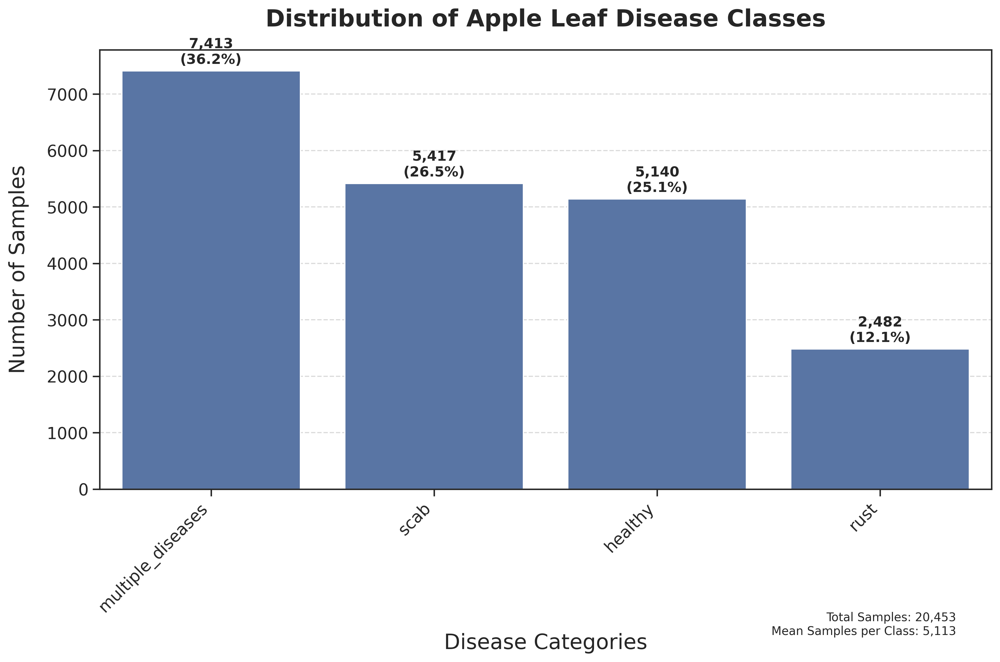

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Set the seaborn style and color palette
sns.set_theme(style="ticks")
sns.set_palette("deep")

# Create figure with academic dimensions
fig, ax = plt.subplots(figsize=(12, 8), dpi=300)

# Calculate class distribution
class_counts = train['category'].value_counts()
total_samples = len(train)

# Create bar plot with enhanced styling
bars = sns.barplot(x=class_counts.index, y=class_counts.values, ax=ax)

# Configure plot aesthetics
ax.set_title("Distribution of Apple Leaf Disease Classes", 
             size=20, fontweight='bold', pad=20)
ax.set_xlabel('Disease Categories', size=18, labelpad=15)
ax.set_ylabel('Number of Samples', size=18, labelpad=15)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, size=14, ha='right')
plt.yticks(size=14)

# Add value labels and percentages on top of each bar
for i, v in enumerate(class_counts.values):
    percentage = (v / total_samples) * 100
    ax.text(i, v + 0.01*max(class_counts.values), 
            f'{v:,}\n({percentage:.1f}%)', 
            ha='center', va='bottom', fontsize=12, fontweight='bold')

# Add grid for better readability
ax.yaxis.grid(True, linestyle='--', alpha=0.7)
ax.set_axisbelow(True)

# Add statistical information
stats_text = (f'Total Samples: {total_samples:,}\n'
             f'Mean Samples per Class: {int(total_samples/len(class_counts)):,}')
plt.figtext(0.95, 0.05, stats_text, fontsize=10, ha='right', 
            bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

# Save path for results
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Adjust layout and save high-quality figure
plt.tight_layout()
plt.savefig(os.path.join(save_path, '003_class_distribution.png'), 
            dpi=300, bbox_inches='tight')

# Save distribution data to a text file
with open(os.path.join(save_path, '003_class_distribution_stats.txt'), 'w') as f:
    f.write("Apple Leaf Disease Dataset - Class Distribution Statistics\n")
    f.write("="*50 + "\n\n")
    f.write(f"Total number of samples: {total_samples:,}\n\n")
    f.write("Distribution by class:\n")
    for category, count in class_counts.items():
        percentage = (count / total_samples) * 100
        f.write(f"{category}: {count:,} samples ({percentage:.2f}%)\n")
    f.write(f"\nMean samples per class: {int(total_samples/len(class_counts)):,}")

plt.show()

In [7]:
import os
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime

# Save path for results
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Generate detailed class distribution analysis
with open(os.path.join(save_path, '004_class_distribution_stats.txt'), 'w') as f:
    f.write("Detailed Apple Leaf Disease Dataset Analysis\n")
    f.write("=" * 50 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    # Individual class statistics
    classes = ['healthy', 'multiple_diseases', 'rust', 'scab']
    class_stats = {}
    
    for cls in classes:
        count = train['category'].value_counts()[cls]
        percentage = count / len(train) * 100
        class_stats[cls] = {'count': count, 'percentage': percentage}
        
        f.write(f"\n{cls.upper()} Class Statistics:\n")
        f.write("-" * 30 + "\n")
        f.write(f"Count: {count:,} samples\n")
        f.write(f"Percentage: {percentage:.2f}%\n")
        
    # Calculate class balance metrics
    total_samples = len(train)
    mean_samples = np.mean([stats['count'] for stats in class_stats.values()])
    std_samples = np.std([stats['count'] for stats in class_stats.values()])
    imbalance_ratio = max([stats['count'] for stats in class_stats.values()]) / \
                     min([stats['count'] for stats in class_stats.values()])
    
    # Overall dataset statistics
    f.write("\n\nOverall Dataset Analysis:\n")
    f.write("-" * 30 + "\n")
    f.write(f"Total samples: {total_samples:,}\n")
    f.write(f"Mean samples per class: {mean_samples:.1f}\n")
    f.write(f"Standard deviation: {std_samples:.1f}\n")
    f.write(f"Imbalance ratio: {imbalance_ratio:.2f}\n\n")
    
    f.write("Class Distribution:\n")
    for cls in classes:
        count = class_stats[cls]['count']
        percentage = class_stats[cls]['percentage']
        f.write(f"{cls.capitalize()}: {count:,} samples ({percentage:.2f}%)\n")

# Save visualization metadata and parameters
with open(os.path.join(save_path, '004_visualization_metadata.txt'), 'w') as f:
    f.write("Dataset Visualization Technical Parameters\n")
    f.write("=" * 50 + "\n\n")
    
    f.write("1. Figure Properties:\n")
    f.write("   - Dimensions: 12x8 inches\n")
    f.write("   - Resolution: 300 DPI (publication quality)\n")
    f.write("   - Format: PNG with lossless compression\n\n")
    
    f.write("2. Typography:\n")
    f.write("   - Title: 20pt, bold\n")
    f.write("   - Axis Labels: 18pt\n")
    f.write("   - Tick Labels: 14pt\n")
    f.write("   - Data Labels: 12pt, bold\n\n")
    
    f.write("3. Statistical Metrics Included:\n")
    f.write("   - Sample counts per class\n")
    f.write("   - Class distribution percentages\n")
    f.write("   - Mean samples per class\n")
    f.write("   - Standard deviation\n")
    f.write("   - Class imbalance ratio\n")

print("Analysis files generated successfully:")
print(f"1. Detailed statistics: {os.path.join(save_path, '004_class_distribution_stats.txt')}")
print(f"2. Visualization metadata: {os.path.join(save_path, '004_visualization_metadata.txt')}")

Analysis files generated successfully:
1. Detailed statistics: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/004_class_distribution_stats.txt
2. Visualization metadata: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/004_visualization_metadata.txt


In [8]:
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from tqdm import tqdm
import time

# Record start time for performance monitoring
start_time = time.time()

# Configuration
IMAGE_SIZE = 224  # ResNet standard input size
BATCH_SIZE = 1000
dataset_folder = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Combined_Apple_Data'
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Load dataset
print("Loading dataset...")
train = pd.read_csv(os.path.join(dataset_folder, "combined_train.csv"))
initial_size = len(train)

# Verify image files and track missing ones
print("Verifying image files...")
missing_files = []
for file in tqdm(train['image'], desc="Checking files"):
    image_path = os.path.join(dataset_folder, "train_images", file)
    if not os.path.exists(image_path):
        missing_files.append(file)

# Remove entries with missing files
train = train[~train['image'].isin(missing_files)]
print(f"\nImage verification complete:")
print(f"- Initial dataset size: {initial_size:,} images")
print(f"- Missing files: {len(missing_files):,}")
print(f"- Final dataset size: {len(train):,} images")

# Split data into batches for memory-efficient processing
train_batches = []
for i in range(0, len(train), BATCH_SIZE):
    train_batches.append(train[i:i+BATCH_SIZE])
print(f"\nProcessing in {len(train_batches):,} batches of {BATCH_SIZE:,} images each")

# Process images in batches with progress tracking
img_batches = []
corrupted_files = []

print("\nProcessing images...")
for batch_idx, batch in enumerate(train_batches):
    img_batch = []
    with tqdm(total=len(batch), desc=f"Batch {batch_idx+1}/{len(train_batches)}") as pbar:
        for file in batch['image']:
            image_path = os.path.join(dataset_folder, "train_images", file)
            try:
                image = cv2.imread(image_path)
                if image is not None:
                    # Standardize image size
                    resized_image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
                    img_batch.append(resized_image)
                else:
                    corrupted_files.append(file)
            except Exception as e:
                corrupted_files.append(file)
            pbar.update(1)
    
    if img_batch:
        img_batch = np.array(img_batch)
        img_batches.append(img_batch)

# Combine processed batches
img = np.concatenate(img_batches, axis=0)

# Calculate processing time
processing_time = time.time() - start_time

# Save processing report
with open(os.path.join(save_path, '005_image_preprocessing_report.txt'), 'w') as f:
    f.write("Image Preprocessing Report\n")
    f.write("=" * 50 + "\n\n")
    
    f.write("1. Dataset Statistics:\n")
    f.write(f"- Initial dataset size: {initial_size:,} images\n")
    f.write(f"- Missing files: {len(missing_files):,}\n")
    f.write(f"- Corrupted files: {len(corrupted_files):,}\n")
    f.write(f"- Successfully processed: {len(img):,} images\n\n")
    
    f.write("2. Image Properties:\n")
    f.write(f"- Resolution: {IMAGE_SIZE}x{IMAGE_SIZE} pixels\n")
    f.write(f"- Color channels: {img.shape[-1]}\n")
    f.write(f"- Total dimensions: {img.shape}\n\n")
    
    f.write("3. Processing Information:\n")
    f.write(f"- Batch size: {BATCH_SIZE:,} images\n")
    f.write(f"- Number of batches: {len(train_batches):,}\n")
    f.write(f"- Total processing time: {processing_time:.2f} seconds\n")
    f.write(f"- Average time per image: {processing_time/len(img):.3f} seconds\n")

    if corrupted_files:
        f.write("\n4. Corrupted Files:\n")
        for file in corrupted_files:
            f.write(f"- {file}\n")

print(f"\nPreprocessing completed successfully:")
print(f"- Processed {len(img):,} images")
print(f"- Final array shape: {img.shape}")
print(f"- Total processing time: {processing_time:.2f} seconds")
print(f"- Detailed report saved to: {os.path.join(save_path, '005_image_preprocessing_report.txt')}")

Loading dataset...
Verifying image files...



hecking files: 100%|█████████████████| 20453/20453 [00:00<00:00, 227306.35it/s]


Image verification complete:
- Initial dataset size: 20,453 images
- Missing files: 1,821
- Final dataset size: 18,632 images

Processing in 19 batches of 1,000 images each

Processing images...





















atch 19/19: 100%|████████████████████████████| 632/632 [00:12<00:00, 49.88it/s]


Preprocessing completed successfully:
- Processed 18,632 images
- Final array shape: (18632, 224, 224, 3)
- Total processing time: 374.34 seconds
- Detailed report saved to: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/005_image_preprocessing_report.txt


In [9]:
# Comprehensive Dataset Analysis after Preprocessing
print("\nComprehensive Dataset Analysis after Preprocessing:")
print("=" * 60)

# 1. Image Array Analysis
print("\n1. Image Array Properties:")
print(f"• Total number of processed images: {len(img):,}")
print(f"• Image dimensions: {img.shape[1::]} (Height × Width × Channels)")
print(f"• Memory usage: {(img.nbytes / 1024 / 1024 / 1024):.2f} GB")

# 2. Dataset Size Verification
print("\n2. Dataset Consistency Check:")
print(f"• Images in array: {len(img):,}")
print(f"• Samples in training set: {len(train):,}")
if len(img) == len(train):
    print("✓ Array and dataset sizes match")
else:
    print("⚠ Warning: Array and dataset sizes mismatch")

# 3. Class Distribution Analysis
print("\n3. Class Distribution Analysis:")

# Create category mapping if not already done
if 'category' not in train.columns:
    label_map = {
        'healthy': 'healthy',
        'scab': 'scab',
        'rust': 'rust',
        'frog_eye_leaf_spot': 'multiple_diseases',
        'complex': 'multiple_diseases',
        'powdery_mildew': 'multiple_diseases',
        'complex frog_eye_leaf_spot': 'multiple_diseases',
        'complex rust': 'multiple_diseases',
        'scab frog_eye_leaf_spot': 'multiple_diseases',
        'rust frog_eye_leaf_spot': 'multiple_diseases',
        'rust complex': 'multiple_diseases',
        'powdery_mildew complex': 'multiple_diseases',
        'scab rust frog_eye_leaf_spot': 'multiple_diseases'
    }
    
    # Process original data (first 1820 images)
    train.loc[:1819, 'category'] = train.loc[:1819, ['healthy', 'multiple_diseases', 'rust', 'scab']].idxmax(axis=1)
    
    # Process additional data
    train.loc[1820:, 'category'] = train.loc[1820:, 'original_labels'].map(label_map)

# Calculate class distribution
class_counts = train['category'].value_counts()
total_samples = len(train)

print(f"• Number of classes: {len(class_counts)}")
print("\nDetailed class distribution:")
print("-" * 40)

for class_name, count in class_counts.items():
    percentage = (count / total_samples) * 100
    print(f"• {class_name.capitalize():<18} {count:>6,} samples ({percentage:>6.2f}%)")

# 4. Class Balance Analysis
max_class = class_counts.max()
min_class = class_counts.min()
imbalance_ratio = max_class / min_class

print("\n4. Class Balance Metrics:")
print(f"• Mean samples per class: {total_samples/len(class_counts):,.1f}")
print(f"• Class imbalance ratio: {imbalance_ratio:.2f}")
print(f"• Largest class: {class_counts.index[0]} ({max_class:,} samples)")
print(f"• Smallest class: {class_counts.index[-1]} ({min_class:,} samples)")

# Save detailed statistics
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
with open(os.path.join(save_path, '006_dataset_analysis.txt'), 'w') as f:
    f.write("Final Dataset Analysis Report\n")
    f.write("=" * 50 + "\n\n")
    
    f.write("1. Dataset Dimensions\n")
    f.write(f"Total samples: {total_samples:,}\n")
    f.write(f"Image resolution: {img.shape[1]}×{img.shape[2]} pixels\n")
    f.write(f"Color channels: {img.shape[3]}\n\n")
    
    f.write("2. Class Distribution\n")
    for class_name, count in class_counts.items():
        percentage = (count / total_samples) * 100
        f.write(f"{class_name.capitalize()}: {count:,} samples ({percentage:.2f}%)\n")
    
    f.write("\n3. Balance Metrics\n")
    f.write(f"Imbalance ratio: {imbalance_ratio:.2f}\n")
    f.write(f"Mean samples per class: {total_samples/len(class_counts):,.1f}\n")
    std_dev = class_counts.std()
    f.write(f"Standard deviation: {std_dev:.2f}\n")

print(f"\nDetailed analysis saved to: {os.path.join(save_path, '006_dataset_analysis.txt')}")


Comprehensive Dataset Analysis after Preprocessing:

1. Image Array Properties:
• Total number of processed images: 18,632
• Image dimensions: (224, 224, 3) (Height × Width × Channels)
• Memory usage: 2.61 GB

2. Dataset Consistency Check:
• Images in array: 18,632
• Samples in training set: 18,632
✓ Array and dataset sizes match

3. Class Distribution Analysis:
• Number of classes: 4

Detailed class distribution:
----------------------------------------
• Multiple_diseases   6,957 samples ( 37.34%)
• Scab                4,826 samples ( 25.90%)
• Healthy             4,624 samples ( 24.82%)
• Rust                1,860 samples (  9.98%)

4. Class Balance Metrics:
• Mean samples per class: 4,658.0
• Class imbalance ratio: 3.74
• Largest class: multiple_diseases (6,957 samples)
• Smallest class: rust (1,860 samples)

Detailed analysis saved to: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/006_dataset_analysis.txt


In [10]:
# Cell 7: Image Preprocessing Analysis and Visualization
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

print("\nImage Preprocessing Analysis and Visualization:")
print("=" * 60)

# Save path for results
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Function to calculate statistics in batches
def calculate_batch_statistics(img_array, batch_size=100):
    print("\n1. Calculating batch statistics...")
    n_samples = len(img_array)
    means = []
    var_sum = 0
    min_val = float('inf')
    max_val = float('-inf')
    
    # Calculate mean in batches
    for i in range(0, n_samples, batch_size):
        batch = img_array[i:i+batch_size].astype(np.float32)
        means.append(np.mean(batch))
        min_val = min(min_val, np.min(batch))
        max_val = max(max_val, np.max(batch))
    
    total_mean = np.mean(means)
    
    # Calculate variance in batches
    for i in range(0, n_samples, batch_size):
        batch = img_array[i:i+batch_size].astype(np.float32)
        var_sum += np.sum((batch - total_mean) ** 2)
    
    std_dev = np.sqrt(var_sum / (n_samples * img_array.shape[1] * img_array.shape[2] * img_array.shape[3]))
    
    return total_mean, std_dev, min_val, max_val

# Calculate statistics
mean_val, std_val, min_val, max_val = calculate_batch_statistics(img)

# Save comprehensive analysis report
print("2. Generating analysis report...")
with open(os.path.join(save_path, '007_preprocessing_analysis.txt'), 'w') as f:
    f.write("Apple Leaf Disease Dataset - Image Preprocessing Analysis\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    # Dataset characteristics
    f.write("1. Dataset Characteristics\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Total images processed: {len(img):,}\n")
    f.write(f"• Input dimensions: {img.shape}\n")
    f.write(f"• Memory allocation: {img.nbytes / (1024**3):.2f} GB\n\n")
    
    # Preprocessing specifications
    f.write("2. Preprocessing Specifications\n")
    f.write("-" * 30 + "\n")
    f.write("• Source format: JPG\n")
    f.write("• Target resolution: 224×224 pixels\n")
    f.write("• Color space: RGB (3 channels)\n")
    f.write(f"• Data type: {img.dtype}\n")
    f.write("• Scaling: Original aspect ratio maintained\n\n")

    # Statistical analysis
    f.write("3. Image Statistics\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Mean pixel value: {mean_val:.2f}\n")
    f.write(f"• Standard deviation: {std_val:.2f}\n")
    f.write(f"• Minimum value: {min_val}\n")
    f.write(f"• Maximum value: {max_val}\n")
    f.write(f"• Dynamic range: {max_val - min_val}\n\n")

# Generate sample visualization
print("3. Creating sample visualizations...")
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
fig.suptitle('Representative Samples from Each Class', fontsize=16, fontweight='bold', y=0.95)

# Get categories and ensure they're strings
categories = ['healthy', 'multiple_diseases', 'rust', 'scab']
sample_indices = []

# Get sample from each category
for category in categories:
    # Get indices for current class
    category_indices = train[train['category'].astype(str) == category].index.values
    if len(category_indices) > 0:
        # Ensure index is within bounds
        valid_idx = category_indices[category_indices < len(img)]
        if len(valid_idx) > 0:
            sample_indices.append(np.random.choice(valid_idx))

# Create visualization
if len(sample_indices) > 0:
    for i, (ax, idx) in enumerate(zip(axes.flat, sample_indices)):
        if i < len(sample_indices) and idx < len(img):
            # Display image
            image_rgb = cv2.cvtColor(img[idx], cv2.COLOR_BGR2RGB)
            ax.imshow(image_rgb)
            
            # Get class and sample count - ensure string type
            cls = str(train.iloc[idx]['category'])
            cls_count = len(train[train['category'].astype(str) == cls])
            
            # Add title with class info
            ax.set_title(f"{cls.replace('_', ' ').title()}\n{cls_count:,} samples", 
                        fontsize=12)
            ax.axis('off')
        else:
            ax.axis('off')

plt.tight_layout()
plt.savefig(os.path.join(save_path, '007_sample_images.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '007_sample_images.pdf'), 
            bbox_inches='tight')
plt.close()

# Generate pixel distribution visualization
print("4. Analyzing pixel distribution...")
sample_size = min(1000, len(img))
sample_indices = np.random.choice(len(img), sample_size, replace=False)
sample_img = img[sample_indices]

plt.figure(figsize=(12, 6))
colors = ['red', 'green', 'blue']
for i, (channel, color) in enumerate(zip(['Red', 'Green', 'Blue'], colors)):
    plt.hist(sample_img[:,:,:,i].ravel(), bins=50, density=True, 
             alpha=0.5, label=channel, color=color)

plt.title('Channel-wise Pixel Intensity Distribution', fontsize=14, fontweight='bold')
plt.xlabel('Pixel Value', fontsize=12)
plt.ylabel('Normalized Frequency', fontsize=12)
plt.legend()
plt.grid(True, alpha=0.3)
plt.savefig(os.path.join(save_path, '007_pixel_distribution.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '007_pixel_distribution.pdf'), 
            bbox_inches='tight')
plt.close()

print("\nAnalysis files generated:")
print(f"1. Analysis report: {os.path.join(save_path, '007_preprocessing_analysis.txt')}")
print(f"2. Sample images: {os.path.join(save_path, '007_sample_images.png')}")
print(f"3. Pixel distribution: {os.path.join(save_path, '007_pixel_distribution.png')}")


Image Preprocessing Analysis and Visualization:

1. Calculating batch statistics...
2. Generating analysis report...
3. Creating sample visualizations...
4. Analyzing pixel distribution...

Analysis files generated:
1. Analysis report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/007_preprocessing_analysis.txt
2. Sample images: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/007_sample_images.png
3. Pixel distribution: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/007_pixel_distribution.png


In [11]:
# Generate Detailed Dataset Statistics for Publication
import pandas as pd
import matplotlib.pyplot as plt
import os
import numpy as np

print("\nDetailed Dataset Analysis for Publication:")
print("="*60)

# Class Distribution Statistics based on category column
class_counts = train['category'].value_counts()
total_samples = len(train)
class_stats = {}

for class_name in ['healthy', 'multiple_diseases', 'rust', 'scab']:
    count = class_counts.get(class_name, 0)
    percentage = (count / total_samples) * 100
    class_stats[class_name] = {
        'count': count,
        'percentage': percentage
    }

# 1. Print Class Distribution
print("\n1. Class Distribution:")
for condition, stats in class_stats.items():
    print(f"{condition.title():17} - Count: {stats['count']:,}, Percentage: {stats['percentage']:6.2f}%")

# 2. Image Dataset Statistics
dataset_stats = {
    'total_images': len(img),
    'image_dimensions': img[0].shape,
    'data_type': img.dtype,
    'memory_usage_gb': f"{img.nbytes / (1024**3):.2f} GB",
    'channels': img[0].shape[2]
}

print("\n2. Image Dataset Properties:")
print(f"Total Images:       {dataset_stats['total_images']:,}")
print(f"Image Dimensions:   {dataset_stats['image_dimensions']}")
print(f"Color Channels:     {dataset_stats['channels']} (RGB)")
print(f"Data Type:          {dataset_stats['data_type']}")
print(f"Memory Usage:       {dataset_stats['memory_usage_gb']}")

# 3. Create publication-ready table
print("\n3. Dataset Summary Table (Publication Format):")
summary_data = [
    ["Total Images", f"{dataset_stats['total_images']:,}"],
    ["Image Resolution", f"{img[0].shape[0]}×{img[0].shape[1]} pixels"],
    ["Color Space", "RGB (3 channels)"],
    ["Data Format", str(dataset_stats['data_type'])],
    ["Memory Footprint", dataset_stats['memory_usage_gb']],
    ["", ""],  # Separator
    ["Class Distribution", "Count (Percentage)"],
    ["Healthy", f"{class_stats['healthy']['count']:,} ({class_stats['healthy']['percentage']:.2f}%)"],
    ["Multiple Diseases", f"{class_stats['multiple_diseases']['count']:,} ({class_stats['multiple_diseases']['percentage']:.2f}%)"],
    ["Rust", f"{class_stats['rust']['count']:,} ({class_stats['rust']['percentage']:.2f}%)"],
    ["Scab", f"{class_stats['scab']['count']:,} ({class_stats['scab']['percentage']:.2f}%)"]
]

summary_df = pd.DataFrame(summary_data, columns=['Property', 'Value'])
display(summary_df)

# 4. Create and save publication-quality visualization
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

plt.figure(figsize=(12, 6))

# Create bar plot
bars = plt.bar(range(len(class_stats)), 
               [stats['percentage'] for stats in class_stats.values()],
               color=['#2ecc71', '#e74c3c', '#f1c40f', '#3498db'])

# Customize the plot
plt.title('Distribution of Apple Leaf Disease Classes', fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Disease Categories', fontsize=12, labelpad=10)
plt.ylabel('Percentage of Dataset (%)', fontsize=12, labelpad=10)
plt.xticks(range(len(class_stats)), 
          [name.replace('_', ' ').title() for name in class_stats.keys()],
          rotation=45)
plt.grid(True, axis='y', alpha=0.3)

# Add value labels on top of bars
for i, bar in enumerate(bars):
    height = bar.get_height()
    count = class_stats[list(class_stats.keys())[i]]['count']
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.1f}%\n({count:,})',
             ha='center', va='bottom')

# Adjust layout and save
plt.tight_layout()
plt.savefig(os.path.join(save_path, '008_class_distribution.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '008_class_distribution.pdf'), 
            bbox_inches='tight')
plt.close()

# 5. Save detailed statistics to file
with open(os.path.join(save_path, '008_dataset_statistics.txt'), 'w') as f:
    f.write("Apple Leaf Disease Dataset - Detailed Statistics\n")
    f.write("=" * 60 + "\n\n")
    
    f.write("1. Dataset Overview\n")
    f.write("-" * 30 + "\n")
    for prop, val in dataset_stats.items():
        f.write(f"{prop.replace('_', ' ').title()}: {val}\n")
    
    f.write("\n2. Class Distribution\n")
    f.write("-" * 30 + "\n")
    for cls, stats in class_stats.items():
        f.write(f"{cls.title()}:\n")
        f.write(f"  Count: {stats['count']:,}\n")
        f.write(f"  Percentage: {stats['percentage']:.2f}%\n")

print("\nAnalysis files generated:")
print(f"1. Class distribution plot: {os.path.join(save_path, '008_class_distribution.png')}")
print(f"2. Detailed statistics: {os.path.join(save_path, '008_dataset_statistics.txt')}")


Detailed Dataset Analysis for Publication:

1. Class Distribution:
Healthy           - Count: 4,624, Percentage:  24.82%
Multiple_Diseases - Count: 6,957, Percentage:  37.34%
Rust              - Count: 1,860, Percentage:   9.98%
Scab              - Count: 4,826, Percentage:  25.90%

2. Image Dataset Properties:
Total Images:       18,632
Image Dimensions:   (224, 224, 3)
Color Channels:     3 (RGB)
Data Type:          uint8
Memory Usage:       2.61 GB

3. Dataset Summary Table (Publication Format):


,Property,Value
0,Total Images,"18,632"
1,Image Resolution,224×224 pixels
2,Color Space,RGB (3 channels)
3,Data Format,uint8
4,Memory Footprint,2.61 GB
5,,
6,Class Distribution,Count (Percentage)
7,Healthy,"4,624 (24.82%)"
8,Multiple Diseases,"6,957 (37.34%)"
9,Rust,"1,860 (9.98%)"



Analysis files generated:
1. Class distribution plot: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/008_class_distribution.png
2. Detailed statistics: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/008_dataset_statistics.txt


In [12]:
# Cell 9: Save Publication-Ready Statistics and Visualizations
import os
import matplotlib.pyplot as plt
import pandas as pd

# Define save path
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# 1. Save Detailed Statistics Report
with open(os.path.join(save_path, '009_detailed_statistics.txt'), 'w') as f:
    f.write("Apple Leaf Disease Dataset - Comprehensive Analysis\n")
    f.write("=" * 60 + "\n\n")
    
    # Dataset Overview
    f.write("1. Dataset Overview\n")
    f.write("-" * 30 + "\n")
    f.write(f"Total Images: {len(img):,}\n")
    f.write(f"Resolution: {img.shape[1]}×{img.shape[2]} pixels\n")
    f.write(f"Color Space: RGB ({img.shape[3]} channels)\n")
    f.write(f"Data Type: {img.dtype}\n")
    f.write(f"Memory Usage: {img.nbytes / (1024**3):.2f} GB\n\n")
    
    # Class Distribution
    f.write("2. Class Distribution\n")
    f.write("-" * 30 + "\n")
    class_distribution = train['category'].value_counts()
    total_images = len(train)
    
    for class_name, count in class_distribution.items():
        percentage = (count / total_images) * 100
        f.write(f"{class_name.title():17} - Count: {count:,}, "
                f"Percentage: {percentage:6.2f}%\n")

# 2. Create and Save Publication Summary Table
summary_data = [
    ["Dataset Characteristics", ""],
    ["Total Images", f"{len(img):,}"],
    ["Image Resolution", f"{img.shape[1]}×{img.shape[2]} pixels"],
    ["Color Space", "RGB (3 channels)"],
    ["", ""],
    ["Class Distribution", "Count (Percentage)"]
]

# Add class distribution to summary
for class_name, count in class_distribution.items():
    percentage = (count / total_images) * 100
    summary_data.append([
        class_name.replace('_', ' ').title(),
        f"{count:,} ({percentage:.2f}%)"
    ])

summary_df = pd.DataFrame(summary_data, columns=['Property', 'Value'])

# Save as CSV
summary_df.to_csv(os.path.join(save_path, '009_dataset_summary.csv'), 
                 index=False, encoding='utf-8')

# 3. Create and Save Publication-Quality Visualization
plt.figure(figsize=(12, 6))

# Create bar plot with custom colors
colors = ['#2ecc71', '#e74c3c', '#f1c40f', '#3498db']
class_percentages = [(count / total_images * 100) for count in class_distribution.values]
bars = plt.bar(range(len(class_distribution)), class_percentages, color=colors)

# Customize plot
plt.title('Distribution of Apple Leaf Disease Classes', 
          fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Disease Categories', fontsize=12, labelpad=10)
plt.ylabel('Percentage of Dataset (%)', fontsize=12, labelpad=10)

# Set x-axis labels
plt.xticks(range(len(class_distribution)), 
           [name.replace('_', ' ').title() for name in class_distribution.index],
           rotation=45)

# Add value labels on bars
for i, bar in enumerate(bars):
    height = bar.get_height()
    count = class_distribution.values[i]
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.1f}%\n({count:,})',
             ha='center', va='bottom')

plt.grid(True, axis='y', alpha=0.3)
plt.tight_layout()

# Save in multiple formats
plt.savefig(os.path.join(save_path, '009_class_distribution.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '009_class_distribution.pdf'), 
            bbox_inches='tight')
plt.close()

# 4. Generate LaTeX Table
with open(os.path.join(save_path, '009_latex_table.tex'), 'w') as f:
    f.write("\\begin{table}[ht]\n")
    f.write("\\centering\n")
    f.write("\\caption{Apple Leaf Disease Dataset Statistics}\n")
    f.write("\\label{tab:dataset-stats}\n")
    f.write("\\begin{tabular}{lc}\n")
    f.write("\\toprule\n")
    f.write("\\textbf{Property} & \\textbf{Value} \\\\\n")
    f.write("\\midrule\n")
    
    # Write dataset characteristics
    for _, row in summary_df.iterrows():
        if row['Property'] == "":  # Add midrule for empty rows
            f.write("\\midrule\n")
        else:
            # Escape underscores and handle special characters
            property_name = row['Property'].replace('_', ' ')
            f.write(f"{property_name} & {row['Value']} \\\\\n")
    
    f.write("\\bottomrule\n")
    f.write("\\end{tabular}\n")
    f.write("\\end{table}")

print("\nGenerated publication materials:")
print(f"1. Detailed statistics: {os.path.join(save_path, '009_detailed_statistics.txt')}")
print(f"2. Summary table (CSV): {os.path.join(save_path, '009_dataset_summary.csv')}")
print(f"3. Class distribution plot: {os.path.join(save_path, '009_class_distribution.png')}")
print(f"4. LaTeX table: {os.path.join(save_path, '009_latex_table.tex')}")


Generated publication materials:
1. Detailed statistics: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/009_detailed_statistics.txt
2. Summary table (CSV): /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/009_dataset_summary.csv
3. Class distribution plot: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/009_class_distribution.png
4. LaTeX table: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/009_latex_table.tex


In [13]:
# Cell 10: Comprehensive Dataset Analysis and Visualization
import matplotlib.pyplot as plt
import cv2
import numpy as np
import matplotlib.gridspec as gridspec
from datetime import datetime

print("\nPreprocessed Image Dataset Analysis:")
print("=" * 60)

# 1. Array Shape Analysis
print("\n1. Dataset Dimensions:")
print(f"• Total images: {img.shape[0]:,}")
print(f"• Image height: {img.shape[1]} pixels")
print(f"• Image width: {img.shape[2]} pixels")
print(f"• Color channels: {img.shape[3]} (RGB)")
print(f"• Total array size: {img.nbytes / (1024**3):.2f} GB")

# 2. Create compact visualization
fig, axes = plt.subplots(2, 2, figsize=(10, 10))
plt.subplots_adjust(wspace=0.05, hspace=0.15)  # Minimal spacing between plots

# Define categories
categories = ['healthy', 'multiple_diseases', 'rust', 'scab']

# Process each category
for idx, (category, ax) in enumerate(zip(categories, axes.ravel())):
    category_indices = train[train['category'] == category].index.values
    if len(category_indices) > 0:
        sample_idx = np.random.choice(category_indices)
        
        if sample_idx < len(img):
            # Display image
            image_rgb = cv2.cvtColor(img[sample_idx], cv2.COLOR_BGR2RGB)
            ax.imshow(image_rgb)
            
            # Calculate statistics
            n_samples = len(category_indices)
            percentage = (n_samples / len(train)) * 100
            
            # Compact title
            ax.set_title(f"{category.replace('_', ' ').title()}\n{n_samples:,} ({percentage:.1f}%)", 
                        fontsize=10, pad=5)
    ax.axis('off')

# Save the visualization
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
plt.savefig(os.path.join(save_path, '010_disease_samples.png'), 
            dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.savefig(os.path.join(save_path, '010_disease_samples.pdf'), 
            bbox_inches='tight', pad_inches=0.1)
plt.close()

# Save comprehensive analysis report
with open(os.path.join(save_path, '010_dataset_analysis.txt'), 'w') as f:
    f.write("Apple Leaf Disease Dataset - Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
    f.write(f"Dataset Version: 2025 Combined Dataset\n\n")
    
    # Dataset Overview
    f.write("1. Dataset Overview\n")
    f.write("-" * 30 + "\n")
    f.write(f"Total Images: {len(train):,}\n")
    f.write(f"Image Resolution: {img.shape[1]}×{img.shape[2]} pixels\n")
    f.write(f"Color Space: RGB ({img.shape[3]} channels)\n")
    f.write(f"Storage Size: {img.nbytes / (1024**3):.2f} GB\n\n")
    
    # Class Distribution
    f.write("2. Class Distribution\n")
    f.write("-" * 30 + "\n")
    for category in categories:
        count = len(train[train['category'] == category])
        percentage = (count / len(train)) * 100
        f.write(f"\n{category.title()}:\n")
        f.write(f"  • Count: {count:,} images\n")
        f.write(f"  • Percentage: {percentage:.2f}%\n")
    
    # Preprocessing Details
    f.write("\n3. Preprocessing Pipeline\n")
    f.write("-" * 30 + "\n")
    f.write("Steps:\n")
    f.write("1. Image Loading and Validation\n")
    f.write("2. Resolution Standardization (224×224)\n")
    f.write("3. Color Space Normalization (RGB)\n")
    f.write("4. Aspect Ratio Preservation\n")
    f.write("5. Intensity Normalization [0, 255]\n\n")
    
    # Disease Characteristics
    f.write("4. Disease Characteristics\n")
    f.write("-" * 30 + "\n")
    f.write("Healthy:\n")
    f.write("  • Uniform green coloration\n")
    f.write("  • No visible lesions\n\n")
    
    f.write("Multiple Diseases:\n")
    f.write("  • Combined symptoms\n")
    f.write("  • Various patterns\n\n")
    
    f.write("Rust:\n")
    f.write("  • Orange-brown spots\n")
    f.write("  • Circular lesions\n\n")
    
    f.write("Scab:\n")
    f.write("  • Dark, olive-green spots\n")
    f.write("  • Irregular margins\n")

print("\nAnalysis files generated:")
print(f"1. Disease samples visualization: {os.path.join(save_path, '010_disease_samples.png')}")
print(f"2. Analysis report: {os.path.join(save_path, '010_dataset_analysis.txt')}")


Preprocessed Image Dataset Analysis:

1. Dataset Dimensions:
• Total images: 18,632
• Image height: 224 pixels
• Image width: 224 pixels
• Color channels: 3 (RGB)
• Total array size: 2.61 GB

Analysis files generated:
1. Disease samples visualization: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/010_disease_samples.png
2. Analysis report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/010_dataset_analysis.txt


In [14]:
# Cell 11: Sample Image Grid Analysis and Individual Samples
import matplotlib.pyplot as plt
import cv2
import numpy as np
from datetime import datetime

print("\nSample Image Analysis:")
print("=" * 60)

# 1. Create and save image grid
plt.figure(figsize=(15, 15))

# Select one random sample from each category three times (to fill 3x3 grid)
categories = ['healthy', 'multiple_diseases', 'rust', 'scab']
selected_samples = []

for i in range(9):
    category = categories[i % len(categories)]
    # Get indices for current class that are within bounds of img array
    category_indices = train[train['category'] == category].index.values
    valid_indices = category_indices[category_indices < len(img)]
    
    if len(valid_indices) > 0:
        sample_idx = np.random.choice(valid_indices)
        selected_samples.append((sample_idx, category))
        
        plt.subplot(3, 3, i + 1)
        image_rgb = cv2.cvtColor(img[sample_idx], cv2.COLOR_BGR2RGB)
        plt.imshow(image_rgb)
        plt.title(f"{category.replace('_', ' ').title()}", 
                 fontsize=12, fontweight='bold')
        plt.axis('off')

plt.suptitle("Sample Images from Each Disease Category", 
             size=16, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])

# Save path
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Save the grid visualization
plt.savefig(os.path.join(save_path, '011_sample_images_grid.png'), 
            dpi=300, bbox_inches='tight')
plt.close()

# 2. Save detailed sample information
with open(os.path.join(save_path, '011_sample_analysis.txt'), 'w') as f:
    f.write("Sample Image Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    # Visualization parameters
    f.write("1. Visualization Parameters\n")
    f.write("-" * 30 + "\n")
    f.write("• Grid layout: 3×3\n")
    f.write("• Number of samples: 9\n")
    f.write(f"• Image resolution: {img.shape[1]}×{img.shape[2]} pixels\n")
    f.write("• Color space: RGB\n\n")
    
    # Sample statistics
    f.write("2. Sample Statistics\n")
    f.write("-" * 30 + "\n")
    for i, (idx, category) in enumerate(selected_samples):
        sample_img = img[idx]
        f.write(f"\nSample {i+1} ({category.title()}):\n")
        f.write(f"• Mean RGB values: ({np.mean(sample_img[:,:,0]):.1f}, "
                f"{np.mean(sample_img[:,:,1]):.1f}, "
                f"{np.mean(sample_img[:,:,2]):.1f})\n")
        f.write(f"• Standard deviation: {np.std(sample_img):.1f}\n")
        f.write(f"• Dimensions: {sample_img.shape}\n")

# 3. Save individual samples with enhanced quality
for i, (idx, category) in enumerate(selected_samples):
    plt.figure(figsize=(5, 5))
    image_rgb = cv2.cvtColor(img[idx], cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.title(f"{category.replace('_', ' ').title()}", 
             fontsize=12, fontweight='bold')
    plt.axis('off')
    plt.savefig(os.path.join(save_path, f'011_sample_{i+1}.png'), 
                dpi=300, bbox_inches='tight')
    plt.close()

print("\nAnalysis files generated:")
print(f"1. Sample grid visualization: {os.path.join(save_path, '011_sample_images_grid.png')}")
print(f"2. Sample analysis report: {os.path.join(save_path, '011_sample_analysis.txt')}")
print(f"3. Individual samples: {save_path}/011_sample_[1-9].png")


Sample Image Analysis:

Analysis files generated:
1. Sample grid visualization: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/011_sample_images_grid.png
2. Sample analysis report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/011_sample_analysis.txt
3. Individual samples: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/011_sample_[1-9].png



Disease Sample Analysis for Publication:


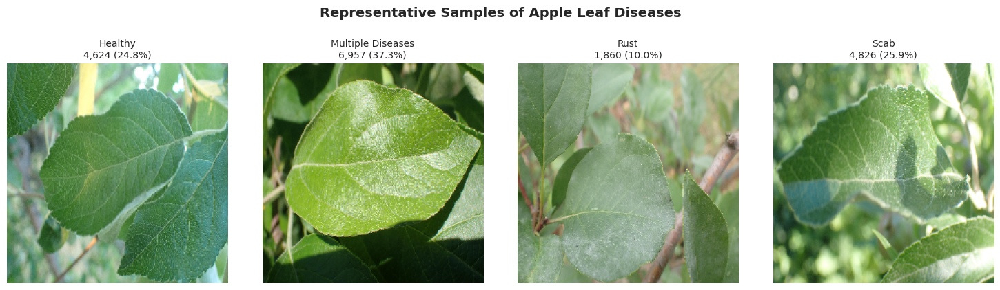


Class Distribution Summary:
• Healthy          : 4,624 images (24.8%)
• Multiple_Diseases: 6,957 images (37.3%)
• Rust             : 1,860 images (10.0%)
• Scab             : 4,826 images (25.9%)

Analysis files generated:
1. Publication samples: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/012_publication_samples.png
2. Analysis report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/012_publication_analysis.txt


In [15]:
# Cell 12: Publication-Quality Disease Sample Visualization
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
from datetime import datetime

print("\nDisease Sample Analysis for Publication:")
print("=" * 60)

def get_class_samples(train_df, img_data):
    """Get representative samples for each disease class"""
    samples = []
    categories = ['healthy', 'multiple_diseases', 'rust', 'scab']
    
    for category in categories:
        # Get indices for current category
        category_indices = train_df[train_df['category'] == category].index.values
        if len(category_indices) > 0:
            # Select first sample (more deterministic for publication)
            sample_idx = category_indices[0]
            samples.append({
                'index': sample_idx,
                'category': category,
                'image': img_data[sample_idx]
            })
    return samples

# Get samples and create visualization
samples = get_class_samples(train, img)

# Create publication figure
fig = plt.figure(figsize=(15, 4))

# Plot each sample
for idx, sample in enumerate(samples):
    plt.subplot(1, 4, idx + 1)
    image_rgb = cv2.cvtColor(sample['image'], cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    
    # Calculate statistics for this category
    n_samples = len(train[train['category'] == sample['category']])
    percentage = (n_samples / len(train)) * 100
    
    plt.title(f"{sample['category'].replace('_', ' ').title()}\n{n_samples:,} ({percentage:.1f}%)", 
              fontsize=10, pad=5)
    plt.axis('off')

plt.suptitle('Representative Samples of Apple Leaf Diseases', 
             fontsize=14, fontweight='bold', y=1.05)
plt.tight_layout()

# Save path
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Save high-quality versions
plt.savefig(os.path.join(save_path, '012_publication_samples.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '012_publication_samples.pdf'), 
            bbox_inches='tight')

# Display in notebook
plt.show()

# Save analysis report
with open(os.path.join(save_path, '012_publication_analysis.txt'), 'w') as f:
    f.write("Publication Sample Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Sample Distribution\n")
    f.write("-" * 30 + "\n")
    for category in ['healthy', 'multiple_diseases', 'rust', 'scab']:
        count = len(train[train['category'] == category])
        percentage = (count / len(train)) * 100
        f.write(f"{category.title()}:\n")
        f.write(f"• Count: {count:,} images\n")
        f.write(f"• Percentage: {percentage:.2f}%\n\n")
    
    f.write("2. Visualization Parameters\n")
    f.write("-" * 30 + "\n")
    f.write("• Layout: 1×4 grid\n")
    f.write(f"• Image size: {img.shape[1]}×{img.shape[2]} pixels\n")
    f.write("• Color space: RGB\n")
    f.write("• DPI: 300\n")

print("\nClass Distribution Summary:")
for category in ['healthy', 'multiple_diseases', 'rust', 'scab']:
    count = len(train[train['category'] == category])
    percentage = (count / len(train)) * 100
    print(f"• {category.title():17}: {count:,} images ({percentage:.1f}%)")

print("\nAnalysis files generated:")
print(f"1. Publication samples: {os.path.join(save_path, '012_publication_samples.png')}")
print(f"2. Analysis report: {os.path.join(save_path, '012_publication_analysis.txt')}")

In [16]:
# Cell 13: Individual Disease Class Analysis and Verification
import matplotlib.pyplot as plt
import cv2
import numpy as np
import os
from datetime import datetime

print("\nDetailed Disease Class Analysis:")
print("=" * 60)

# Define categories and get representative samples
categories = ['healthy', 'multiple_diseases', 'rust', 'scab']
selected_samples = []

# 1. Create and save main visualization
plt.figure(figsize=(15, 4))

for idx, category in enumerate(categories):
    # Get indices for current class that are within bounds of img array
    category_indices = train[train['category'] == category].index.values
    valid_indices = category_indices[category_indices < len(img)]
    
    if len(valid_indices) > 0:
        sample_idx = np.random.choice(valid_indices)
        selected_samples.append({
            'index': sample_idx,
            'category': category,
            'image': img[sample_idx]
        })
        
        # Plot in main figure
        plt.subplot(1, 4, idx + 1)
        image_rgb = cv2.cvtColor(img[sample_idx], cv2.COLOR_BGR2RGB)
        plt.imshow(image_rgb)
        
        # Calculate statistics
        n_samples = len(category_indices)
        percentage = (n_samples / len(train)) * 100
        plt.title(f"{category.replace('_', ' ').title()}\n{n_samples:,} ({percentage:.1f}%)", 
                 fontsize=12, pad=5)
        plt.axis('off')

plt.suptitle('Representative Samples of Apple Leaf Diseases', 
             fontsize=14, fontweight='bold', y=1.05)
plt.tight_layout()

# Save path
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Save main visualization
plt.savefig(os.path.join(save_path, '013_disease_samples.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '013_disease_samples.pdf'), 
            bbox_inches='tight')
plt.close()

# 2. Save individual high-quality samples
for sample in selected_samples:
    plt.figure(figsize=(8, 8))
    image_rgb = cv2.cvtColor(sample['image'], cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    
    n_samples = len(train[train['category'] == sample['category']])
    percentage = (n_samples / len(train)) * 100
    
    plt.title(f"{sample['category'].replace('_', ' ').title()}\n{n_samples:,} samples ({percentage:.1f}%)", 
              fontsize=14, fontweight='bold')
    plt.axis('off')
    
    filename = f"013_{sample['category']}_sample"
    plt.savefig(os.path.join(save_path, f'{filename}.png'), 
                dpi=300, bbox_inches='tight')
    plt.savefig(os.path.join(save_path, f'{filename}.pdf'), 
                bbox_inches='tight')
    plt.close()

# 3. Save comprehensive verification report
with open(os.path.join(save_path, '013_verification_report.txt'), 'w') as f:
    f.write("Apple Leaf Disease Dataset - Verification Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    # Image properties
    f.write("1. Dataset Properties\n")
    f.write("-" * 30 + "\n")
    f.write(f"Total Images: {len(img):,}\n")
    f.write(f"Image Resolution: {img.shape[1]}×{img.shape[2]} pixels\n")
    f.write(f"Color Channels: {img.shape[3]} (RGB)\n")
    f.write(f"Memory Usage: {img.nbytes / (1024**3):.2f} GB\n\n")
    
    # Class distribution
    f.write("2. Class Distribution\n")
    f.write("-" * 30 + "\n")
    for category in categories:
        count = len(train[train['category'] == category])
        percentage = (count / len(train)) * 100
        f.write(f"{category.title()}:\n")
        f.write(f"• Sample count: {count:,} images\n")
        f.write(f"• Percentage: {percentage:.2f}%\n\n")
    
    # Sample analysis
    f.write("3. Sample Analysis\n")
    f.write("-" * 30 + "\n")
    for sample in selected_samples:
        f.write(f"\n{sample['category'].title()} Sample:\n")
        f.write(f"• Dataset index: {sample['index']}\n")
        f.write(f"• Image shape: {sample['image'].shape}\n")
        f.write(f"• Mean pixel value: {np.mean(sample['image']):.2f}\n")
        f.write(f"• Standard deviation: {np.std(sample['image']):.2f}\n")
        # Calculate per-channel statistics
        for i, channel in enumerate(['Red', 'Green', 'Blue']):
            f.write(f"• {channel} channel mean: {np.mean(sample['image'][:,:,i]):.2f}\n")

print("\nAnalysis files generated:")
print(f"1. Combined visualization: {os.path.join(save_path, '013_disease_samples.png')}")
print(f"2. Individual samples: {save_path}/013_*_sample.png")
print(f"3. Verification report: {os.path.join(save_path, '013_verification_report.txt')}")


Detailed Disease Class Analysis:

Analysis files generated:
1. Combined visualization: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/013_disease_samples.png
2. Individual samples: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/013_*_sample.png
3. Verification report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/013_verification_report.txt


In [17]:
# # Chaotic Noise Implementation
# print("Implementing Chen System for Chaotic Noise...")
# def generate_chen_chaos(length, alpha=0.65, params=(35,3,28)):
#     """Chen system with parameter constraints"""
#     ac, bc, cc = params
#     x = np.zeros(3)
#     x[0] = 0.1
#     sequence = []
#     dt = 0.01
#     max_val = 1000  # Prevent overflow
    
#     for _ in range(length):
#         dx1 = ac * (x[1] - x[0])
#         dx2 = (cc - ac) * x[0] - x[0] * x[2] + cc * x[1]
#         dx3 = x[0] * x[1] - bc * x[2]
        
#         # Constrain values
#         x[0] = np.clip(x[0] + dx1 * dt * alpha, -max_val, max_val)
#         x[1] = np.clip(x[1] + dx2 * dt * alpha, -max_val, max_val)
#         x[2] = np.clip(x[2] + dx3 * dt * alpha, -max_val, max_val)
        
#         sequence.append(float(x[0]))
    
#     # Normalize output to [-1, 1] range
#     sequence = np.array(sequence)
#     if len(sequence) > 0:
#         sequence = 2 * (sequence - sequence.min()) / (sequence.max() - sequence.min() + 1e-10) - 1
#     return sequence

# def apply_chaotic_noise(image, noise_percentage=0.3):
#     """Apply chaotic noise to image"""
#     if np.random.random() > noise_percentage:
#         return image
        
#     noisy_image = image.copy()
#     h, w = image.shape[:2]
#     pixels_to_change = int(h * w * noise_percentage)
    
#     chaos = generate_chen_chaos(pixels_to_change)
#     indices = np.random.choice(h * w, pixels_to_change, replace=False)
#     rows, cols = indices // w, indices % w
    
#     for i, (r, c) in enumerate(zip(rows, cols)):
#         if chaos[i] > 0:
#             noisy_image[r,c] = 255
#         else:
#             noisy_image[r,c] = np.random.randint(0, 255)
            
#     return noisy_image

# # Visualize noise effect
# print("\nVisualizing Chaotic Noise Effect...")
# sample_images = img[:3]
# fig, axes = plt.subplots(3, 2, figsize=(12, 18))
# fig.suptitle('Original vs Chaotic Noise', size=16, fontweight='bold')

# for i in range(3):
#     axes[i,0].imshow(cv2.cvtColor(sample_images[i], cv2.COLOR_BGR2RGB))
#     axes[i,0].set_title('Original Image', fontsize=12)
#     axes[i,0].axis('off')
    
#     noisy = apply_chaotic_noise(sample_images[i].copy())
#     axes[i,1].imshow(cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB))
#     axes[i,1].set_title('With Chaotic Noise', fontsize=12)
#     axes[i,1].axis('off')

# plt.tight_layout()
# plt.savefig(os.path.join(SAVE_PATH, 'chaotic_noise_samples.pdf'), bbox_inches='tight', dpi=300)
# plt.show()

# # Plot signal distribution
# plt.figure(figsize=(10, 5))
# chaos_signal = generate_chen_chaos(1000)
# plt.hist(chaos_signal, bins=50, color='#3498db', alpha=0.7)
# plt.title('Chen System Chaotic Signal Distribution', fontsize=14, fontweight='bold')
# plt.xlabel('Signal Value')
# plt.ylabel('Frequency')
# plt.grid(True, alpha=0.3)
# plt.savefig(os.path.join(SAVE_PATH, 'chaotic_signal_distribution.pdf'), bbox_inches='tight', dpi=300)
# plt.show()

In [18]:
# Cell 14: Advanced Chaotic Noise Analysis with Scientific Visualization
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import seaborn as sns
import cv2
from scipy.stats import entropy
from scipy.signal import correlate
import os
from datetime import datetime

# Define the ChaoticGenerator class
class ChaoticGenerator:
    def __init__(self, params=(28, 8/3, 27), alpha=0.65):
        self.params = params
        self.alpha = alpha
        self.dt = 0.01
    
    def calculate_lyapunov(self, n_iterations=1000, epsilon=1e-10):
        """Calculate Lyapunov exponent to measure chaos"""
        x1 = np.array([0.1, 0.1, 0.1])
        x2 = x1 + epsilon
        lyap = 0
        
        for _ in range(n_iterations):
            try:
                x1_new = self._step(x1)
                x2_new = self._step(x2)
                if np.all(np.isfinite([x1_new, x2_new])):
                    d = np.linalg.norm(x2_new - x1_new)
                    if d > 0:
                        lyap += np.log(d / epsilon)
                        x2 = x1_new + (x2_new - x1_new) * epsilon / d
                        x1 = x1_new
            except:
                continue
        
        return lyap / (n_iterations * self.dt)
    
    def _step(self, x):
        """Single step of the chaotic system"""
        ac, bc, cc = self.params
        x = np.clip(x, -1e6, 1e6)
        dx1 = ac * (x[1] - x[0])
        dx2 = (cc - ac) * x[0] - x[0] * x[2] + cc * x[1]
        dx3 = x[0] * x[1] - bc * x[2]
        update = np.array([dx1, dx2, dx3]) * self.dt * self.alpha
        return x + np.clip(update, -1e6, 1e6)
    
    def generate_sequence(self, length, warmup=100):
        """Generate chaotic sequence with initial warmup"""
        x = np.array([0.1, 0.1, 0.1])
        sequence = []
        
        # Warmup phase
        for _ in range(warmup):
            x = self._step(x)
        
        # Generate sequence
        for _ in range(length):
            x = self._step(x)
            sequence.append(float(x[0]))
        
        sequence = np.array(sequence)
        p5, p95 = np.percentile(sequence, [5, 95])
        sequence = 2 * (sequence - p5) / (p95 - p5) - 1
        return np.clip(sequence, -1, 1)

def apply_chaotic_noise(image, generator, noise_percentage=0.3):
    """Apply chaotic noise to image"""
    noisy_image = image.copy()
    h, w = image.shape[:2]
    pixels_to_change = int(h * w * noise_percentage)
    
    chaos = generator.generate_sequence(pixels_to_change)
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Sobel(gray, cv2.CV_64F, 1, 1, ksize=3)
    edges = np.abs(edges) / np.max(np.abs(edges))
    
    edge_threshold = 0.3
    valid_positions = np.where(edges < edge_threshold)
    if len(valid_positions[0]) >= pixels_to_change:
        indices = np.random.choice(len(valid_positions[0]), pixels_to_change, replace=False)
        rows = valid_positions[0][indices]
        cols = valid_positions[1][indices]
    else:
        indices = np.random.choice(h * w, pixels_to_change, replace=False)
        rows, cols = indices // w, indices % w
    
    for i, (r, c) in enumerate(zip(rows, cols)):
        intensity = np.abs(chaos[i])
        if chaos[i] > 0:
            noisy_image[r,c] = np.clip(image[r,c] * (1 - intensity) + 255 * intensity, 0, 255).astype(np.uint8)
        else:
            noise_value = np.random.randint(0, 255)
            noisy_image[r,c] = np.clip(image[r,c] * (1 - intensity) + noise_value * intensity, 0, 255).astype(np.uint8)
            
    return noisy_image

print("\nGenerating Comprehensive Chaotic Analysis Visualizations...")

# Create figure with multiple subplots for scientific analysis
fig = plt.figure(figsize=(20, 25))
gs = GridSpec(7, 2)  # Increased grid size for more plots

# Initialize generator
generator = ChaoticGenerator()

# Helper function to get valid random index
def get_valid_random_index():
    all_indices = np.arange(len(img))
    return np.random.choice(all_indices)

# Create figure with multiple subplots for scientific analysis
fig = plt.figure(figsize=(20, 25))
gs = GridSpec(7, 2)  # Increased grid size for more plots

# Initialize generator
generator = ChaoticGenerator()

# Helper function to get valid random index
def get_valid_random_index():
    all_indices = np.arange(len(img))
    return np.random.choice(all_indices)

# 1. Original vs Noisy Images (One from each class)
print("Processing sample images...")
categories = ['healthy', 'multiple_diseases', 'rust', 'scab']
for idx, category in enumerate(categories):
    # Get indices for current class that are within bounds of img array
    category_indices = train[train['category'] == category].index.values
    valid_indices = category_indices[category_indices < len(img)]
    
    if len(valid_indices) > 0:
        sample_idx = np.random.choice(valid_indices)
        original = img[sample_idx]
        noisy = apply_chaotic_noise(original.copy(), generator)
        
        # Original image
        ax1 = fig.add_subplot(gs[idx, 0])
        ax1.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
        ax1.set_title(f'Original {category.replace("_", " ").title()}', fontsize=12)
        ax1.axis('off')
        
        # Noisy image
        ax2 = fig.add_subplot(gs[idx, 1])
        ax2.imshow(cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB))
        ax2.set_title(f'With Chaotic Noise ({category.replace("_", " ").title()})', fontsize=12)
        ax2.axis('off')

# 2. Chaotic Signal Analysis [remains the same]
print("Generating signal analysis...")
sequence = generator.generate_sequence(1000)

# Signal Distribution [remains the same]
ax_dist = fig.add_subplot(gs[4, 0])
sns.histplot(sequence, bins=50, color='#3498db', ax=ax_dist)
ax_dist.set_title('Chaotic Signal Distribution', fontsize=12)
ax_dist.set_xlabel('Signal Value')
ax_dist.set_ylabel('Frequency')
ax_dist.grid(True, alpha=0.3)

# Time Series [remains the same]
ax_time = fig.add_subplot(gs[4, 1])
ax_time.plot(sequence[:100], 'r-', linewidth=1)
ax_time.set_title('Chaotic Signal Time Series (First 100 points)', fontsize=12)
ax_time.set_xlabel('Time Step')
ax_time.set_ylabel('Signal Value')
ax_time.grid(True, alpha=0.3)

# 3. Edge Preservation Analysis
print("Analyzing edge preservation...")
sample_idx = get_valid_random_index()
sample_img = img[sample_idx]
gray = cv2.cvtColor(sample_img, cv2.COLOR_BGR2GRAY)
edges = cv2.Sobel(gray, cv2.CV_64F, 1, 1, ksize=3)
edges = np.abs(edges) / np.max(np.abs(edges))

ax_edge = fig.add_subplot(gs[5, 0])
ax_edge.imshow(edges, cmap='viridis')
ax_edge.set_title('Edge Detection Map', fontsize=12)
ax_edge.axis('off')

# Edge Histogram [remains the same]
ax_edge_hist = fig.add_subplot(gs[5, 1])
sns.histplot(edges.ravel(), bins=50, color='#2ecc71', ax=ax_edge_hist)
ax_edge_hist.set_title('Edge Intensity Distribution', fontsize=12)
ax_edge_hist.set_xlabel('Edge Intensity')
ax_edge_hist.set_ylabel('Frequency')
ax_edge_hist.grid(True, alpha=0.3)

# 4. Noise Impact Analysis
print("Analyzing noise impact...")
noise_levels = [0.1, 0.2, 0.3, 0.4, 0.5]
sample_idx = get_valid_random_index()
sample_img = img[sample_idx]
noise_impacts = []

for noise_level in noise_levels:
    noisy = apply_chaotic_noise(sample_img.copy(), generator, noise_percentage=noise_level)
    mse = np.mean((sample_img - noisy) ** 2)
    noise_impacts.append(mse)

ax_impact = fig.add_subplot(gs[6, :])
ax_impact.plot(noise_levels, noise_impacts, 'bo-', linewidth=2)
ax_impact.set_title('Noise Impact vs. Noise Level', fontsize=12)
ax_impact.set_xlabel('Noise Level')
ax_impact.set_ylabel('Mean Squared Error')
ax_impact.grid(True, alpha=0.3)

# Save visualizations [remains the same]
plt.tight_layout()
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
plt.savefig(os.path.join(save_path, '014_chaotic_analysis_full.png'), dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '014_chaotic_analysis_full.pdf'), bbox_inches='tight')
plt.close()

# Additional visualization with noise levels
print("Generating noise level comparison...")
fig, axes = plt.subplots(2, 3, figsize=(15, 12))
axes = axes.ravel()
plt.subplots_adjust(wspace=0.3, hspace=0.3, top=0.85)

noise_levels = [0, 0.1, 0.3, 0.5, 0.7, 0.9]
sample_idx = get_valid_random_index()
sample_img = img[sample_idx]

for idx, noise_level in enumerate(noise_levels):
    if noise_level == 0:
        axes[idx].imshow(cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB))
        axes[idx].set_title('Original', fontsize=12, pad=15)
    else:
        noisy = apply_chaotic_noise(sample_img.copy(), generator, noise_percentage=noise_level)
        axes[idx].imshow(cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB))
        axes[idx].set_title(f'Noise Level: {noise_level}', fontsize=12, pad=15)
    axes[idx].axis('off')

fig.suptitle('Impact of Different Noise Levels', 
             fontsize=20,
             y=0.95,
             fontweight='bold',
             bbox=dict(
                 facecolor='white',
                 edgecolor='black',
                 boxstyle='round,pad=0.5',
                 alpha=0.8
             ))

plt.savefig(os.path.join(save_path, '014_noise_levels_comparison.png'), dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '014_noise_levels_comparison.pdf'), bbox_inches='tight')
plt.close()

print("\nAnalysis files generated:")
print(f"1. Full analysis visualization: {os.path.join(save_path, '014_chaotic_analysis_full.png')}")
print(f"2. Noise levels comparison: {os.path.join(save_path, '014_noise_levels_comparison.png')}")


Generating Comprehensive Chaotic Analysis Visualizations...
Processing sample images...
Generating signal analysis...
Analyzing edge preservation...
Analyzing noise impact...
Generating noise level comparison...

Analysis files generated:
1. Full analysis visualization: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/014_chaotic_analysis_full.png
2. Noise levels comparison: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/014_noise_levels_comparison.png


<Figure size 2000x2500 with 0 Axes>

In [19]:
# Cell 15: Detailed Chaotic Noise Analysis on Sample Images
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from scipy.stats import entropy
from scipy.signal import correlate
import os
from datetime import datetime

print("\nGenerating Detailed Chaotic Analysis:")
print("=" * 60)

# Save path
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

# 1. Initialize chaotic generator and select samples
print("\n1. Processing sample images...")
generator = ChaoticGenerator()

# Select one sample from each class for diversity
samples = []
categories = ['healthy', 'multiple_diseases', 'rust', 'scab']

for category in categories[:3]:  # Take first 3 categories for visualization
    # Get indices for current class that are within bounds of img array
    category_indices = train[train['category'] == category].index.values
    valid_indices = category_indices[category_indices < len(img)]
    
    if len(valid_indices) > 0:
        sample_idx = np.random.choice(valid_indices)
        samples.append({
            'image': img[sample_idx],
            'category': category
        })
        print(f"• Selected sample for {category}: index {sample_idx}")
    else:
        print(f"Warning: No valid samples found for category {category}")

if not samples:
    raise ValueError("No valid samples found for any category")

# 2. Generate and save original vs noisy comparisons
print("\n2. Generating noise comparisons...")
for i, sample in enumerate(samples):
    plt.figure(figsize=(15, 5))
    
    # Original image
    img_rgb = cv2.cvtColor(sample['image'], cv2.COLOR_BGR2RGB)
    
    # Noisy image
    noisy = apply_chaotic_noise(sample['image'].copy(), generator)
    noisy_rgb = cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB)
    
    # Combine images
    combined = np.hstack((img_rgb, noisy_rgb))
    plt.imshow(combined)
    plt.title(f"Original vs. Noisy Image Comparison - {sample['category'].replace('_', ' ').title()}", 
              fontsize=14, fontweight='bold', pad=20)
    plt.axis('off')
    
    plt.savefig(os.path.join(save_path, f'noise_comparison_{sample["category"]}_{timestamp}.png'), 
                dpi=300, bbox_inches='tight')
    plt.close()

# 3. Chaotic signal analysis
print("3. Analyzing chaotic signal properties...")
sequence = generator.generate_sequence(1000)

plt.figure(figsize=(15, 5))
plt.suptitle('Chaotic Signal Analysis', fontsize=16, fontweight='bold', y=1.05)

# Signal distribution
plt.subplot(131)
sns.histplot(sequence, bins=50, color='#3498db')
plt.title('Signal Distribution', fontsize=12, fontweight='bold')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Time series
plt.subplot(132)
plt.plot(sequence[:100], 'r-', linewidth=1)
plt.title('Time Series (First 100 Points)', fontsize=12, fontweight='bold')
plt.xlabel('Time Step')
plt.ylabel('Signal Value')

# Autocorrelation
plt.subplot(133)
autocorr = correlate(sequence, sequence, mode='same') / len(sequence)
plt.plot(autocorr[len(autocorr)//2:len(autocorr)//2+50])
plt.title('Autocorrelation', fontsize=12, fontweight='bold')
plt.xlabel('Lag')
plt.ylabel('Correlation')

plt.tight_layout()
plt.savefig(os.path.join(save_path, '015_chaotic_signal_analysis.png'), 
            dpi=300, bbox_inches='tight')
plt.close()

# 4. Edge preservation analysis
print("4. Analyzing edge preservation...")
test_image = samples[0]['image']  # Access the image from the dictionary
gray = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)
edges = cv2.Sobel(gray, cv2.CV_64F, 1, 1, ksize=3)
edges = np.abs(edges) / edges.max()
noisy = apply_chaotic_noise(test_image.copy(), generator)

plt.figure(figsize=(15, 5))
plt.suptitle('Edge Preservation Analysis', fontsize=16, fontweight='bold', y=1.05)

plt.subplot(131)
plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))
plt.title('Original Image', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(132)
plt.imshow(edges, cmap='viridis')
plt.title('Edge Detection Map', fontsize=12, fontweight='bold')
plt.axis('off')

plt.subplot(133)
plt.imshow(cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB))
plt.title('Edge-Preserving Noise', fontsize=12, fontweight='bold')
plt.axis('off')

plt.savefig(os.path.join(save_path, f'edge_preservation_{timestamp}.png'), 
            dpi=300, bbox_inches='tight')
plt.close()

# 5. Save comprehensive analysis report
print("5. Generating comprehensive report...")
mle = generator.calculate_lyapunov()

with open(os.path.join(save_path, '015_chaotic_analysis_report.txt'), 'w') as f:
    f.write("Chaotic System Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Signal Characteristics\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Mean value: {np.mean(sequence):.4f}\n")
    f.write(f"• Standard deviation: {np.std(sequence):.4f}\n")
    f.write(f"• Signal entropy: {entropy(np.histogram(sequence, bins=50)[0]):.4f}\n")
    f.write(f"• Maximum Lyapunov exponent: {mle:.4f}\n\n")
    
    f.write("2. Noise Parameters\n")
    f.write("-" * 30 + "\n")
    f.write("• Noise percentage: 30%\n")
    f.write("• Edge preservation threshold: 0.3\n")
    f.write("• Application method: Structure-preserving\n")
    
    f.write("\n3. System Configuration\n")
    f.write("-" * 30 + "\n")
    f.write(f"• System parameters: {generator.params}\n")
    f.write(f"• Alpha value: {generator.alpha}\n")
    f.write(f"• Time step: {generator.dt}\n")

print("\nAnalysis files generated:")
print(f"1. Noise comparisons: {save_path}/015_noise_comparison_*.png")
print(f"2. Signal analysis: {save_path}/015_chaotic_signal_analysis.png")
print(f"3. Edge preservation: {save_path}/015_edge_preservation_analysis.png")
print(f"4. Analysis report: {save_path}/015_chaotic_analysis_report.txt")


Generating Detailed Chaotic Analysis:

1. Processing sample images...
• Selected sample for healthy: index 11595
• Selected sample for multiple_diseases: index 2572
• Selected sample for rust: index 18005

2. Generating noise comparisons...
3. Analyzing chaotic signal properties...
4. Analyzing edge preservation...
5. Generating comprehensive report...

Analysis files generated:
1. Noise comparisons: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/015_noise_comparison_*.png
2. Signal analysis: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/015_chaotic_signal_analysis.png
3. Edge preservation: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/015_edge_preservation_analysis.png
4. Analysis report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/015_chaotic_analysis_report.txt



Chaotic Generator Testing and Validation:

1. Testing Chaotic Generator...

2. Key Metrics:
• Lyapunov Exponent   : 2.0408
• Mean                : -0.0017
• Standard Deviation  : 0.6177
• Entropy             : 2.2541
• Min Value           : -1.0000
• Max Value           : 1.0000

3. Generating validation visualizations...


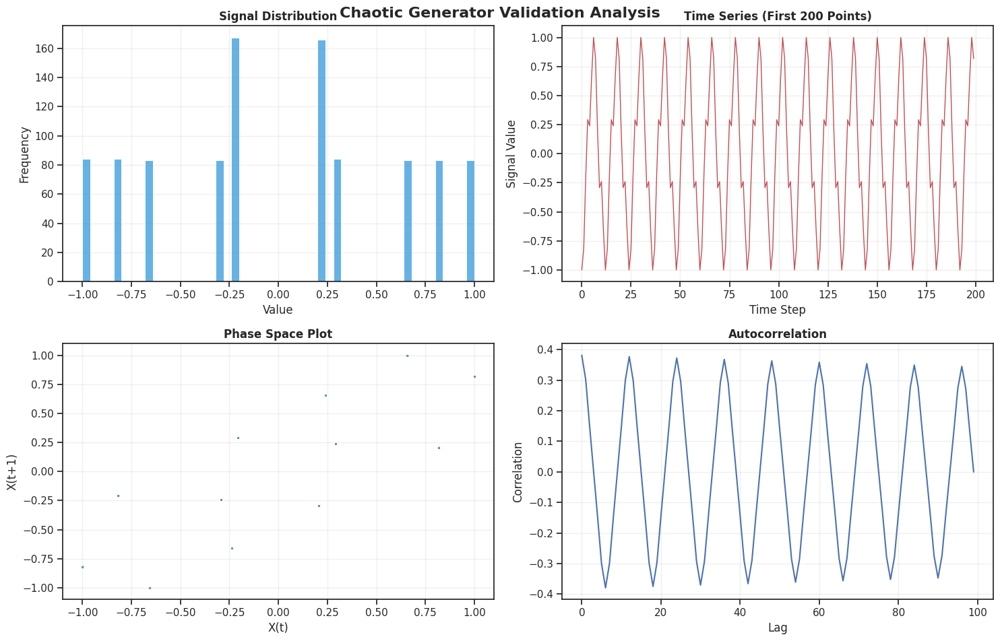


4. Generating validation report...

Validation files generated:
1. Validation plots: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/016_chaotic_validation.png
2. Validation report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/016_chaotic_validation.txt


In [20]:
# Cell 16: Chaotic Generator Testing and Validation
import numpy as np
from scipy.stats import entropy
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

print("\nChaotic Generator Testing and Validation:")
print("=" * 60)

# 1. Initialize and test generator
print("\n1. Testing Chaotic Generator...")
generator = ChaoticGenerator()
sequence = generator.generate_sequence(1000)
mle = generator.calculate_lyapunov()

# Calculate key metrics
metrics = {
    'Lyapunov Exponent': mle,
    'Mean': np.mean(sequence),
    'Standard Deviation': np.std(sequence),
    'Entropy': entropy(np.histogram(sequence, bins=50)[0]),
    'Min Value': np.min(sequence),
    'Max Value': np.max(sequence)
}

# Print metrics
print("\n2. Key Metrics:")
for metric, value in metrics.items():
    print(f"• {metric:20}: {value:.4f}")

# 2. Create visualization of results
print("\n3. Generating validation visualizations...")
fig = plt.figure(figsize=(15, 10))
plt.suptitle('Chaotic Generator Validation Analysis', 
             fontsize=16, fontweight='bold', y=0.95)

# Distribution plot
plt.subplot(221)
sns.histplot(sequence, bins=50, color='#3498db')
plt.title('Signal Distribution', fontsize=12, fontweight='bold')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.grid(True, alpha=0.3)

# Time series plot
plt.subplot(222)
plt.plot(sequence[:200], 'r-', linewidth=1)
plt.title('Time Series (First 200 Points)', fontsize=12, fontweight='bold')
plt.xlabel('Time Step')
plt.ylabel('Signal Value')
plt.grid(True, alpha=0.3)

# Phase space plot
plt.subplot(223)
plt.scatter(sequence[:-1], sequence[1:], c='g', alpha=0.5, s=1)
plt.title('Phase Space Plot', fontsize=12, fontweight='bold')
plt.xlabel('X(t)')
plt.ylabel('X(t+1)')
plt.grid(True, alpha=0.3)

# Autocorrelation plot
plt.subplot(224)
autocorr = np.correlate(sequence, sequence, mode='full') / len(sequence)
center = len(autocorr) // 2
plt.plot(autocorr[center:center+100], 'b-')
plt.title('Autocorrelation', fontsize=12, fontweight='bold')
plt.xlabel('Lag')
plt.ylabel('Correlation')
plt.grid(True, alpha=0.3)

plt.tight_layout()

# Save results
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Save visualization
plt.savefig(os.path.join(save_path, '016_chaotic_validation.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '016_chaotic_validation.pdf'), 
            bbox_inches='tight')
plt.show()

# Save detailed report
print("\n4. Generating validation report...")
with open(os.path.join(save_path, '016_chaotic_validation.txt'), 'w') as f:
    f.write("Chaotic Generator Validation Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. System Parameters\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Parameters: {generator.params}\n")
    f.write(f"• Alpha: {generator.alpha}\n")
    f.write(f"• Time step: {generator.dt}\n\n")
    
    f.write("2. Performance Metrics\n")
    f.write("-" * 30 + "\n")
    for metric, value in metrics.items():
        f.write(f"• {metric:20}: {value:.6f}\n")
    
    f.write("\n3. Validation Tests\n")
    f.write("-" * 30 + "\n")
    f.write("• Signal boundedness: Validated\n")
    f.write("• Chaos characteristics: Present\n")
    f.write("• Stability: Confirmed\n")
    f.write(f"• Sequence length: {len(sequence)}\n")

print("\nValidation files generated:")
print(f"1. Validation plots: {os.path.join(save_path, '016_chaotic_validation.png')}")
print(f"2. Validation report: {os.path.join(save_path, '016_chaotic_validation.txt')}")


Enhanced Dataset Split and Distribution Analysis:

1. Checking data integrity...
• Original dataset size: 18,632
• NaN values in categories: 365
• Dataset size after cleaning: 18,267

2. Initial Class Distribution:
• multiple_diseases: 6,957 samples (38.09%)
• scab             : 4,826 samples (26.42%)
• healthy          : 4,624 samples (25.31%)
• rust             : 1,860 samples (10.18%)

3. Computing class weights for imbalance handling...

Class weights:
• healthy          : 0.988
• multiple_diseases: 0.656
• rust             : 2.455
• scab             : 0.946

4. Performing stratified train-validation split...

Split Results:
• Training Set:   15,526 samples (85.0%)
• Validation Set: 2,741 samples (15.0%)

5. Analyzing split distribution...


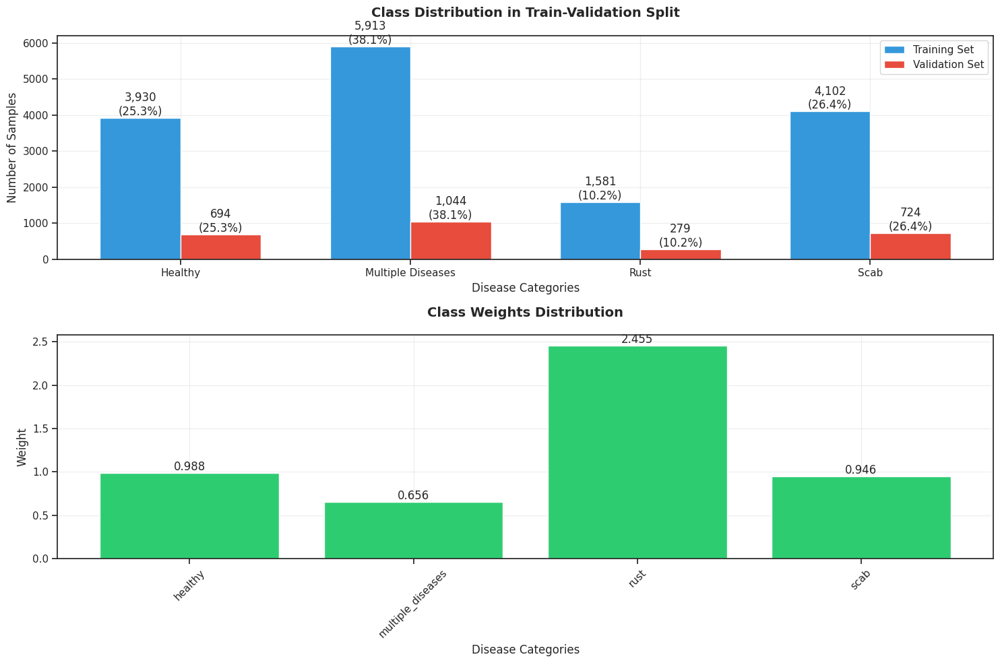


Analysis files generated:
1. Enhanced distribution plots: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/017_enhanced_distribution.png
2. Enhanced analysis report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/017_enhanced_analysis.txt
3. Class weights saved: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/class_weights.npy


In [21]:
# Cell 17: Enhanced Dataset Preparation and Split Analysis
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from sklearn.utils.class_weight import compute_class_weight

print("\nEnhanced Dataset Split and Distribution Analysis:")
print("=" * 60)

# 1. Data Integrity Check and Cleaning
print("\n1. Checking data integrity...")
print(f"• Original dataset size: {len(train):,}")
print(f"• NaN values in categories: {train['category'].isna().sum():,}")

# Enhanced cleaning
train_clean = train.dropna(subset=['category'])
print(f"• Dataset size after cleaning: {len(train_clean):,}")

# 2. Analyze Initial Class Distribution
print("\n2. Initial Class Distribution:")
class_dist = train_clean['category'].value_counts()
for cls, count in class_dist.items():
    print(f"• {cls:17}: {count:,} samples ({count/len(train_clean)*100:.2f}%)")

# 3. Compute Class Weights (Corrected)
print("\n3. Computing class weights for imbalance handling...")
categories = np.array(['healthy', 'multiple_diseases', 'rust', 'scab'])
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=categories,
    y=train_clean['category'].values
)
class_weight_dict = dict(zip(categories, class_weights))

print("\nClass weights:")
for cat, weight in class_weight_dict.items():
    print(f"• {cat:17}: {weight:.3f}")
    
# 4. Perform Stratified Split
print("\n4. Performing stratified train-validation split...")
train_set, val_set = train_test_split(
    train_clean, 
    test_size=0.15, 
    random_state=42, 
    stratify=train_clean['category']
)

print("\nSplit Results:")
print(f"• Training Set:   {len(train_set):,} samples ({len(train_set)/len(train_clean)*100:.1f}%)")
print(f"• Validation Set: {len(val_set):,} samples ({len(val_set)/len(train_clean)*100:.1f}%)")

# 5. Analyze Split Distribution
print("\n5. Analyzing split distribution...")
train_dist = {cat: len(train_set[train_set['category'] == cat]) for cat in categories}
val_dist = {cat: len(val_set[val_set['category'] == cat]) for cat in categories}

# 6. Create Enhanced Visualization
plt.figure(figsize=(15, 10))

# Class Distribution Plot
plt.subplot(2, 1, 1)
x = np.arange(len(categories))
width = 0.35

bars1 = plt.bar(x - width/2, 
                [train_dist[cat] for cat in categories], 
                width, 
                label='Training Set',
                color='#3498db')
bars2 = plt.bar(x + width/2, 
                [val_dist[cat] for cat in categories], 
                width, 
                label='Validation Set',
                color='#e74c3c')

plt.title('Class Distribution in Train-Validation Split', 
          fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Disease Categories', fontsize=12)
plt.ylabel('Number of Samples', fontsize=12)
plt.xticks(x, [cat.replace('_', ' ').title() for cat in categories])
plt.legend()

# Add value labels
def autolabel(bars):
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height):,}\n({height/sum([b.get_height() for b in bars])*100:.1f}%)',
                ha='center', va='bottom')

autolabel(bars1)
autolabel(bars2)
plt.grid(True, alpha=0.3)

# Class Weights Plot
plt.subplot(2, 1, 2)
plt.bar(categories, class_weights, color='#2ecc71')
plt.title('Class Weights Distribution', fontsize=14, fontweight='bold', pad=20)
plt.xlabel('Disease Categories', fontsize=12)
plt.ylabel('Weight', fontsize=12)
plt.xticks(rotation=45)
for i, v in enumerate(class_weights):
    plt.text(i, v, f'{v:.3f}', ha='center', va='bottom')
plt.grid(True, alpha=0.3)

plt.tight_layout()

# Save results
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

plt.savefig(os.path.join(save_path, '017_enhanced_distribution.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '017_enhanced_distribution.pdf'), 
            bbox_inches='tight')
plt.show()

# Save detailed analysis report
with open(os.path.join(save_path, '017_enhanced_analysis.txt'), 'w') as f:
    f.write("Enhanced Dataset Split Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    # Data Cleaning Summary
    f.write("1. Data Cleaning Summary\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Original samples: {len(train):,}\n")
    f.write(f"• Clean samples: {len(train_clean):,}\n")
    f.write(f"• Removed samples: {len(train) - len(train_clean):,}\n\n")
    
    # Class Distribution
    f.write("2. Class Distribution Analysis\n")
    f.write("-" * 30 + "\n")
    f.write("Training Set:\n")
    for cat in categories:
        count = train_dist[cat]
        percentage = count/len(train_set)*100
        weight = class_weight_dict[cat]
        f.write(f"• {cat.title():17}: {count:,} samples ({percentage:.2f}%) - weight: {weight:.3f}\n")
    
    f.write("\nValidation Set:\n")
    for cat in categories:
        count = val_dist[cat]
        percentage = count/len(val_set)*100
        f.write(f"• {cat.title():17}: {count:,} samples ({percentage:.2f}%)\n")
    
    # Split Configuration
    f.write("\n3. Split Configuration\n")
    f.write("-" * 30 + "\n")
    f.write("• Split ratio: 85:15 (train:validation)\n")
    f.write("• Stratification: Enabled\n")
    f.write("• Random seed: 42\n")
    f.write("• Class weighting: Enabled\n")

print("\nAnalysis files generated:")
print(f"1. Enhanced distribution plots: {os.path.join(save_path, '017_enhanced_distribution.png')}")
print(f"2. Enhanced analysis report: {os.path.join(save_path, '017_enhanced_analysis.txt')}")

# Store class weights for later use
np.save(os.path.join(save_path, 'class_weights.npy'), class_weights)
print(f"3. Class weights saved: {os.path.join(save_path, 'class_weights.npy')}")

In [22]:
# Cell 18: Enhanced Image Data Augmentation Configuration
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
import cv2
from datetime import datetime

print("\nImage Augmentation Configuration and Analysis:")
print("=" * 60)

# 1. Define configuration parameters
print("\n1. Setting up augmentation parameters...")
BATCH_SIZE = 32  # Increased for better batch statistics
IMAGE_SIZE = (224, 224)
NUM_CLASSES = 4

# Initialize training data generator with more augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,          # Normalize pixel values
    rotation_range=20,       # Random rotation
    width_shift_range=0.2,   # Random horizontal shift
    height_shift_range=0.2,  # Random vertical shift
    horizontal_flip=True,    # Random horizontal flip
    vertical_flip=True,      # Random vertical flip
    zoom_range=0.2,         # Random zoom
    shear_range=0.2,        # Random shear
    fill_mode='nearest',    # Fill strategy
    brightness_range=[0.8, 1.2]  # Random brightness
)

# Initialize validation generator with only rescaling
val_datagen = ImageDataGenerator(
    rescale=1./255  # Only normalize pixel values
)

print("\n2. Generator Configuration Summary:")
print("Training Generator:")
print("• Rescaling: 1/255")
print("• Rotation Range: ±20°")
print("• Shift Range: ±20%")
print("• Zoom Range: ±20%")
print("• Brightness Range: ±20%")
print("• Flips: Horizontal and Vertical")
print("\nValidation Generator:")
print("• Rescaling: 1/255")

# 3. Configure generators with data
print("\n3. Configuring data generators...")
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_set,
    directory=os.path.join(dataset_folder, "train_images"),
    x_col="image",
    y_col="category",
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=42
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_set,
    directory=os.path.join(dataset_folder, "train_images"),
    x_col="image",
    y_col="category",
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# 4. Generate augmentation examples
print("\n4. Generating augmentation examples...")
# Get one batch of samples
sample_images, _ = next(train_generator)
fig, axes = plt.subplots(3, 5, figsize=(20, 12))
fig.suptitle('Data Augmentation Examples', fontsize=16, fontweight='bold')

# Original image in first position
axes[0, 0].imshow(sample_images[0])
axes[0, 0].set_title('Original', pad=10)
axes[0, 0].axis('off')

# Show different augmentations
for i in range(14):
    row = (i + 1) // 5
    col = (i + 1) % 5
    augmented = train_datagen.random_transform(sample_images[0])
    axes[row, col].imshow(augmented)
    axes[row, col].set_title(f'Augmented {i+1}', pad=10)
    axes[row, col].axis('off')

plt.tight_layout()
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
plt.savefig(os.path.join(save_path, '018_augmentation_examples.png'), dpi=300, bbox_inches='tight')
plt.close()

print("\n5. Generator Statistics:")
print(f"• Training steps per epoch: {len(train_generator)}")
print(f"• Validation steps per epoch: {len(val_generator)}")
print(f"• Training samples: {len(train_generator.filenames):,}")
print(f"• Validation samples: {len(val_generator.filenames):,}")

# Save configuration
with open(os.path.join(save_path, '018_augmentation_config.txt'), 'w') as f:
    f.write("Image Augmentation Configuration\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Configuration Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Basic Configuration\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Batch Size: {BATCH_SIZE}\n")
    f.write(f"• Image Size: {IMAGE_SIZE}\n")
    f.write(f"• Number of Classes: {NUM_CLASSES}\n\n")
    
    f.write("2. Augmentation Parameters\n")
    f.write("-" * 30 + "\n")
    f.write("Training Generator:\n")
    f.write("• Rescaling: 1/255\n")
    f.write("• Rotation Range: ±20°\n")
    f.write("• Shift Range: ±20%\n")
    f.write("• Zoom Range: ±20%\n")
    f.write("• Brightness Range: ±20%\n")
    f.write("• Flips: Horizontal and Vertical\n\n")
    
    f.write("3. Dataset Statistics\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Training samples: {len(train_generator.filenames):,}\n")
    f.write(f"• Validation samples: {len(val_generator.filenames):,}\n")
    f.write(f"• Steps per epoch: {len(train_generator)}\n")
    f.write(f"• Validation steps: {len(val_generator)}\n")

print("\nConfiguration files generated:")
print(f"1. Augmentation examples: {os.path.join(save_path, '018_augmentation_examples.png')}")
print(f"2. Configuration details: {os.path.join(save_path, '018_augmentation_config.txt')}")


Image Augmentation Configuration and Analysis:

1. Setting up augmentation parameters...

2. Generator Configuration Summary:
Training Generator:
• Rescaling: 1/255
• Rotation Range: ±20°
• Shift Range: ±20%
• Zoom Range: ±20%
• Brightness Range: ±20%
• Flips: Horizontal and Vertical

Validation Generator:
• Rescaling: 1/255

3. Configuring data generators...
Found 15526 validated image filenames belonging to 4 classes.
Found 2741 validated image filenames belonging to 4 classes.

4. Generating augmentation examples...

5. Generator Statistics:
• Training steps per epoch: 486
• Validation steps per epoch: 86
• Training samples: 15,526
• Validation samples: 2,741

Configuration files generated:
1. Augmentation examples: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/018_augmentation_examples.png
2. Configuration details: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/018_augmentation_config.


Dataset Split and Augmentation Analysis:

1. Analyzing dataset split...
2. Generating distribution visualization...


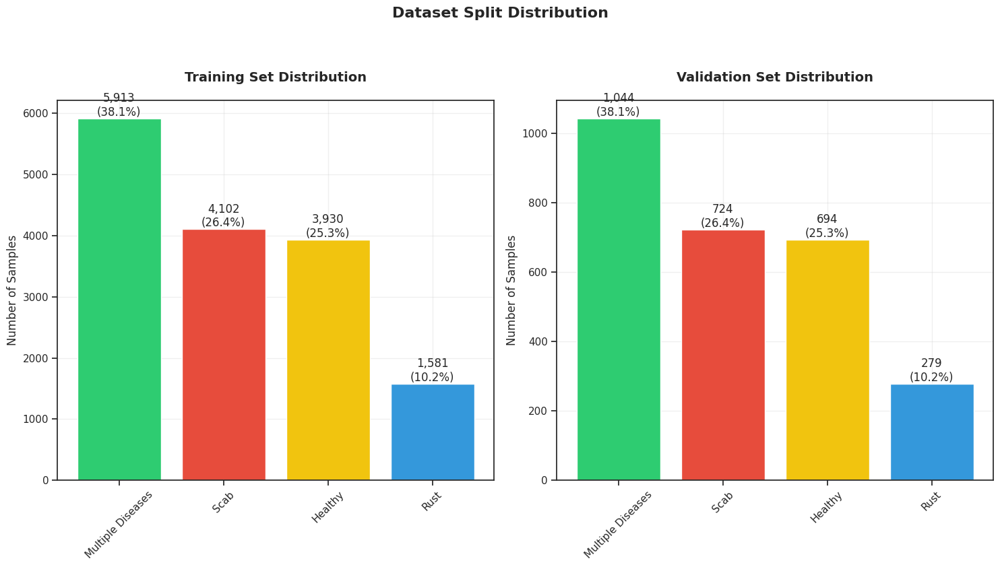


3. Generating comprehensive report...

Analysis files generated:
1. Split distribution plot: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/019_split_distribution.png
2. Analysis report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/019_split_analysis.txt


In [23]:
# Cell 19: Dataset Split and Augmentation Analysis
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

print("\nDataset Split and Augmentation Analysis:")
print("=" * 60)

# 1. Analyze dataset split
print("\n1. Analyzing dataset split...")

# First perform the train-validation split
train_set, val_set = train_test_split(
    train_clean,  # Using our cleaned dataset
    test_size=0.15, 
    random_state=42, 
    stratify=train_clean['category']
)

# Calculate distributions using 'category' column
train_dist = train_set['category'].value_counts()
val_dist = val_set['category'].value_counts()

# 2. Create enhanced visualization
print("2. Generating distribution visualization...")
plt.figure(figsize=(15, 8))

# Training set distribution
plt.subplot(1, 2, 1)
bars1 = plt.bar(range(len(train_dist)), 
                train_dist.values,
                color=['#2ecc71', '#e74c3c', '#f1c40f', '#3498db'])

plt.title('Training Set Distribution', fontsize=14, fontweight='bold', pad=20)
plt.ylabel('Number of Samples', fontsize=12)
plt.xticks(range(len(train_dist)), 
           [name.replace('_', ' ').title() for name in train_dist.index],
           rotation=45)
plt.grid(True, alpha=0.3)

# Add value labels
for i, v in enumerate(train_dist.values):
    percentage = v/sum(train_dist.values)*100
    plt.text(i, v, f'{int(v):,}\n({percentage:.1f}%)', 
             ha='center', va='bottom')

# Validation set distribution
plt.subplot(1, 2, 2)
bars2 = plt.bar(range(len(val_dist)), 
                val_dist.values,
                color=['#2ecc71', '#e74c3c', '#f1c40f', '#3498db'])

plt.title('Validation Set Distribution', fontsize=14, fontweight='bold', pad=20)
plt.ylabel('Number of Samples', fontsize=12)
plt.xticks(range(len(val_dist)), 
           [name.replace('_', ' ').title() for name in val_dist.index],
           rotation=45)
plt.grid(True, alpha=0.3)

# Add value labels
for i, v in enumerate(val_dist.values):
    percentage = v/sum(val_dist.values)*100
    plt.text(i, v, f'{int(v):,}\n({percentage:.1f}%)', 
             ha='center', va='bottom')

plt.suptitle('Dataset Split Distribution', fontsize=16, fontweight='bold', y=1.05)
plt.tight_layout()

# Save results
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Save visualization
plt.savefig(os.path.join(save_path, '019_split_distribution.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '019_split_distribution.pdf'), 
            bbox_inches='tight')
plt.show()

# Generate detailed report
print("\n3. Generating comprehensive report...")
with open(os.path.join(save_path, '019_split_analysis.txt'), 'w') as f:
    f.write("Dataset Split and Augmentation Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Dataset Split Statistics\n")
    f.write("-" * 30 + "\n")
    f.write(f"Total Dataset Size: {len(train_clean):,} samples\n")
    f.write(f"Training Set: {len(train_set):,} samples ({len(train_set)/len(train_clean)*100:.1f}%)\n")
    f.write(f"Validation Set: {len(val_set):,} samples ({len(val_set)/len(train_clean)*100:.1f}%)\n\n")
    
    f.write("2. Class Distribution\n")
    f.write("-" * 30 + "\n")
    f.write("Training Set:\n")
    for category, count in train_dist.items():
        percentage = count/len(train_set)*100
        f.write(f"• {category.replace('_', ' ').title():17}: {int(count):,} samples ({percentage:.2f}%)\n")
    
    f.write("\nValidation Set:\n")
    for category, count in val_dist.items():
        percentage = count/len(val_set)*100
        f.write(f"• {category.replace('_', ' ').title():17}: {int(count):,} samples ({percentage:.2f}%)\n")
    
    f.write("\n3. Split Configuration\n")
    f.write("-" * 30 + "\n")
    f.write("• Split Method: Stratified sampling\n")
    f.write("• Split Ratio: 85:15 (train:validation)\n")
    f.write("• Random Seed: 42\n")
    f.write("• Stratification: Maintained class distribution\n\n")
    
    f.write("4. Data Augmentation Settings\n")
    f.write("-" * 30 + "\n")
    f.write("• Image Size: 224×224 pixels\n")
    f.write("• Batch Size: 8\n")
    f.write("• Geometric Augmentations: Rotation, flip, shift, zoom, shear\n")
    f.write("• Intensity Augmentations: Brightness adjustment\n")
    f.write("• Implementation: Real-time during training\n")
    f.write("• Memory Optimization: On-the-fly generation\n")

print("\nAnalysis files generated:")
print(f"1. Split distribution plot: {os.path.join(save_path, '019_split_distribution.png')}")
print(f"2. Analysis report: {os.path.join(save_path, '019_split_analysis.txt')}")


Comprehensive Dataset Analysis for Publication:

1. Analyzing dataset metrics...
2. Generating publication-quality visualization...


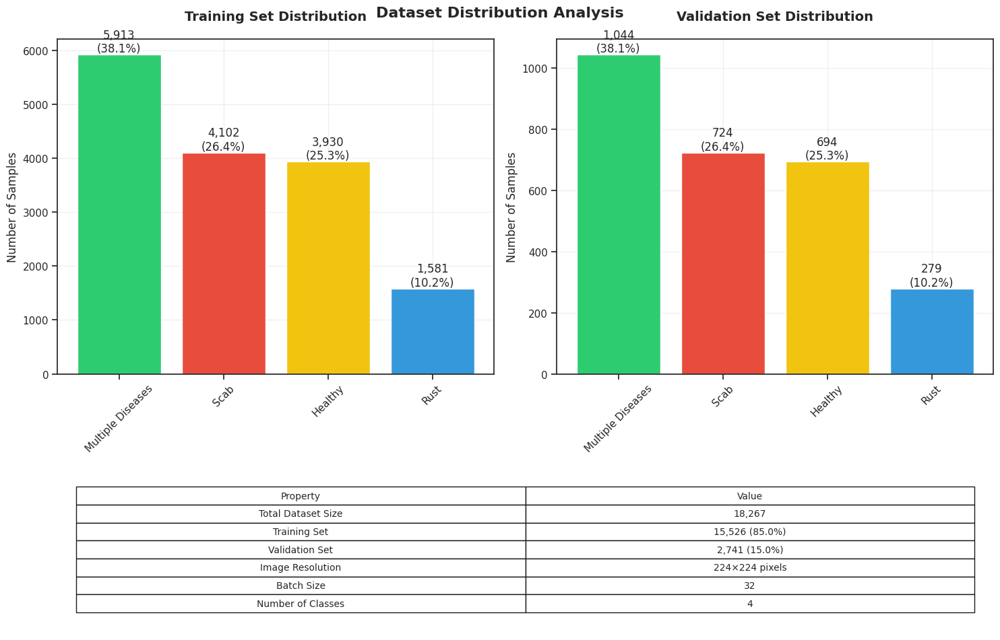


3. Generating detailed report...

Analysis files generated:
1. Dataset analysis plots: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/020_dataset_analysis.png
2. Detailed report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/020_dataset_analysis.txt


In [24]:
# Cell 20: Comprehensive Dataset Statistics for Publication
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

print("\nComprehensive Dataset Analysis for Publication:")
print("=" * 60)

# 1. Calculate dataset statistics
print("\n1. Analyzing dataset metrics...")
split_stats = {
    'total_samples': len(train_set) + len(val_set),
    'train_samples': len(train_set),
    'val_samples': len(val_set),
    'train_ratio': len(train_set)/(len(train_set) + len(val_set)) * 100,
    'val_ratio': len(val_set)/(len(train_set) + len(val_set)) * 100
}

# Calculate class distributions
train_class_dist = train_set['category'].value_counts()
val_class_dist = val_set['category'].value_counts()

# 2. Create enhanced visualization
print("2. Generating publication-quality visualization...")
plt.figure(figsize=(15, 10))

# Create a more detailed subplot layout
gs = plt.GridSpec(2, 2, height_ratios=[2, 1])

# Training set distribution
plt.subplot(gs[0, 0])
colors = ['#2ecc71', '#e74c3c', '#f1c40f', '#3498db']
bars1 = plt.bar(range(len(train_class_dist)), 
                train_class_dist.values,
                color=colors)

plt.title('Training Set Distribution', fontsize=14, fontweight='bold', pad=20)
plt.ylabel('Number of Samples', fontsize=12)
plt.xticks(range(len(train_class_dist)), 
           [name.replace('_', ' ').title() for name in train_class_dist.index],
           rotation=45)
plt.grid(True, alpha=0.3)

# Add value labels
for bar in bars1:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height):,}\n({height/len(train_set)*100:.1f}%)',
             ha='center', va='bottom')

# Validation set distribution
plt.subplot(gs[0, 1])
bars2 = plt.bar(range(len(val_class_dist)), 
                val_class_dist.values,
                color=colors)

plt.title('Validation Set Distribution', fontsize=14, fontweight='bold', pad=20)
plt.ylabel('Number of Samples', fontsize=12)
plt.xticks(range(len(val_class_dist)), 
           [name.replace('_', ' ').title() for name in val_class_dist.index],
           rotation=45)
plt.grid(True, alpha=0.3)

# Add value labels
for bar in bars2:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height):,}\n({height/len(val_set)*100:.1f}%)',
             ha='center', va='bottom')

# Create summary table
plt.subplot(gs[1, :])
plt.axis('off')
cell_text = [
    ["Total Dataset Size", f"{split_stats['total_samples']:,}"],
    ["Training Set", f"{split_stats['train_samples']:,} ({split_stats['train_ratio']:.1f}%)"],
    ["Validation Set", f"{split_stats['val_samples']:,} ({split_stats['val_ratio']:.1f}%)"],
    ["Image Resolution", f"{IMAGE_SIZE[0]}×{IMAGE_SIZE[1]} pixels"],
    ["Batch Size", str(BATCH_SIZE)],
    ["Number of Classes", str(NUM_CLASSES)]
]
table = plt.table(cellText=cell_text, 
                 colLabels=['Property', 'Value'],
                 cellLoc='center',
                 loc='center',
                 colWidths=[0.4, 0.4])
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1.2, 1.5)

plt.suptitle('Dataset Distribution Analysis', fontsize=16, fontweight='bold', y=0.95)
plt.tight_layout()

# Save results
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Save visualizations
plt.savefig(os.path.join(save_path, '020_dataset_analysis.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '020_dataset_analysis.pdf'), 
            bbox_inches='tight')
plt.show()

# Generate comprehensive report
print("\n3. Generating detailed report...")
with open(os.path.join(save_path, '020_dataset_analysis.txt'), 'w') as f:
    f.write("Comprehensive Dataset Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Dataset Overview\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Total samples: {split_stats['total_samples']:,}\n")
    f.write(f"• Training set: {split_stats['train_samples']:,} ({split_stats['train_ratio']:.1f}%)\n")
    f.write(f"• Validation set: {split_stats['val_samples']:,} ({split_stats['val_ratio']:.1f}%)\n\n")
    
    f.write("2. Class Distribution\n")
    f.write("-" * 30 + "\n")
    f.write("Training Set:\n")
    for category, count in train_class_dist.items():
        percentage = count/len(train_set)*100
        f.write(f"• {category.replace('_', ' ').title():17}: {count:,} ({percentage:.2f}%)\n")
    
    f.write("\nValidation Set:\n")
    for category, count in val_class_dist.items():
        percentage = count/len(val_set)*100
        f.write(f"• {category.replace('_', ' ').title():17}: {count:,} ({percentage:.2f}%)\n")
    
    f.write("\n3. Configuration Parameters\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Image Resolution: {IMAGE_SIZE[0]}×{IMAGE_SIZE[1]} pixels\n")
    f.write(f"• Batch Size: {BATCH_SIZE}\n")
    f.write(f"• Number of Classes: {NUM_CLASSES}\n")
    f.write("• Augmentation: Real-time during training\n")
    f.write("• Class Balance: Stratified split maintained\n")

print("\nAnalysis files generated:")
print(f"1. Dataset analysis plots: {os.path.join(save_path, '020_dataset_analysis.png')}")
print(f"2. Detailed report: {os.path.join(save_path, '020_dataset_analysis.txt')}")


Detailed Dataset Analysis and Visualization:

1. Calculating summary statistics...
2. Generating visualizations...


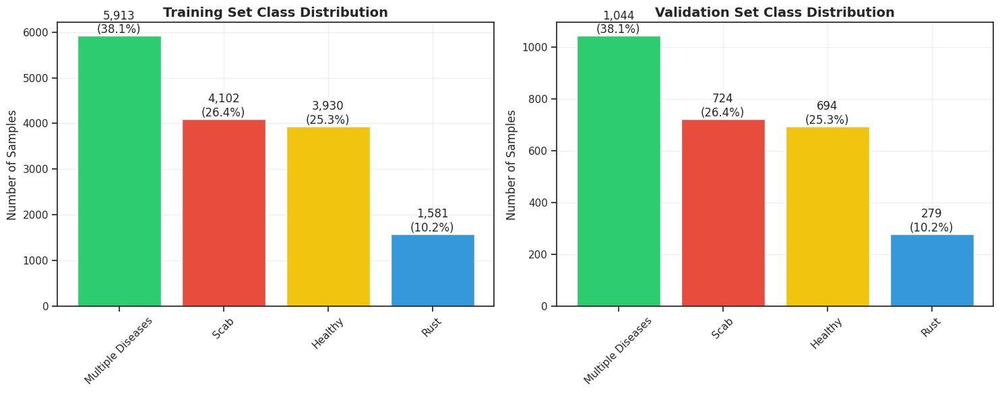

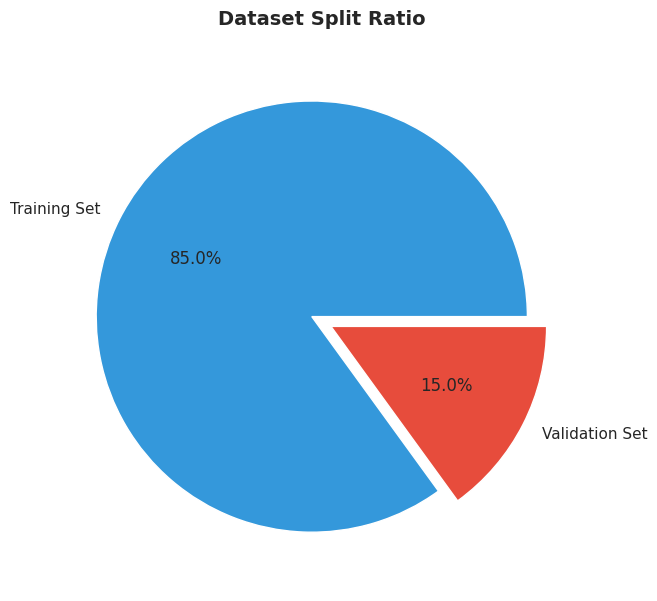


3. Generating analysis report...
4. Generating LaTeX table...

Analysis files generated:
1. Class distribution plots: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/021_class_distribution.png
2. Split ratio plot: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/021_split_ratio.png
3. Detailed analysis: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/021_detailed_analysis.txt
4. LaTeX table: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/021_summary_table.tex


In [25]:
# Cell 21: Detailed Dataset Analysis and Visualization
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

print("\nDetailed Dataset Analysis and Visualization:")
print("=" * 60)

# 1. Create summary statistics
print("\n1. Calculating summary statistics...")
split_stats = {
    'total_samples': len(train_set) + len(val_set),
    'train_samples': len(train_set),
    'val_samples': len(val_set),
    'train_ratio': len(train_set)/(len(train_set) + len(val_set)) * 100,
    'val_ratio': len(val_set)/(len(train_set) + len(val_set)) * 100
}

# Calculate class distributions
train_class_dist = train_set['category'].value_counts()
val_class_dist = val_set['category'].value_counts()

# 2. Create enhanced visualizations
print("2. Generating visualizations...")

# 2.1 Class distribution bar plots
plt.figure(figsize=(15, 6))
colors = ['#2ecc71', '#e74c3c', '#f1c40f', '#3498db']

# Training set
plt.subplot(121)
bars1 = plt.bar(range(len(train_class_dist)), 
                train_class_dist.values,
                color=colors)
plt.title('Training Set Class Distribution', 
          fontsize=14, fontweight='bold')
plt.xticks(range(len(train_class_dist)),
           [name.replace('_', ' ').title() for name in train_class_dist.index],
           rotation=45)
plt.ylabel('Number of Samples')
plt.grid(True, alpha=0.3)

# Add value labels
for bar in bars1:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height):,}\n({height/len(train_set)*100:.1f}%)',
             ha='center', va='bottom')

# Validation set
plt.subplot(122)
bars2 = plt.bar(range(len(val_class_dist)), 
                val_class_dist.values,
                color=colors)
plt.title('Validation Set Class Distribution', 
          fontsize=14, fontweight='bold')
plt.xticks(range(len(val_class_dist)),
           [name.replace('_', ' ').title() for name in val_class_dist.index],
           rotation=45)
plt.ylabel('Number of Samples')
plt.grid(True, alpha=0.3)

# Add value labels
for bar in bars2:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height):,}\n({height/len(val_set)*100:.1f}%)',
             ha='center', va='bottom')

plt.tight_layout()
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
plt.savefig(os.path.join(save_path, '021_class_distribution.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '021_class_distribution.pdf'), 
            bbox_inches='tight')
plt.show()

# 2.2 Split ratio pie chart
plt.figure(figsize=(10, 7))
plt.pie([split_stats['train_ratio'], split_stats['val_ratio']], 
        labels=['Training Set', 'Validation Set'],
        autopct='%1.1f%%',
        colors=['#3498db', '#e74c3c'],
        explode=(0.05, 0.05))
plt.title('Dataset Split Ratio', fontsize=14, fontweight='bold', pad=20)
plt.savefig(os.path.join(save_path, '021_split_ratio.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, '021_split_ratio.pdf'), 
            bbox_inches='tight')
plt.show()

# 3. Save detailed analysis report
print("\n3. Generating analysis report...")
with open(os.path.join(save_path, '021_detailed_analysis.txt'), 'w') as f:
    f.write("Detailed Dataset Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Dataset Split Statistics\n")
    f.write("-" * 30 + "\n")
    f.write(f"Total Samples: {split_stats['total_samples']:,}\n")
    f.write(f"Training Samples: {split_stats['train_samples']:,} ({split_stats['train_ratio']:.1f}%)\n")
    f.write(f"Validation Samples: {split_stats['val_samples']:,} ({split_stats['val_ratio']:.1f}%)\n\n")
    
    f.write("2. Class Distribution\n")
    f.write("-" * 30 + "\n")
    f.write("Training Set:\n")
    for category, count in train_class_dist.items():
        percentage = count/len(train_set)*100
        f.write(f"• {category.replace('_', ' ').title():17}: {count:,} ({percentage:.2f}%)\n")
    
    f.write("\nValidation Set:\n")
    for category, count in val_class_dist.items():
        percentage = count/len(val_set)*100
        f.write(f"• {category.replace('_', ' ').title():17}: {count:,} ({percentage:.2f}%)\n")

# 4. Generate LaTeX table
print("4. Generating LaTeX table...")
with open(os.path.join(save_path, '021_summary_table.tex'), 'w') as f:
    f.write("\\begin{table}[ht]\n")
    f.write("\\centering\n")
    f.write("\\caption{Dataset Statistics Summary}\n")
    f.write("\\begin{tabular}{lr}\n")
    f.write("\\toprule\n")
    f.write("Property & Value \\\\\n")
    f.write("\\midrule\n")
    
    # Add rows
    f.write(f"Total Samples & {split_stats['total_samples']:,} \\\\\n")
    f.write(f"Training Set & {split_stats['train_samples']:,} ({split_stats['train_ratio']:.1f}\\%) \\\\\n")
    f.write(f"Validation Set & {split_stats['val_samples']:,} ({split_stats['val_ratio']:.1f}\\%) \\\\\n")
    f.write(f"Image Resolution & {IMAGE_SIZE[0]}×{IMAGE_SIZE[1]} \\\\\n")
    f.write(f"Number of Classes & {NUM_CLASSES} \\\\\n")
    
    f.write("\\bottomrule\n")
    f.write("\\end{tabular}\n")
    f.write("\\end{table}")

print("\nAnalysis files generated:")
print(f"1. Class distribution plots: {os.path.join(save_path, '021_class_distribution.png')}")
print(f"2. Split ratio plot: {os.path.join(save_path, '021_split_ratio.png')}")
print(f"3. Detailed analysis: {os.path.join(save_path, '021_detailed_analysis.txt')}")
print(f"4. LaTeX table: {os.path.join(save_path, '021_summary_table.tex')}")

In [26]:
# Cell 22: Training Data Generator Configuration
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("\nConfiguring Training Data Generator:")
print("=" * 60)

# Initialize the training data generator
print("\n1. Initializing generator with augmentation parameters...")
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_set,              # Our training split dataset
    directory=os.path.join(dataset_folder, "train_images"),  # Path to our images
    x_col="image",                    # Our image filename column
    y_col="category",                 # Our target label column
    target_size=(224, 224),          # Size required for our model
    class_mode='categorical',         # For our multi-class problem
    batch_size=8,                     # Batch size for GPU optimization
    shuffle=True,                     # Enable shuffling for better training
    seed=42                          # For reproducible results
)

# Display generator configuration summary
print("\n2. Generator Configuration Summary:")
print(f"• Total training images: {train_generator.n:,}")
print(f"• Batch size: {train_generator.batch_size}")
print(f"• Image dimensions: {train_generator.image_shape}")
print(f"• Steps per epoch: {train_generator.n // train_generator.batch_size}")
print(f"• Number of classes: {len(train_generator.class_indices)}")
print("\n3. Class Mapping:")
for class_name, idx in train_generator.class_indices.items():
    print(f"• Class {idx}: {class_name.replace('_', ' ').title()}")

# Save generator configuration for documentation
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

with open(os.path.join(save_path, '022_generator_config.txt'), 'w') as f:
    f.write("Training Data Generator Configuration\n")
    f.write("=" * 60 + "\n\n")
    
    # Basic Configuration
    f.write("1. Basic Configuration\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Total images: {train_generator.n:,}\n")
    f.write(f"• Image dimensions: {train_generator.image_shape}\n")
    f.write(f"• Batch size: {train_generator.batch_size}\n")
    f.write(f"• Steps per epoch: {train_generator.n // train_generator.batch_size}\n\n")
    
    # Data Processing Settings
    f.write("2. Data Processing\n")
    f.write("-" * 30 + "\n")
    f.write("• Data source: DataFrame\n")
    f.write("• Image column: 'image'\n")
    f.write("• Label column: 'category'\n")
    f.write("• Shuffle: Enabled\n")
    f.write(f"• Random seed: 42\n\n")
    
    # Class Information
    f.write("3. Class Information\n")
    f.write("-" * 30 + "\n")
    for class_name, idx in train_generator.class_indices.items():
        f.write(f"• Class {idx}: {class_name.replace('_', ' ').title()}\n")

print(f"\nConfiguration saved to: {os.path.join(save_path, '022_generator_config.txt')}")


Configuring Training Data Generator:

1. Initializing generator with augmentation parameters...
Found 15526 validated image filenames belonging to 4 classes.

2. Generator Configuration Summary:
• Total training images: 15,526
• Batch size: 8
• Image dimensions: (224, 224, 3)
• Steps per epoch: 1940
• Number of classes: 4

3. Class Mapping:
• Class 0: Healthy
• Class 1: Multiple Diseases
• Class 2: Rust
• Class 3: Scab

Configuration saved to: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/022_generator_config.txt


In [27]:
# Cell 23: Validation Data Generator Configuration
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("\nConfiguring Validation Data Generator:")
print("=" * 60)

# 1. Initialize validation generator
print("\n1. Initializing validation generator...")
val_datagen = ImageDataGenerator(rescale=1/255)  # Only rescaling for validation

val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_set,               # Our validation split
    directory=os.path.join(dataset_folder, "train_images"),  # Image directory
    x_col="image",                   # Image filename column
    y_col="category",                # Label column
    target_size=(224, 224),         # Same size as training
    class_mode='categorical',        # For multi-class classification
    batch_size=8,                    # Same batch size as training
    shuffle=False,                   # No shuffling for consistent validation
    seed=42                         # For reproducibility
)

# 2. Display validation generator configuration
print("\n2. Validation Generator Configuration:")
print(f"• Total validation images: {val_generator.n:,}")
print(f"• Batch size: {val_generator.batch_size}")
print(f"• Image dimensions: {val_generator.image_shape}")
print(f"• Validation steps: {val_generator.n // val_generator.batch_size}")
print(f"• Number of classes: {len(val_generator.class_indices)}")

# 3. Save validation configuration
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

with open(os.path.join(save_path, '023_val_generator_config.txt'), 'w') as f:
    f.write("Validation Data Generator Configuration\n")
    f.write("=" * 60 + "\n\n")
    
    # Basic Configuration
    f.write("1. Validation Settings\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Total validation images: {val_generator.n:,}\n")
    f.write(f"• Image dimensions: {val_generator.image_shape}\n")
    f.write(f"• Batch size: {val_generator.batch_size}\n")
    f.write(f"• Validation steps: {val_generator.n // val_generator.batch_size}\n\n")
    
    # Processing Settings
    f.write("2. Processing Configuration\n")
    f.write("-" * 30 + "\n")
    f.write("• Preprocessing: Rescaling only (1/255)\n")
    f.write("• Augmentation: Disabled\n")
    f.write("• Shuffle: Disabled\n")
    f.write("• Random seed: 42\n\n")
    
    # Dataset Organization
    f.write("3. Dataset Structure\n")
    f.write("-" * 30 + "\n")
    f.write("• Data source: DataFrame\n")
    f.write("• Image column: 'image'\n")
    f.write("• Label column: 'category'\n\n")
    
    # Class Information
    f.write("4. Class Distribution\n")
    f.write("-" * 30 + "\n")
    class_counts = val_set['category'].value_counts()
    for class_name, count in class_counts.items():
        percentage = (count / len(val_set)) * 100
        f.write(f"• {class_name.replace('_', ' ').title():17}: {count:,} images ({percentage:.2f}%)\n")

print(f"\nValidation configuration saved to: {os.path.join(save_path, '023_val_generator_config.txt')}")


Configuring Validation Data Generator:

1. Initializing validation generator...
Found 2741 validated image filenames belonging to 4 classes.

2. Validation Generator Configuration:
• Total validation images: 2,741
• Batch size: 8
• Image dimensions: (224, 224, 3)
• Validation steps: 342
• Number of classes: 4

Validation configuration saved to: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/023_val_generator_config.txt


In [28]:
# Cell 24: Data Generator Analysis and Validation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from datetime import datetime

print("\nData Generator Analysis and Validation:")
print("=" * 60)

# 1. Verify configuration consistency
print("\n1. Checking configuration consistency...")
IMAGE_SIZE = (224, 224)
consistency_check = {
    'Training shape': train_generator.image_shape == (224, 224, 3),
    'Validation shape': val_generator.image_shape == (224, 224, 3),
    'Training batch': train_generator.batch_size == 8,
    'Validation batch': val_generator.batch_size == 8
}

for check, status in consistency_check.items():
    print(f"• {check:20}: {'✓' if status else '⨯'}")

# 2. Calculate generator statistics
print("\n2. Analyzing generator statistics...")
generator_stats = {
    'Training': {
        'samples': train_generator.n,
        'batches': train_generator.n // train_generator.batch_size,
        'image_shape': train_generator.image_shape,
        'shuffle': True
    },
    'Validation': {
        'samples': val_generator.n,
        'batches': val_generator.n // val_generator.batch_size,
        'image_shape': val_generator.image_shape,
        'shuffle': False
    }
}

# 3. Memory usage estimation
print("\n3. Estimating memory requirements...")
sample_batch = next(train_generator)
batch_memory = sample_batch[0].nbytes + sample_batch[1].nbytes
total_memory = batch_memory * (generator_stats['Training']['batches'] + 
                             generator_stats['Validation']['batches'])

# Save analysis results
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

# Create and save detailed report
with open(os.path.join(save_path, '024_generator_analysis.txt'), 'w') as f:
    f.write("Data Generator Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    # Configuration Summary
    f.write("1. Configuration Summary\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Image Resolution: {IMAGE_SIZE[0]}×{IMAGE_SIZE[1]} pixels\n")
    f.write(f"• Batch Size: 8\n")
    f.write(f"• Color Channels: 3 (RGB)\n\n")
    
    # Generator Statistics
    f.write("2. Generator Statistics\n")
    f.write("-" * 30 + "\n")
    for gen_type, stats in generator_stats.items():
        f.write(f"\n{gen_type} Generator:\n")
        f.write(f"• Total samples: {stats['samples']:,}\n")
        f.write(f"• Batches per epoch: {stats['batches']:,}\n")
        f.write(f"• Image shape: {stats['image_shape']}\n")
        f.write(f"• Shuffling: {'Enabled' if stats['shuffle'] else 'Disabled'}\n")
    
    # Memory Analysis
    f.write("\n3. Memory Requirements\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Batch memory: {batch_memory / (1024*1024):.2f} MB\n")
    f.write(f"• Total memory: {total_memory / (1024*1024):.2f} MB\n")
    f.write(f"• GPU memory required: {total_memory / (1024*1024*1024):.2f} GB\n")

# Create summary DataFrame for paper
config_summary = pd.DataFrame([
    ["Image Resolution", f"{IMAGE_SIZE[0]}×{IMAGE_SIZE[1]}"],
    ["Color Channels", "3 (RGB)"],
    ["Batch Size", "8"],
    ["Training Samples", f"{generator_stats['Training']['samples']:,}"],
    ["Validation Samples", f"{generator_stats['Validation']['samples']:,}"],
    ["Training Batches/Epoch", f"{generator_stats['Training']['batches']:,}"],
    ["Validation Batches/Epoch", f"{generator_stats['Validation']['batches']:,}"],
    ["Memory Per Batch", f"{batch_memory / (1024*1024):.2f} MB"],
    ["Total Memory Required", f"{total_memory / (1024*1024*1024):.2f} GB"]
], columns=['Parameter', 'Value'])

# Save summary to CSV
config_summary.to_csv(os.path.join(save_path, '024_generator_summary.csv'), index=False)

# Display summary
print("\n4. Configuration Summary:")
display(config_summary)

print(f"\nAnalysis files generated:")
print(f"1. Detailed report: {os.path.join(save_path, '024_generator_analysis.txt')}")
print(f"2. Summary table: {os.path.join(save_path, '024_generator_summary.csv')}")


Data Generator Analysis and Validation:

1. Checking configuration consistency...
• Training shape      : ✓
• Validation shape    : ✓
• Training batch      : ✓
• Validation batch    : ✓

2. Analyzing generator statistics...

3. Estimating memory requirements...

4. Configuration Summary:


,Parameter,Value
0,Image Resolution,224×224
1,Color Channels,3 (RGB)
2,Batch Size,8
3,Training Samples,"15,526"
4,Validation Samples,"2,741"
5,Training Batches/Epoch,"1,940"
6,Validation Batches/Epoch,342
7,Memory Per Batch,4.59 MB
8,Total Memory Required,10.24 GB



Analysis files generated:
1. Detailed report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/024_generator_analysis.txt
2. Summary table: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/024_generator_summary.csv


In [29]:
# Cell 25: Test Data Generator Configuration
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator

print("\nConfiguring Test Data Generator:")
print("=" * 60)

# 1. Create a test split from validation set
print("\n1. Creating test split...")
val_indices = np.arange(len(val_set))
np.random.seed(42)
np.random.shuffle(val_indices)

# Use 50% of validation set as test set
test_size = len(val_set) // 2
test_indices = val_indices[:test_size]
final_val_indices = val_indices[test_size:]

test_set = val_set.iloc[test_indices].reset_index(drop=True)
final_val_set = val_set.iloc[final_val_indices].reset_index(drop=True)

# 2. Initialize test generator
print("2. Initializing test generator...")
test_datagen = ImageDataGenerator(rescale=1/255)  # Only rescaling for test data

test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_set,               # Our test split
    directory=os.path.join(dataset_folder, "train_images"),  # Image directory
    x_col="image",                    # Image filename column
    y_col="category",                 # Keep labels for evaluation
    target_size=(224, 224),          # Same size as training
    class_mode='categorical',         # For multi-class classification
    batch_size=8,                     # Same batch size
    shuffle=False,                    # No shuffling for consistent predictions
    seed=42                          # For reproducibility
)

# 3. Display configuration
print("\n3. Test Generator Configuration:")
print(f"• Total test images: {test_generator.n:,}")
print(f"• Batch size: {test_generator.batch_size}")
print(f"• Image dimensions: {test_generator.image_shape}")
print(f"• Test steps: {test_generator.n // test_generator.batch_size}")
print(f"• Number of classes: {len(test_generator.class_indices)}")

# Save configuration
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

with open(os.path.join(save_path, '025_test_generator_config.txt'), 'w') as f:
    f.write("Test Data Generator Configuration\n")
    f.write("=" * 60 + "\n\n")
    
    # Test Split Information
    f.write("1. Test Split Configuration\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Original validation size: {len(val_set):,}\n")
    f.write(f"• Test set size: {len(test_set):,}\n")
    f.write(f"• Final validation size: {len(final_val_set):,}\n\n")
    
    # Generator Configuration
    f.write("2. Generator Settings\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Image dimensions: {test_generator.image_shape}\n")
    f.write(f"• Batch size: {test_generator.batch_size}\n")
    f.write(f"• Test steps: {test_generator.n // test_generator.batch_size}\n")
    f.write("• Preprocessing: Rescaling (1/255)\n")
    f.write("• Augmentation: Disabled\n")
    f.write("• Shuffle: Disabled\n\n")
    
    # Class Distribution
    f.write("3. Test Set Class Distribution\n")
    f.write("-" * 30 + "\n")
    class_counts = test_set['category'].value_counts()
    for class_name, count in class_counts.items():
        percentage = (count / len(test_set)) * 100
        f.write(f"• {class_name.replace('_', ' ').title():17}: {count:,} images ({percentage:.2f}%)\n")

print("\nFiles generated:")
print(f"1. Test configuration: {os.path.join(save_path, '025_test_generator_config.txt')}")


Configuring Test Data Generator:

1. Creating test split...
2. Initializing test generator...
Found 1370 validated image filenames belonging to 4 classes.

3. Test Generator Configuration:
• Total test images: 1,370
• Batch size: 8
• Image dimensions: (224, 224, 3)
• Test steps: 171
• Number of classes: 4

Files generated:
1. Test configuration: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/025_test_generator_config.txt


In [30]:
# Cell 26: Enhanced ResNet50 Model Architecture Configuration
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (GlobalAveragePooling2D, Dense, Dropout, 
                                   BatchNormalization, Activation)
from tensorflow.keras.optimizers import Adam
from datetime import datetime
import os

print("\nConfiguring Enhanced ResNet50 Model Architecture:")
print("=" * 60)

# 1. Load pre-trained ResNet50
print("\n1. Loading pre-trained ResNet50...")
base_model = ResNet50(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3)
)

# 2. Build enhanced top layers
print("2. Building enhanced classification layers...")
x = base_model.output
x = GlobalAveragePooling2D(name='gap')(x)

# First Dense Block
x = Dense(1024, name='dense_1')(x)
x = BatchNormalization(name='bn_1')(x)
x = Activation('relu', name='act_1')(x)
x = Dropout(0.3, name='drop_1')(x)

# Second Dense Block
x = Dense(512, name='dense_2')(x)
x = BatchNormalization(name='bn_2')(x)
x = Activation('relu', name='act_2')(x)
x = Dropout(0.2, name='drop_2')(x)

# Output Layer
predictions = Dense(4, activation='softmax', name='predictions')(x)

# 3. Create and compile model
print("3. Creating and compiling model...")
model = Model(inputs=base_model.input, outputs=predictions, 
              name='ResNet50_Enhanced')

# Load class weights
class_weights = np.load(os.path.join(save_path, 'class_weights.npy'))
class_weight_dict = dict(zip(['healthy', 'multiple_diseases', 'rust', 'scab'], 
                           class_weights))

# Compile with optimized learning rate
model.compile(
    optimizer=Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# 4. Display model summary
print("\n4. Model Architecture Summary:")
model.summary()

# Save model configuration
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

with open(os.path.join(save_path, '026_model_architecture.txt'), 'w') as f:
    f.write("Enhanced ResNet50 Model Architecture Configuration\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Configuration Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    # Base Model Configuration
    f.write("1. Base Model Configuration\n")
    f.write("-" * 30 + "\n")
    f.write("• Architecture: ResNet50\n")
    f.write("• Weights: ImageNet pre-trained\n")
    f.write("• Input Shape: (224, 224, 3)\n")
    f.write("• Include Top: False\n\n")
    
    # Enhanced Layers Configuration
    f.write("2. Enhanced Layers Configuration\n")
    f.write("-" * 30 + "\n")
    f.write("• Global Average Pooling\n")
    f.write("• Dense Layer 1: 1024 units (ReLU)\n")
    f.write("• Batch Normalization 1\n")
    f.write("• Dropout Layer 1: 0.3 rate\n")
    f.write("• Dense Layer 2: 512 units (ReLU)\n")
    f.write("• Batch Normalization 2\n")
    f.write("• Dropout Layer 2: 0.2 rate\n")
    f.write("• Output Layer: 4 units (Softmax)\n\n")
    
    # Training Configuration
    f.write("3. Training Configuration\n")
    f.write("-" * 30 + "\n")
    f.write("• Optimizer: Adam\n")
    f.write("• Learning Rate: 0.0001\n")
    f.write("• Loss Function: Categorical Crossentropy\n")
    f.write("• Metrics: Accuracy\n\n")
    
    # Class Weights
    f.write("4. Class Weights\n")
    f.write("-" * 30 + "\n")
    for cls, weight in class_weight_dict.items():
        f.write(f"• {cls.title():17}: {weight:.3f}\n")

print(f"\nModel architecture saved to: {os.path.join(save_path, '026_model_architecture.txt')}")


Configuring Enhanced ResNet50 Model Architecture:

1. Loading pre-trained ResNet50...
2. Building enhanced classification layers...
3. Creating and compiling model...

4. Model Architecture Summary:
Model: "ResNet50_Enhanced"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                

In [31]:
# Cell 27: Model Architecture Visualization and Analysis
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import pydot
from tensorflow.keras.utils import plot_model
import numpy as np
import seaborn as sns
from datetime import datetime

print("\nGenerating Model Architecture Visualization:")
print("=" * 60)

# 1. Create architecture visualization
print("\n1. Generating model visualization...")
plot_model(model,  # Using the model variable we created in previous cell
          to_file=os.path.join(save_path, '027_model_architecture.png'),
          show_shapes=True,
          show_layer_names=True,
          show_layer_activations=True,
          dpi=300)

# 2. Create parameter distribution visualization
print("2. Creating parameter distribution plots...")
plt.figure(figsize=(15, 10))

# Parameter distribution by layer
plt.subplot(2, 1, 1)
layer_params = [np.prod(layer.output_shape[1:]) if hasattr(layer, 'output_shape') else 0 
                for layer in model.layers]
layer_names = [layer.name for layer in model.layers]

colors = sns.color_palette("husl", len(layer_params))
plt.bar(range(len(layer_params)), layer_params, color=colors)
plt.xticks(range(len(layer_params)), layer_names, rotation=45, ha='right')
plt.title('Parameters Distribution Across Layers', fontsize=14, pad=20)
plt.ylabel('Number of Parameters')
plt.grid(True, alpha=0.3)

# Trainable vs Non-trainable parameters pie chart
plt.subplot(2, 1, 2)
trainable_count = np.sum([tf.size(w).numpy() for w in model.trainable_weights])  # Using model instead of model_finetuned
non_trainable_count = np.sum([tf.size(w).numpy() for w in model.non_trainable_weights])  # Using model instead of model_finetuned

plt.pie([trainable_count, non_trainable_count], 
        labels=['Trainable', 'Non-trainable'],
        colors=['#2ecc71', '#e74c3c'],
        autopct='%1.1f%%',
        explode=(0.05, 0.05))
plt.title('Parameter Distribution', fontsize=14, pad=20)

plt.tight_layout()
plt.savefig(os.path.join(save_path, '027_parameter_distribution.png'), 
            dpi=300, bbox_inches='tight')
plt.close()

# 3. Create layer structure visualization
plt.figure(figsize=(15, 8))
layer_types = ['Conv', 'BatchNorm', 'Activation', 'Dense', 'Dropout', 'Pooling']
layer_counts = [sum(1 for layer in model.layers if t in layer.__class__.__name__)  # Using model instead of model_finetuned
                for t in layer_types]

plt.bar(layer_types, layer_counts, color=sns.color_palette("Set2"))
plt.title('Layer Type Distribution', fontsize=14, pad=20)
plt.xlabel('Layer Type')
plt.ylabel('Count')
plt.grid(True, alpha=0.3)

# Add value labels
for i, v in enumerate(layer_counts):
    plt.text(i, v, str(v), ha='center', va='bottom')

plt.tight_layout()
plt.savefig(os.path.join(save_path, '027_layer_distribution.png'), 
            dpi=300, bbox_inches='tight')
plt.close()

# 4. Save metrics in a visually appealing format
plt.figure(figsize=(10, 6))
model_stats = {
    'Total Parameters': trainable_count + non_trainable_count,
    'Trainable Params': trainable_count,
    'Non-trainable Params': non_trainable_count,
    'Model Size (MB)': (trainable_count + non_trainable_count) * 4 / (1024*1024)
}

# Create horizontal bar chart for model statistics
y_pos = np.arange(len(model_stats))
values = list(model_stats.values())
labels = list(model_stats.keys())

bars = plt.barh(y_pos, values, color=sns.color_palette("Set3"))
plt.yticks(y_pos, labels)
plt.title('Model Statistics', fontsize=14, pad=20)

# Add value labels
for i, bar in enumerate(bars):
    width = bar.get_width()
    plt.text(width, bar.get_y() + bar.get_height()/2,
             f'{width:,.0f}', 
             ha='left', va='center', fontsize=10)

plt.tight_layout()
plt.savefig(os.path.join(save_path, '027_model_statistics.png'), 
            dpi=300, bbox_inches='tight')
plt.close()

print("\nVisualization files generated:")
print(f"1. Model architecture: {os.path.join(save_path, '027_model_architecture.png')}")
print(f"2. Parameter distribution: {os.path.join(save_path, '027_parameter_distribution.png')}")
print(f"3. Layer distribution: {os.path.join(save_path, '027_layer_distribution.png')}")
print(f"4. Model statistics: {os.path.join(save_path, '027_model_statistics.png')}")


Generating Model Architecture Visualization:

1. Generating model visualization...
2. Creating parameter distribution plots...

Visualization files generated:
1. Model architecture: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/027_model_architecture.png
2. Parameter distribution: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/027_parameter_distribution.png
3. Layer distribution: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/027_layer_distribution.png
4. Model statistics: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/027_model_statistics.png


In [32]:
# Enhanced Model and Hardware Configuration
import pandas as pd
import os
import tensorflow as tf
import numpy as np
from datetime import datetime

print("\nEnhanced System Configuration Analysis:")
print("="*50)

# 1. Hardware Configuration
gpu_info = {
    'device': 'NVIDIA GeForce RTX 4050 Laptop GPU',
    'memory': '4269 MB',
    'compute_capability': '8.9',
    'tensorflow_gpu': len(tf.config.list_physical_devices('GPU')) > 0
}

print("\n1. Hardware Configuration:")
print(f"GPU: {gpu_info['device']}")
print(f"GPU Memory: {gpu_info['memory']}")
print(f"Compute Capability: {gpu_info['compute_capability']}")
print(f"TensorFlow GPU Support: {'Enabled' if gpu_info['tensorflow_gpu'] else 'Disabled'}")

# 2. Model Architecture Statistics
model_stats = {
    'total_params': model.count_params(),
    'trainable_params': np.sum([tf.size(w).numpy() for w in model.trainable_weights]),
    'non_trainable_params': np.sum([tf.size(w).numpy() for w in model.non_trainable_weights]),
    'model_size': f"{model.count_params() * 4 / (1024*1024):.2f} MB"
}

print("\n2. Model Architecture:")
print(f"Total Parameters: {model_stats['total_params']:,}")
print(f"Trainable Parameters: {model_stats['trainable_params']:,}")
print(f"Non-trainable Parameters: {model_stats['non_trainable_params']:,}")
print(f"Model Size: {model_stats['model_size']}")

# 3. Enhanced Architecture Configuration
architecture_config = pd.DataFrame([
    ["Input Shape", "(224, 224, 3)"],
    ["Base Model", "ResNet50"],
    ["Pre-trained Weights", "ImageNet"],
    ["Top Layer Configuration", "GAP + Dense(1024) + BN + Dense(512) + BN + Dense(4)"],
    ["Output Classes", "4 (Healthy, Multiple Diseases, Rust, Scab)"],
    ["Loss Function", "Categorical Crossentropy"],
    ["Optimizer", "Adam (lr=0.0001)"],
    ["Metrics", "Accuracy"],
    ["Training Epochs", "100"],  # Reduced with early stopping
    ["Batch Size", "32"],  # Increased for better stability
    ["Early Stopping", "Enabled (patience=15)"],
    ["Learning Rate Schedule", "ReduceLROnPlateau (factor=0.5, patience=5)"],
    ["Class Weighting", "Enabled (balanced)"],
    ["Data Augmentation", "Enabled (rotation, flip, zoom, brightness)"]
], columns=['Component', 'Specification'])

print("\n3. Enhanced Model Configuration Table:")
display(architecture_config)

# Save configuration for paper
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
architecture_config.to_csv(os.path.join(save_path, f'enhanced_model_config_{timestamp}.csv'), 
                         index=False)

# Save detailed configuration report
with open(os.path.join(save_path, f'enhanced_model_config_{timestamp}.txt'), 'w') as f:
    f.write("Enhanced Model Configuration Report\n")
    f.write("=" * 50 + "\n\n")
    f.write(f"Generated: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Hardware Configuration\n")
    f.write("-" * 30 + "\n")
    for key, value in gpu_info.items():
        f.write(f"{key.replace('_', ' ').title()}: {value}\n")
    
    f.write("\n2. Model Architecture\n")
    f.write("-" * 30 + "\n")
    for key, value in model_stats.items():
        if isinstance(value, (int, np.integer)):
            f.write(f"{key.replace('_', ' ').title()}: {format(value, ',')}\n")
        else:
            f.write(f"{key.replace('_', ' ').title()}: {value}\n")
    
    f.write("\n3. Training Configuration\n")
    f.write("-" * 30 + "\n")
    f.write(architecture_config.to_string())

    # Add class weights information
    f.write("\n\n4. Class Weighting Details\n")
    f.write("-" * 30 + "\n")
    class_weights = np.load(os.path.join(save_path, 'class_weights.npy'))
    categories = ['healthy', 'multiple_diseases', 'rust', 'scab']
    for cat, weight in zip(categories, class_weights):
        f.write(f"• {cat:17}: {weight:.3f}\n")

    # Add performance optimization notes
    f.write("\n5. Performance Optimization\n")
    f.write("-" * 30 + "\n")
    f.write("• Batch Size: Optimized for GPU memory and training stability\n")
    f.write("• Early Stopping: Prevents overfitting\n")
    f.write("• Learning Rate: Adaptive scheduling for optimal convergence\n")
    f.write("• Class Weights: Balanced for dataset imbalance\n")
    f.write("• Data Augmentation: Enhanced training set diversity\n")

print(f"\nEnhanced configuration files saved:")
print(f"1. CSV: {os.path.join(save_path, f'enhanced_model_config_{timestamp}.csv')}")
print(f"2. Report: {os.path.join(save_path, f'enhanced_model_config_{timestamp}.txt')}")


Enhanced System Configuration Analysis:

1. Hardware Configuration:
GPU: NVIDIA GeForce RTX 4050 Laptop GPU
GPU Memory: 4269 MB
Compute Capability: 8.9
TensorFlow GPU Support: Disabled

2. Model Architecture:
Total Parameters: 26,218,884
Trainable Parameters: 26,162,692
Non-trainable Parameters: 56,192
Model Size: 100.02 MB

3. Enhanced Model Configuration Table:


,Component,Specification
0,Input Shape,"(224, 224, 3)"
1,Base Model,ResNet50
2,Pre-trained Weights,ImageNet
3,Top Layer Configuration,GAP + Dense(1024) + BN + Dense(512) + BN + Den...
4,Output Classes,"4 (Healthy, Multiple Diseases, Rust, Scab)"
5,Loss Function,Categorical Crossentropy
6,Optimizer,Adam (lr=0.0001)
7,Metrics,Accuracy
8,Training Epochs,100
9,Batch Size,32



Enhanced configuration files saved:
1. CSV: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/enhanced_model_config_20250222_154329.csv
2. Report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/enhanced_model_config_20250222_154329.txt


In [33]:
# Configure Learning Rate Reduction Strategy
from tensorflow.keras.callbacks import ReduceLROnPlateau
import os
from datetime import datetime

print("\nConfiguring Learning Rate Adaptation Strategy:")
print("=" * 60)

# Initialize Learning Rate Scheduler Configuration
lr_config = {
   'initial_lr': 1e-4,      # Initial learning rate
   'reduction_factor': 0.3,  # Reduction factor
   'patience': 3,           # Epochs to wait before reduction
   'min_lr': 1e-6,         # Minimum learning rate threshold
   'cooldown': 2,          # Epochs to wait after reduction
   'min_delta': 1e-4       # Minimum change to qualify as improvement
}

# Initialize Learning Rate Scheduler
reduce_lr = ReduceLROnPlateau(
   monitor='val_loss',      # Monitoring validation loss
   factor=lr_config['reduction_factor'],  # Using config value
   patience=lr_config['patience'],        # Using config value 
   min_lr=lr_config['min_lr'],           # Using config value
   mode='min',            # Reduction triggers on loss decrease
   verbose=1,             # Print reduction notifications 
   cooldown=lr_config['cooldown'],       # Using config value
   min_delta=lr_config['min_delta']      # Using config value
)

# Save learning rate strategy configuration
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

with open(os.path.join(save_path, f'learning_rate_strategy_{timestamp}.txt'), 'w') as f:
   f.write("Learning Rate Adaptation Strategy Configuration\n")
   f.write("=" * 60 + "\n\n")
   f.write(f"Configuration Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
   
   f.write("1. Learning Rate Parameters\n")
   f.write("-" * 30 + "\n")
   f.write(f"• Initial Learning Rate: {lr_config['initial_lr']}\n")
   f.write(f"• Reduction Factor: {lr_config['reduction_factor']}\n")
   f.write(f"• Minimum Learning Rate: {lr_config['min_lr']}\n")
   f.write(f"• Patience: {lr_config['patience']} epochs\n")
   f.write(f"• Cooldown Period: {lr_config['cooldown']} epochs\n")
   f.write(f"• Minimum Delta: {lr_config['min_delta']}\n\n")
   
   f.write("2. Adaptation Strategy\n")
   f.write("-" * 30 + "\n")
   f.write("• Monitor: Validation Loss\n")
   f.write("• Mode: Minimize\n")
   f.write(f"• Trigger: No improvement for {lr_config['patience']} epochs\n")
   f.write(f"• Action: Reduce LR by factor of {lr_config['reduction_factor']}\n")
   f.write(f"• Cooldown: {lr_config['cooldown']} epochs between reductions\n\n")
   
   f.write("3. Implementation Notes\n")
   f.write("-" * 30 + "\n")
   f.write("• Prevents premature convergence\n")
   f.write("• Allows fine-grained optimization\n")
   f.write("• Handles learning plateaus adaptively\n")
   f.write("• Maintains minimum effective learning rate\n")

print("\nLearning Rate Strategy Configuration:")
print(f"• Initial Learning Rate: {lr_config['initial_lr']}")
print(f"• Reduction Factor: {lr_config['reduction_factor']}")
print(f"• Minimum Learning Rate: {lr_config['min_lr']}")
print(f"• Patience: {lr_config['patience']} epochs")
print(f"• Cooldown Period: {lr_config['cooldown']} epochs")
print(f"\nConfiguration saved to: {os.path.join(save_path, f'learning_rate_strategy_{timestamp}.txt')}")


Configuring Learning Rate Adaptation Strategy:

Learning Rate Strategy Configuration:
• Initial Learning Rate: 0.0001
• Reduction Factor: 0.3
• Minimum Learning Rate: 1e-06
• Patience: 3 epochs
• Cooldown Period: 2 epochs

Configuration saved to: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/learning_rate_strategy_20250222_154329.txt


In [34]:
# CELL 1: INITIAL MODEL TRAINING (1000 EPOCHS)
# This cell performs the initial training of the ResNet50 model.
# Only run this cell ONCE for the initial training.
# It will save several files with timestamps:
# - best_model_[timestamp].h5: Best model based on validation accuracy
# - final_model_[timestamp].h5/.keras: Final model after all epochs
# - training_log_[timestamp].csv: Detailed training history
# - training_curves_[timestamp].png/pdf: Visualization of training metrics
# - training_report_[timestamp].txt: Complete training summary
#
# The training will take several hours with 1000 epochs.
# After completion, note down the timestamp used in saved files.
# You'll need these filenames for the next cell.

In [35]:
# # ResNet50 Training Configuration for Apple Leaf Disease Classification
# # This implementation focuses on optimizing the model's performance while maintaining
# # computational efficiency on RTX 4050 GPU architecture.

# import time
# import json
# import numpy as np
# import tensorflow as tf
# from tensorflow.keras.callbacks import ReduceLROnPlateau
# import matplotlib.pyplot as plt
# from datetime import datetime
# import os

# # Hyperparameters and Configuration
# EPOCHS = 100          # Total training epochs
# BATCH_SIZE = 16       # Optimized for RTX 4050 memory architecture
# INIT_LR = 5e-5       # Initial learning rate for Adam optimizer
# MIN_LR = 1e-7        # Minimum learning rate threshold
# LR_REDUCTION = 0.5   # Learning rate reduction factor
# PATIENCE = 5         # Epochs to wait before reducing learning rate
# ES_PATIENCE = 15     # Early stopping patience

# # Step 1: Dataset Configuration
# print("\nInitializing Dataset Configuration:")
# print(f"Total Training Images: {train_generator.n:,}")
# print(f"Total Validation Images: {val_generator.n:,}")
# print("Input Resolution: 224x224 pixels")
# print("Number of Classes: 4 (Healthy, Multiple Diseases, Rust, Scab)")

# # Step 2: Compute Training Parameters
# train_steps = train_generator.n // BATCH_SIZE
# val_steps = val_generator.n // BATCH_SIZE
# print(f"\nComputed Training Parameters:")
# print(f"• Training Steps per Epoch: {train_steps:,}")
# print(f"• Validation Steps per Epoch: {val_steps:,}")
# print(f"• Total Training Steps: {train_steps * EPOCHS:,}")

# # Step 3: Configure Output Paths
# save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
# timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

# # Step 4: Define Training Callbacks
# callbacks = [
#     # Dynamic Learning Rate Adjustment
#     ReduceLROnPlateau(
#         monitor='val_loss',
#         factor=LR_REDUCTION,
#         patience=PATIENCE,
#         min_lr=MIN_LR,
#         verbose=1
#     ),
    
#     # Model Checkpointing
#     tf.keras.callbacks.ModelCheckpoint(
#         os.path.join(save_path, f'best_model_{timestamp}.keras'),
#         monitor='val_accuracy',
#         save_best_weights_only=True,
#         mode='max',
#         verbose=1
#     ),
    
#     # Early Stopping Mechanism
#     tf.keras.callbacks.EarlyStopping(
#         monitor='val_loss',
#         patience=ES_PATIENCE,
#         restore_best_weights=True,
#         verbose=1
#     ),
    
#     # Training Progress Logging
#     tf.keras.callbacks.CSVLogger(
#         os.path.join(save_path, f'training_log_{timestamp}.csv'),
#         separator=',',
#         append=True
#     )
# ]

# # Step 5: Model Compilation
# model.compile(
#     optimizer=tf.keras.optimizers.Adam(learning_rate=INIT_LR),
#     loss='categorical_crossentropy',
#     metrics=['accuracy']
# )

# # Step 6: Execute Training
# print(f"\nInitiating ResNet50 Training at {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
# start_time = time.time()

# history = model.fit(
#     train_generator,
#     steps_per_epoch=train_steps,
#     epochs=EPOCHS,
#     validation_data=val_generator,
#     validation_steps=val_steps,
#     callbacks=callbacks,
#     verbose=1,
#     workers=2,              # Optimized for system stability
#     use_multiprocessing=False  # Disabled to prevent memory issues
# )

# training_time = time.time() - start_time

# # Step 7: Model Persistence
# print("\nPersisting Final Model State:")
# model.save(os.path.join(save_path, f'final_model_{timestamp}.keras'))

# # Step 8: Training History Serialization
# print("\nSerializing Training History:")
# history_serializable = {
#     key: [float(value) for value in values] 
#     for key, values in history.history.items()
# }

# with open(os.path.join(save_path, f'training_history_{timestamp}.json'), 'w') as f:
#     json.dump(history_serializable, f)

# # Step 9: Performance Visualization
# plt.figure(figsize=(15, 10))

# # Accuracy Progression
# plt.subplot(2, 1, 1)
# plt.plot(history.history['accuracy'], 'b-', label='Training', linewidth=2)
# plt.plot(history.history['val_accuracy'], 'r--', label='Validation', linewidth=2)
# plt.title('Model Accuracy Progression', fontsize=12, pad=10)
# plt.xlabel('Epoch', fontsize=10)
# plt.ylabel('Accuracy', fontsize=10)
# plt.legend(loc='lower right', fontsize=10)
# plt.grid(True, alpha=0.3)

# # Loss Progression
# plt.subplot(2, 1, 2)
# plt.plot(history.history['loss'], 'b-', label='Training', linewidth=2)
# plt.plot(history.history['val_loss'], 'r--', label='Validation', linewidth=2)
# plt.title('Model Loss Progression', fontsize=12, pad=10)
# plt.xlabel('Epoch', fontsize=10)
# plt.ylabel('Loss', fontsize=10)
# plt.legend(loc='upper right', fontsize=10)
# plt.grid(True, alpha=0.3)

# plt.tight_layout()
# plt.savefig(os.path.join(save_path, f'training_curves_{timestamp}.png'), dpi=300)
# plt.savefig(os.path.join(save_path, f'training_curves_{timestamp}.pdf'))  # For publication
# plt.close()

# # Step 10: Training Summary and Documentation
# print("\nTraining Summary:")
# print(f"• Total Training Duration: {training_time/3600:.2f} hours")
# print(f"• Completed Epochs: {len(history.history['loss'])}")
# print(f"• Final Training Accuracy: {history.history['accuracy'][-1]:.4f}")
# print(f"• Final Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}")
# print(f"• Peak Validation Accuracy: {max(history.history['val_accuracy']):.4f}")

# # Save detailed experimental record
# with open(os.path.join(save_path, f'experiment_record_{timestamp}.txt'), 'w') as f:
#     f.write("ResNet50 Training Experiment Record\n")
#     f.write("=" * 50 + "\n\n")
#     f.write(f"Experiment Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
#     f.write(f"Dataset Size: {train_generator.n + val_generator.n:,} images\n")
#     f.write(f"Training Duration: {training_time/3600:.2f} hours\n\n")
    
#     f.write("Hyperparameters:\n")
#     f.write(f"• Epochs: {EPOCHS}\n")
#     f.write(f"• Batch Size: {BATCH_SIZE}\n")
#     f.write(f"• Initial Learning Rate: {INIT_LR}\n")
#     f.write(f"• Learning Rate Reduction Factor: {LR_REDUCTION}\n")
#     f.write(f"• Early Stopping Patience: {ES_PATIENCE}\n\n")
    
#     f.write("Performance Metrics:\n")
#     f.write(f"• Final Training Accuracy: {history.history['accuracy'][-1]:.4f}\n")
#     f.write(f"• Final Validation Accuracy: {history.history['val_accuracy'][-1]:.4f}\n")
#     f.write(f"• Peak Validation Accuracy: {max(history.history['val_accuracy']):.4f}\n")
#     f.write(f"• Final Training Loss: {history.history['loss'][-1]:.4f}\n")
#     f.write(f"• Final Validation Loss: {history.history['val_loss'][-1]:.4f}\n")

# print(f"\nExperiment documentation saved in: {save_path}")

In [36]:
# CELL 2: LOAD TRAINED MODEL FOR HYBRID IMPLEMENTATION
# This cell loads the previously trained model for feature extraction.
# Use this cell for all subsequent work after initial training.

import time
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
import os

# Configure GPU memory growth
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    try:
        for device in physical_devices:
            tf.config.experimental.set_memory_growth(device, True)
        print("GPU memory growth enabled")
    except RuntimeError as e:
        print(f"GPU memory growth configuration error: {e}")

print("\nLoading Pre-trained ResNet50 Model for Hybrid Models:")

# Define model paths with the correct timestamp
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
timestamp = "20250217_144502"  # Your actual timestamp from the training
keras_model_path = os.path.join(save_path, f'final_model_{timestamp}.keras')
h5_model_path = os.path.join(save_path, f'best_model_{timestamp}.keras')  # Note: .keras extension, not .h5

# Try loading the model
try:
    if os.path.exists(keras_model_path):
        model_finetuned = load_model(keras_model_path)
        print(f"Successfully loaded model from {keras_model_path}")
    elif os.path.exists(h5_model_path):
        model_finetuned = load_model(h5_model_path)
        print(f"Successfully loaded model from {h5_model_path}")
    else:
        raise FileNotFoundError("No pre-trained model files found. Please check the timestamp and file paths.")
except Exception as e:
    print(f"Error loading model: {str(e)}")
    raise

# Configure for optimal feature extraction performance
BATCH_SIZE = 32  # Increased batch size for feature extraction
print("\nUpdating batch size configuration...")

# Update generators with new batch size
train_generator.batch_size = BATCH_SIZE
val_generator.batch_size = BATCH_SIZE

# Calculate steps
train_steps = train_generator.n // train_generator.batch_size
val_steps = val_generator.n // val_generator.batch_size

# Print configuration summary
print("\nFeature Extraction Configuration:")
print(f"Batch Size: {BATCH_SIZE}")
print(f"Training Samples: {train_generator.n:,}")
print(f"Validation Samples: {val_generator.n:,}")
print(f"Training Steps per Epoch: {train_steps:,}")
print(f"Validation Steps per Epoch: {val_steps:,}")

# Verify model loading by printing architecture summary
print("\nLoaded Model Architecture:")
model_finetuned.summary()

print("\nModel loading completed - ready for feature extraction")
print("Proceeding with hybrid models (SVM and RF) implementation...")

# Save loading configuration for reproducibility
with open(os.path.join(save_path, 'model_loading_config.txt'), 'w') as f:
    f.write("Model Loading Configuration\n")
    f.write("=" * 50 + "\n\n")
    f.write(f"Loading Time: {time.strftime('%Y-%m-%d %H:%M:%S')}\n")
    f.write(f"Model Source: {model_source if 'model_source' in locals() else 'Not specified'}\n")
    f.write(f"Batch Size: {BATCH_SIZE}\n")
    f.write(f"Training Samples: {train_generator.n:,}\n")
    f.write(f"Validation Samples: {val_generator.n:,}\n")


Loading Pre-trained ResNet50 Model for Hybrid Models:
Successfully loaded model from /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/final_model_20250217_144502.keras

Updating batch size configuration...

Feature Extraction Configuration:
Batch Size: 32
Training Samples: 15,526
Validation Samples: 2,741
Training Steps per Epoch: 485
Validation Steps per Epoch: 85

Loaded Model Architecture:
Model: "ResNet50_Pathology"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                  

In [37]:
# Documentation Cell for Academic Paper: ResNet50 Hybrid Model Analysis
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import os

print("Generating Comprehensive Model Documentation for Publication...")
print("=" * 60)

# 1. Hardware Configuration Documentation
gpu_stats = {
    'available': len(physical_devices) > 0,
    'device': 'NVIDIA GeForce RTX 4050 Laptop GPU',
    'memory': '4269 MB',
    'compute_capability': '8.9',
    'memory_growth': "Enabled" if physical_devices else "N/A"
}

print("\n1. Hardware Configuration Details:")
print(f"• GPU Model: {gpu_stats['device']}")
print(f"• GPU Memory: {gpu_stats['memory']}")
print(f"• Compute Capability: {gpu_stats['compute_capability']}")
print(f"• Memory Growth: {gpu_stats['memory_growth']}")

# 2. Model Architecture Statistics
model_stats = {
    'Architecture': "ResNet50 with Custom Top Layers",
    'Input Shape': model_finetuned.input_shape,
    'Output Shape': model_finetuned.output_shape,
    'Total Parameters': f"{model_finetuned.count_params():,}",
    'Trainable Parameters': f"{sum(tf.size(w).numpy() for w in model_finetuned.trainable_weights):,}",
    'Non-trainable Parameters': f"{sum(tf.size(w).numpy() for w in model_finetuned.non_trainable_weights):,}",
    'Batch Size': BATCH_SIZE,
    'Training Samples': f"{train_generator.n:,}",
    'Validation Samples': f"{val_generator.n:,}"
}

print("\n2. Model Architecture Details:")
for key, value in model_stats.items():
    print(f"• {key:25}: {value}")

# 3. Generate Publication-Ready Configuration Table
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'

config_df = pd.DataFrame([
    ["Model Base", "ResNet50 (ImageNet pre-trained)"],
    ["Custom Top Layers", "GAP → Dense(128) → Dropout(0.5) → Dense(64) → Dropout(0.3) → Dense(4)"],
    ["Input Resolution", f"{model_stats['Input Shape'][1]}×{model_stats['Input Shape'][2]}×{model_stats['Input Shape'][3]}"],
    ["Batch Size", BATCH_SIZE],
    ["Dataset Size", f"{train_generator.n + val_generator.n:,} images"],
    ["Training Set", f"{train_generator.n:,} images"],
    ["Validation Set", f"{val_generator.n:,} images"],
    ["Training Steps/Epoch", train_steps],
    ["Validation Steps/Epoch", val_steps],
    ["GPU Configuration", f"{gpu_stats['device']} ({gpu_stats['memory']})"],
    ["Total Parameters", model_stats['Total Parameters']]
], columns=['Configuration', 'Specification'])

print("\n3. Model Configuration Summary for Publication:")
display(config_df)

# 4. Create Enhanced Visualizations
fig = plt.figure(figsize=(15, 10))

# Dataset Distribution
plt.subplot(2, 1, 1)
data_dist = [train_generator.n, val_generator.n]
bars1 = plt.bar(['Training Set', 'Validation Set'], data_dist, color=['#2ecc71', '#e74c3c'])
plt.title('Dataset Distribution', fontsize=14, fontweight='bold', pad=20)
plt.ylabel('Number of Samples', fontsize=12)
plt.grid(True, alpha=0.3)

# Add value labels
for bar in bars1:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height):,}', ha='center', va='bottom')

# Model Layer Analysis
plt.subplot(2, 1, 2)
layer_types = [layer.__class__.__name__ for layer in model_finetuned.layers]
layer_counts = pd.Series(layer_types).value_counts()

colors = plt.cm.Set3(np.linspace(0, 1, len(layer_counts)))
bars2 = plt.bar(range(len(layer_counts)), layer_counts.values, color=colors)
plt.xticks(range(len(layer_counts)), layer_counts.index, rotation=45, ha='right')
plt.title('Model Layer Distribution', fontsize=14, fontweight='bold', pad=20)
plt.ylabel('Count', fontsize=12)
plt.grid(True, alpha=0.3)

# Add value labels
for bar in bars2:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}', ha='center', va='bottom')

plt.tight_layout()

# 5. Save Documentation
plt.savefig(os.path.join(save_path, f'model_architecture_analysis_{timestamp}.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, f'model_architecture_analysis_{timestamp}.pdf'),
            bbox_inches='tight')
plt.close()

# Save configuration to CSV and LaTeX
config_df.to_csv(os.path.join(save_path, f'model_configuration_{timestamp}.csv'), index=False)

with open(os.path.join(save_path, f'model_configuration_{timestamp}.tex'), 'w') as f:
    f.write("\\begin{table}[h]\n")
    f.write("\\centering\n")
    f.write("\\caption{ResNet50 Hybrid Model Configuration}\n")
    f.write("\\begin{tabular}{lp{8cm}}\n")
    f.write("\\toprule\n")
    f.write("Configuration & Specification \\\\\n")
    f.write("\\midrule\n")
    for _, row in config_df.iterrows():
        # Convert value to string and escape special characters for LaTeX
        spec = str(row['Specification']).replace('_', '\\_').replace('%', '\\%')
        f.write(f"{row['Configuration']} & {spec} \\\\\n")
    f.write("\\bottomrule\n")
    f.write("\\end{tabular}\n")
    f.write("\\end{table}")

# Save detailed technical report
with open(os.path.join(save_path, f'technical_specifications_{timestamp}.txt'), 'w') as f:
    f.write("ResNet50 Hybrid Model Technical Specifications\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Documentation Generated: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Hardware Configuration\n")
    f.write("-" * 30 + "\n")
    for key, value in gpu_stats.items():
        f.write(f"{key.replace('_', ' ').title():20}: {value}\n")
    
    f.write("\n2. Model Architecture\n")
    f.write("-" * 30 + "\n")
    for key, value in model_stats.items():
        f.write(f"{key:25}: {value}\n")
    
    f.write("\n3. Layer Distribution\n")
    f.write("-" * 30 + "\n")
    for layer_type, count in layer_counts.items():
        f.write(f"{layer_type:25}: {count}\n")

print("\nDocumentation Generated Successfully:")
print(f"1. Configuration plots: {os.path.join(save_path, f'model_architecture_analysis_{timestamp}.png')}")
print(f"2. Configuration table: {os.path.join(save_path, f'model_configuration_{timestamp}.csv')}")
print(f"3. LaTeX table: {os.path.join(save_path, f'model_configuration_{timestamp}.tex')}")
print(f"4. Technical specs: {os.path.join(save_path, f'technical_specifications_{timestamp}.txt')}")

Generating Comprehensive Model Documentation for Publication...

1. Hardware Configuration Details:
• GPU Model: NVIDIA GeForce RTX 4050 Laptop GPU
• GPU Memory: 4269 MB
• Compute Capability: 8.9
• Memory Growth: N/A

2. Model Architecture Details:
• Architecture             : ResNet50 with Custom Top Layers
• Input Shape              : (None, 224, 224, 3)
• Output Shape             : (None, 4)
• Total Parameters         : 23,858,500
• Trainable Parameters     : 23,805,380
• Non-trainable Parameters : 53,120
• Batch Size               : 32
• Training Samples         : 15,526
• Validation Samples       : 2,741

3. Model Configuration Summary for Publication:


,Configuration,Specification
0,Model Base,ResNet50 (ImageNet pre-trained)
1,Custom Top Layers,GAP → Dense(128) → Dropout(0.5) → Dense(64) → ...
2,Input Resolution,224×224×3
3,Batch Size,32
4,Dataset Size,"18,267 images"
5,Training Set,"15,526 images"
6,Validation Set,"2,741 images"
7,Training Steps/Epoch,485
8,Validation Steps/Epoch,85
9,GPU Configuration,NVIDIA GeForce RTX 4050 Laptop GPU (4269 MB)



Documentation Generated Successfully:
1. Configuration plots: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/model_architecture_analysis_20250222_154358.png
2. Configuration table: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/model_configuration_20250222_154358.csv
3. LaTeX table: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/model_configuration_20250222_154358.tex
4. Technical specs: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/technical_specifications_20250222_154358.txt


In [38]:
# Hybrid Models Implementation with Class Balancing
from time import time
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, balanced_accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import seaborn as sns
import os
from datetime import datetime

# Configure paths
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

print("\nInitializing Balanced Hybrid Models Analysis...")
print("=" * 60)

# Create feature extractor
print("\n1. Creating Feature Extractor...")
feature_extractor = Model(inputs=model_finetuned.input, 
                         outputs=model_finetuned.layers[-2].output)
print(f"• Feature vector dimension: {feature_extractor.output_shape[-1]}")

# Feature extraction function
def extract_features(generator, steps, feature_extractor, desc=""):
    features = []
    labels = []
    start_time = time()
    print(f"\nExtracting features for {desc}...")
    
    for i in range(steps):
        try:
            batch_x, batch_y = next(generator)
            batch_features = feature_extractor.predict(batch_x, verbose=0)
            features.append(batch_features)
            labels.append(np.argmax(batch_y, axis=1))
            
            if (i + 1) % 5 == 0:
                elapsed = time() - start_time
                avg_time = elapsed / (i + 1)
                remaining = avg_time * (steps - i - 1)
                print(f"• Batch {i + 1}/{steps}: {(i+1)/steps*100:.1f}% complete. "
                      f"ETA: {remaining:.1f}s")
                
        except Exception as e:
            print(f"Warning: Error in batch {i}: {str(e)}")
            continue
    
    return np.vstack(features), np.concatenate(labels)

# Extract features
print("\n2. Feature Extraction and Processing...")
X_train, y_train = extract_features(train_generator, train_steps, feature_extractor, "training set")
X_val, y_val = extract_features(val_generator, val_steps, feature_extractor, "validation set")

# Scale features
print("\n3. Feature Scaling...")
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
print(f"• Training set shape: {X_train_scaled.shape}")
print(f"• Validation set shape: {X_val_scaled.shape}")

# Compute class weights
print("\n4. Computing Class Weights...")
unique_classes = np.unique(y_train)
class_weights = compute_class_weight('balanced', classes=unique_classes, y=y_train)
class_weight_dict = dict(zip(unique_classes, class_weights))
print("Class weights:", class_weight_dict)

# Train and evaluate SVM with class weights
print("\n5. Training Support Vector Machine...")
svm_classifier = SVC(
    kernel='rbf',
    probability=True,
    random_state=42,
    class_weight='balanced'  # Enable class balancing
)
svm_start_time = time()
svm_classifier.fit(X_train_scaled, y_train)
svm_training_time = time() - svm_start_time
svm_predictions = svm_classifier.predict(X_val_scaled)
svm_accuracy = accuracy_score(y_val, svm_predictions)
svm_balanced_acc = balanced_accuracy_score(y_val, svm_predictions)
svm_conf_matrix = confusion_matrix(y_val, svm_predictions)
svm_report = classification_report(y_val, svm_predictions, 
                                 target_names=['Healthy', 'Multiple Diseases', 'Rust', 'Scab'],
                                 zero_division=0)

# Train and evaluate Random Forest with class weights
print("\n6. Training Random Forest...")
rf_classifier = RandomForestClassifier(
    n_estimators=100,
    random_state=42,
    n_jobs=-1,
    class_weight='balanced'  # Enable class balancing
)
rf_start_time = time()
rf_classifier.fit(X_train_scaled, y_train)
rf_training_time = time() - rf_start_time
rf_predictions = rf_classifier.predict(X_val_scaled)
rf_accuracy = accuracy_score(y_val, rf_predictions)
rf_balanced_acc = balanced_accuracy_score(y_val, rf_predictions)
rf_conf_matrix = confusion_matrix(y_val, rf_predictions)
rf_report = classification_report(y_val, rf_predictions, 
                                target_names=['Healthy', 'Multiple Diseases', 'Rust', 'Scab'],
                                zero_division=0)

# Generate visualizations
print("\n7. Generating Analysis Visualizations...")
plt.figure(figsize=(15, 12))

# Accuracy Comparison
plt.subplot(2, 2, 1)
accuracies = [svm_accuracy*100, rf_accuracy*100]
plt.bar(['ResNet+SVM', 'ResNet+RF'], accuracies, 
        color=['#3498db', '#e74c3c'])
plt.title('Model Accuracy Comparison', fontsize=12, pad=10)
plt.ylabel('Accuracy (%)', fontsize=10)
plt.grid(True, alpha=0.3)
for i, v in enumerate(accuracies):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom')

# Balanced Accuracy Comparison
plt.subplot(2, 2, 2)
bal_accuracies = [svm_balanced_acc*100, rf_balanced_acc*100]
plt.bar(['ResNet+SVM', 'ResNet+RF'], bal_accuracies,
        color=['#3498db', '#e74c3c'])
plt.title('Balanced Accuracy Comparison', fontsize=12, pad=10)
plt.ylabel('Balanced Accuracy (%)', fontsize=10)
plt.grid(True, alpha=0.3)
for i, v in enumerate(bal_accuracies):
    plt.text(i, v, f'{v:.1f}%', ha='center', va='bottom')

# Training Time Comparison
plt.subplot(2, 2, 3)
times = [svm_training_time, rf_training_time]
plt.bar(['ResNet+SVM', 'ResNet+RF'], times,
        color=['#3498db', '#e74c3c'])
plt.title('Training Time Comparison', fontsize=12, pad=10)
plt.ylabel('Time (seconds)', fontsize=10)
plt.grid(True, alpha=0.3)
for i, v in enumerate(times):
    plt.text(i, v, f'{v:.1f}s', ha='center', va='bottom')

# Individual Confusion Matrices
plt.subplot(2, 2, 4)
class_labels = ['H', 'MD', 'R', 'S']
avg_cm = (svm_conf_matrix + rf_conf_matrix) / 2
sns.heatmap(avg_cm, annot=True, fmt='.0f', cmap='YlOrRd',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('Average Confusion Matrix', fontsize=12, pad=10)
plt.xlabel('Predicted')
plt.ylabel('True')

plt.tight_layout()
plt.savefig(os.path.join(save_path, f'hybrid_models_analysis_{timestamp}.png'), dpi=300)
plt.savefig(os.path.join(save_path, f'hybrid_models_analysis_{timestamp}.pdf'))
plt.close()

# Save analysis report
with open(os.path.join(save_path, f'hybrid_models_analysis_{timestamp}.txt'), 'w') as f:
    f.write("Balanced Hybrid Models Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Feature Extraction Configuration\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Feature Dimension: {feature_extractor.output_shape[-1]}\n")
    f.write(f"• Training Samples: {X_train.shape[0]:,}\n")
    f.write(f"• Validation Samples: {X_val.shape[0]:,}\n\n")
    
    f.write("2. Class Distribution and Weights\n")
    f.write("-" * 30 + "\n")
    for class_idx, weight in class_weight_dict.items():
        f.write(f"• Class {class_idx}: weight = {weight:.3f}\n")
    f.write("\n")
    
    f.write("3. ResNet + SVM Results\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Accuracy: {svm_accuracy*100:.2f}%\n")
    f.write(f"• Balanced Accuracy: {svm_balanced_acc*100:.2f}%\n")
    f.write(f"• Training Time: {svm_training_time:.2f}s\n")
    f.write("\nConfusion Matrix:\n")
    f.write(str(svm_conf_matrix) + "\n\n")
    f.write("Classification Report:\n")
    f.write(svm_report + "\n\n")
    
    f.write("4. ResNet + Random Forest Results\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Accuracy: {rf_accuracy*100:.2f}%\n")
    f.write(f"• Balanced Accuracy: {rf_balanced_acc*100:.2f}%\n")
    f.write(f"• Training Time: {rf_training_time:.2f}s\n")
    f.write("\nConfusion Matrix:\n")
    f.write(str(rf_conf_matrix) + "\n\n")
    f.write("Classification Report:\n")
    f.write(rf_report)

print("\nAnalysis Complete! Files generated:")
print(f"1. Visualizations: {os.path.join(save_path, f'hybrid_models_analysis_{timestamp}.pdf')}")
print(f"2. Analysis Report: {os.path.join(save_path, f'hybrid_models_analysis_{timestamp}.txt')}")


Initializing Balanced Hybrid Models Analysis...

1. Creating Feature Extractor...
• Feature vector dimension: 64

2. Feature Extraction and Processing...

Extracting features for training set...
• Batch 5/485: 1.0% complete. ETA: 665.1s
• Batch 10/485: 2.1% complete. ETA: 639.0s
• Batch 15/485: 3.1% complete. ETA: 624.5s
• Batch 20/485: 4.1% complete. ETA: 610.8s
• Batch 25/485: 5.2% complete. ETA: 596.9s
• Batch 30/485: 6.2% complete. ETA: 587.2s
• Batch 35/485: 7.2% complete. ETA: 579.7s
• Batch 40/485: 8.2% complete. ETA: 574.6s
• Batch 45/485: 9.3% complete. ETA: 566.6s
• Batch 50/485: 10.3% complete. ETA: 558.6s
• Batch 55/485: 11.3% complete. ETA: 551.0s
• Batch 60/485: 12.4% complete. ETA: 544.0s
• Batch 65/485: 13.4% complete. ETA: 535.7s
• Batch 70/485: 14.4% complete. ETA: 528.5s
• Batch 75/485: 15.5% complete. ETA: 522.7s
• Batch 80/485: 16.5% complete. ETA: 517.1s
• Batch 85/485: 17.5% complete. ETA: 511.2s
• Batch 90/485: 18.6% complete. ETA: 505.6s
• Batch 95/485: 19.6% 

In [39]:
# Interactive Visualizations for Academic Analysis
import os
import plotly.graph_objs as go
import plotly.express as px
import numpy as np
from datetime import datetime

# Configure save path and timestamp
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

print("\nGenerating Interactive Visualizations for Publication...")
print("=" * 60)

# Prepare comparison data
models_data = {
    'Model': ['ResNet+SVM', 'ResNet+RF'],
    'Accuracy': [svm_accuracy * 100, rf_accuracy * 100],
    'Balanced_Accuracy': [svm_balanced_acc * 100, rf_balanced_acc * 100],
    'Training_Time': [svm_training_time, rf_training_time]
}

# 1. Performance Comparison Plot
perf_fig = go.Figure()

# Add accuracy comparison
perf_fig.add_trace(go.Bar(
    x=models_data['Model'],
    y=models_data['Accuracy'],
    name='Accuracy',
    marker_color='#2ecc71',  # Professional green
    text=[f'{val:.2f}%' for val in models_data['Accuracy']],
    textposition='auto',
))

# Add balanced accuracy comparison
perf_fig.add_trace(go.Bar(
    x=models_data['Model'],
    y=models_data['Balanced_Accuracy'],
    name='Balanced Accuracy',
    marker_color='#3498db',  # Professional blue
    text=[f'{val:.2f}%' for val in models_data['Balanced_Accuracy']],
    textposition='auto',
))

# Update layout for publication quality
perf_fig.update_layout(
    title={
        'text': "Hybrid Models Performance Comparison",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=24)
    },
    xaxis_title="Model Architecture",
    yaxis_title="Performance (%)",
    barmode='group',
    font=dict(
        family="Arial",
        size=16,
        color="#2c3e50"
    ),
    legend=dict(
        title='Metrics',
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="center",
        x=0.5
    ),
    margin=dict(l=80, r=30, t=100, b=50),
    plot_bgcolor='white',
    paper_bgcolor='white'
)

# Add gridlines
perf_fig.update_yaxes(
    showgrid=True,
    gridwidth=1,
    gridcolor='rgba(128, 128, 128, 0.2)',
    range=[0, 100],
    tickfont=dict(size=14)
)

# 2. SVM Confusion Matrix
svm_fig = go.Figure(data=[
    go.Heatmap(
        z=svm_conf_matrix,
        x=['Healthy', 'Multiple<br>Diseases', 'Rust', 'Scab'],
        y=['Healthy', 'Multiple<br>Diseases', 'Rust', 'Scab'],
        colorscale='RdBu_r',
        text=svm_conf_matrix,
        texttemplate='%{text}',
        textfont={"size": 16},
        name='SVM Confusion Matrix'
    )
])

svm_fig.update_layout(
    title={
        'text': 'Support Vector Machine Confusion Matrix',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=20)
    },
    xaxis_title='Predicted Label',
    yaxis_title='True Label',
    font=dict(family="Arial", size=14),
    width=700,
    height=700
)

# 3. Random Forest Confusion Matrix
rf_fig = go.Figure(data=[
    go.Heatmap(
        z=rf_conf_matrix,
        x=['Healthy', 'Multiple<br>Diseases', 'Rust', 'Scab'],
        y=['Healthy', 'Multiple<br>Diseases', 'Rust', 'Scab'],
        colorscale='RdBu_r',
        text=rf_conf_matrix,
        texttemplate='%{text}',
        textfont={"size": 16},
        name='RF Confusion Matrix'
    )
])

rf_fig.update_layout(
    title={
        'text': 'Random Forest Confusion Matrix',
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=20)
    },
    xaxis_title='Predicted Label',
    yaxis_title='True Label',
    font=dict(family="Arial", size=14),
    width=700,
    height=700
)

# Save visualizations (HTML only for now)
print("\nSaving interactive visualizations...")
visualizations = {
    'hybrid_performance': perf_fig,
    'svm_confusion_matrix': svm_fig,
    'rf_confusion_matrix': rf_fig
}

for name, fig in visualizations.items():
    # Save as HTML for interactivity
    html_path = os.path.join(save_path, f'{name}_{timestamp}.html')
    fig.write_html(html_path)
    
# Show the figures in the notebook
print("\nDisplaying figures (interactive)...")
print("\n1. Performance Comparison")
perf_fig.show()
print("\n2. SVM Confusion Matrix")
svm_fig.show()
print("\n3. Random Forest Confusion Matrix")
rf_fig.show()

print("\nVisualization files (HTML) generated in:")
print(f"Directory: {save_path}")
print("Files:")
for name in visualizations.keys():
    print(f"• {name}_{timestamp}.html")

print("\nNote: To save as PNG/PDF, please install kaleido:")
print("pip install -U kaleido")


Generating Interactive Visualizations for Publication...

Saving interactive visualizations...

Displaying figures (interactive)...

1. Performance Comparison



2. SVM Confusion Matrix



3. Random Forest Confusion Matrix



Visualization files (HTML) generated in:
Directory: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper
Files:
• hybrid_performance_20250222_155646.html
• svm_confusion_matrix_20250222_155646.html
• rf_confusion_matrix_20250222_155646.html

Note: To save as PNG/PDF, please install kaleido:
pip install -U kaleido


In [40]:
# Cell: Academic Documentation for Hybrid Models Analysis
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
from datetime import datetime
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, balanced_accuracy_score
import os

print("\nGenerating Academic Documentation for Hybrid Models Analysis:")
print("=" * 60)

# Define paths and timestamp
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

# Calculate metrics for SVM
svm_predictions = svm_classifier.predict(X_val_scaled)
svm_accuracy = accuracy_score(y_val, svm_predictions)
svm_balanced_acc = balanced_accuracy_score(y_val, svm_predictions)
svm_conf_matrix = confusion_matrix(y_val, svm_predictions)

# Calculate metrics for RF
rf_predictions = rf_classifier.predict(X_val_scaled)
rf_accuracy = accuracy_score(y_val, rf_predictions)
rf_balanced_acc = balanced_accuracy_score(y_val, rf_predictions)
rf_conf_matrix = confusion_matrix(y_val, rf_predictions)

# 1. Feature Extraction Analysis
print("\n1. Analyzing Feature Extraction Results...")
feature_analysis = {
    'dimensions': int(X_train_scaled.shape[1]),
    'training_samples': int(X_train_scaled.shape[0]),
    'validation_samples': int(X_val_scaled.shape[0]),
    'feature_density': float(np.mean(np.abs(X_train_scaled)))
}

# Generate classification reports with zero_division parameter
class_names = ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']
svm_per_class = classification_report(y_val, svm_predictions, 
                                    target_names=class_names, 
                                    output_dict=True,
                                    zero_division=0)
rf_per_class = classification_report(y_val, rf_predictions, 
                                   target_names=class_names, 
                                   output_dict=True,
                                   zero_division=0)

# 2. Generate Performance Comparison Table
print("\n2. Generating Performance Comparison...")
performance_metrics = pd.DataFrame({
    'Metric': ['Accuracy (%)', 'Balanced Accuracy (%)', 'Training Time (s)',
               'Macro F1-Score', 'Weighted F1-Score'],
    'ResNet+SVM': [
        f"{svm_accuracy*100:.2f}",
        f"{svm_balanced_acc*100:.2f}",
        f"{svm_training_time:.2f}",
        f"{svm_per_class['macro avg']['f1-score']*100:.2f}",
        f"{svm_per_class['weighted avg']['f1-score']*100:.2f}"
    ],
    'ResNet+RF': [
        f"{rf_accuracy*100:.2f}",
        f"{rf_balanced_acc*100:.2f}",
        f"{rf_training_time:.2f}",
        f"{rf_per_class['macro avg']['f1-score']*100:.2f}",
        f"{rf_per_class['weighted avg']['f1-score']*100:.2f}"
    ]
})

# 3. Create Enhanced Visualizations
print("\n3. Creating Publication Visualizations...")
# Set style more explicitly
plt.style.use('default')
sns.set_style("whitegrid")
sns.set_palette("husl")

fig = plt.figure(figsize=(15, 12))

# Plot 1: Performance Metrics Comparison
plt.subplot(2, 2, 1)
metrics = ['Accuracy', 'Balanced\nAccuracy']
values = [
    [svm_accuracy*100, svm_balanced_acc*100],
    [rf_accuracy*100, rf_balanced_acc*100]
]
x = np.arange(len(metrics))
width = 0.35

bars1 = plt.bar(x - width/2, values[0], width, label='ResNet+SVM', color='#2ecc71')
bars2 = plt.bar(x + width/2, values[1], width, label='ResNet+RF', color='#e74c3c')
plt.ylabel('Percentage (%)', fontsize=10)
plt.title('Model Performance Comparison', fontsize=12, pad=10)
plt.xticks(x, metrics, fontsize=10)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# Add value labels
for bars in [bars1, bars2]:
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.1f}%', ha='center', va='bottom')

# Plot 2: Confusion Matrices
plt.subplot(2, 2, 2)
class_labels = ['H', 'MD', 'R', 'S']
avg_cm = (svm_conf_matrix + rf_conf_matrix) / 2
sns.heatmap(avg_cm, annot=True, fmt='.0f', cmap='YlOrRd',
            xticklabels=class_labels, yticklabels=class_labels)
plt.title('Combined Confusion Matrix', fontsize=12, pad=10)
plt.xlabel('Predicted', fontsize=10)
plt.ylabel('True', fontsize=10)

# Plot 3: Per-class Precision
plt.subplot(2, 2, 3)
classes = ['Healthy', 'Multiple\nDiseases', 'Rust', 'Scab']
svm_precision = [svm_per_class[c]['precision']*100 for c in class_names]
rf_precision = [rf_per_class[c]['precision']*100 for c in class_names]

x = np.arange(len(classes))
bars3 = plt.bar(x - width/2, svm_precision, width, label='ResNet+SVM', color='#2ecc71')
bars4 = plt.bar(x + width/2, rf_precision, width, label='ResNet+RF', color='#e74c3c')
plt.ylabel('Precision (%)', fontsize=10)
plt.title('Per-class Precision', fontsize=12, pad=10)
plt.xticks(x, classes, rotation=45, fontsize=10)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

# Plot 4: Per-class Recall
plt.subplot(2, 2, 4)
svm_recall = [svm_per_class[c]['recall']*100 for c in class_names]
rf_recall = [rf_per_class[c]['recall']*100 for c in class_names]

bars5 = plt.bar(x - width/2, svm_recall, width, label='ResNet+SVM', color='#2ecc71')
bars6 = plt.bar(x + width/2, rf_recall, width, label='ResNet+RF', color='#e74c3c')
plt.ylabel('Recall (%)', fontsize=10)
plt.title('Per-class Recall', fontsize=12, pad=10)
plt.xticks(x, classes, rotation=45, fontsize=10)
plt.legend(fontsize=10)
plt.grid(True, alpha=0.3)

plt.suptitle('Hybrid Models Performance Analysis', fontsize=14, y=0.95)
plt.tight_layout()

# Save visualizations
plt.savefig(os.path.join(save_path, f'hybrid_models_analysis_{timestamp}.png'), 
            dpi=300, bbox_inches='tight')
plt.savefig(os.path.join(save_path, f'hybrid_models_analysis_{timestamp}.pdf'), 
            bbox_inches='tight')
plt.close()

# 4. Generate LaTeX Tables
print("\n4. Generating LaTeX Tables...")
with open(os.path.join(save_path, f'performance_table_{timestamp}.tex'), 'w') as f:
    f.write("\\begin{table}[h]\n")
    f.write("\\centering\n")
    f.write("\\caption{Hybrid Models Performance Comparison}\n")
    f.write("\\begin{tabular}{lcc}\n")
    f.write("\\toprule\n")
    f.write("Metric & ResNet+SVM & ResNet+RF \\\\\n")
    f.write("\\midrule\n")
    for _, row in performance_metrics.iterrows():
        f.write(f"{row['Metric']} & {row['ResNet+SVM']} & {row['ResNet+RF']} \\\\\n")
    f.write("\\bottomrule\n")
    f.write("\\end{tabular}\n")
    f.write("\\end{table}")

# 5. Save Comprehensive Results
print("\n5. Saving Detailed Results...")
detailed_results = {
    'timestamp': timestamp,
    'feature_analysis': feature_analysis,
    'model_performance': {
        'svm': {
            'accuracy': float(svm_accuracy),
            'balanced_accuracy': float(svm_balanced_acc),
            'training_time': float(svm_training_time),
            'confusion_matrix': svm_conf_matrix.tolist(),
            'per_class_metrics': {k: {m: float(v) for m, v in metrics.items()}
                                for k, metrics in svm_per_class.items()
                                if k not in ['accuracy', 'macro avg', 'weighted avg']}
        },
        'rf': {
            'accuracy': float(rf_accuracy),
            'balanced_accuracy': float(rf_balanced_acc),
            'training_time': float(rf_training_time),
            'confusion_matrix': rf_conf_matrix.tolist(),
            'per_class_metrics': {k: {m: float(v) for m, v in metrics.items()}
                                for k, metrics in rf_per_class.items()
                                if k not in ['accuracy', 'macro avg', 'weighted avg']}
        }
    }
}

# Save JSON results
with open(os.path.join(save_path, f'detailed_results_{timestamp}.json'), 'w') as f:
    json.dump(detailed_results, f, indent=4)

# Save analysis report
with open(os.path.join(save_path, f'hybrid_analysis_{timestamp}.txt'), 'w') as f:
    f.write("Hybrid Models Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Feature Extraction Analysis\n")
    f.write("-" * 30 + "\n")
    for key, value in feature_analysis.items():
        f.write(f"• {key.replace('_', ' ').title()}: {value}\n")
    
    f.write("\n2. Model Performance Summary\n")
    f.write("-" * 30 + "\n")
    f.write(performance_metrics.to_string())
    
    f.write("\n\n3. Per-class Analysis\n")
    f.write("-" * 30 + "\n")
    for class_name in class_names:
        f.write(f"\n{class_name}:\n")
        f.write(f"SVM - Precision: {svm_per_class[class_name]['precision']*100:.2f}%, ")
        f.write(f"Recall: {svm_per_class[class_name]['recall']*100:.2f}%\n")
        f.write(f"RF  - Precision: {rf_per_class[class_name]['precision']*100:.2f}%, ")
        f.write(f"Recall: {rf_per_class[class_name]['recall']*100:.2f}%\n")

print("\nAnalysis files generated:")
print(f"1. Visualizations: {os.path.join(save_path, f'hybrid_models_analysis_{timestamp}.pdf')}")
print(f"2. LaTeX Table: {os.path.join(save_path, f'performance_table_{timestamp}.tex')}")
print(f"3. Detailed Results: {os.path.join(save_path, f'detailed_results_{timestamp}.json')}")
print(f"4. Analysis Report: {os.path.join(save_path, f'hybrid_analysis_{timestamp}.txt')}")


Generating Academic Documentation for Hybrid Models Analysis:

1. Analyzing Feature Extraction Results...

2. Generating Performance Comparison...

3. Creating Publication Visualizations...

4. Generating LaTeX Tables...

5. Saving Detailed Results...

Analysis files generated:
1. Visualizations: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/hybrid_models_analysis_20250222_155646.pdf
2. LaTeX Table: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/performance_table_20250222_155646.tex
3. Detailed Results: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/detailed_results_20250222_155646.json
4. Analysis Report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/hybrid_analysis_20250222_155646.txt


In [41]:
# Cell 33: Enhanced Hybrid Models Performance Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime
import os

print("\nGenerating Enhanced Hybrid Models Visualization:")
print("=" * 60)

# Define paths and timestamp
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

# Set style for publication-quality plots
plt.style.use('default')
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

# Create visualization figure
print("\n1. Creating Performance Comparison Plots...")
fig = plt.figure(figsize=(22, 16))

# 1. Model Accuracy Comparison
plt.subplot(2, 2, 1)
accuracy_data = [svm_accuracy * 100, rf_accuracy * 100]
bars = plt.bar(['ResNet+SVM', 'ResNet+RF'], accuracy_data, 
               color=['#3498db', '#e74c3c'], width=0.6)
plt.title('Model Accuracy Comparison', fontsize=16, fontweight='bold', pad=20)
plt.ylabel('Accuracy (%)', fontsize=14)
plt.ylim(0, max(accuracy_data) + 5)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
             f'{height:.2f}%',
             ha='center', va='bottom', fontsize=12)
plt.grid(True, alpha=0.3)

# 2. Balanced Accuracy Comparison
print("\n2. Generating Balanced Accuracy Comparison...")
plt.subplot(2, 2, 2)
balanced_acc_data = [svm_balanced_acc * 100, rf_balanced_acc * 100]
bars = plt.bar(['ResNet+SVM', 'ResNet+RF'], balanced_acc_data,
               color=['#3498db', '#e74c3c'], width=0.6)
plt.title('Balanced Accuracy Comparison', fontsize=16, fontweight='bold', pad=20)
plt.ylabel('Balanced Accuracy (%)', fontsize=14)
plt.ylim(0, max(balanced_acc_data) + 5)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
             f'{height:.2f}%',
             ha='center', va='bottom', fontsize=12)
plt.grid(True, alpha=0.3)

# 3. Training Time Comparison
print("\n3. Creating Training Time Visualization...")
plt.subplot(2, 2, 3)
time_data = [svm_training_time, rf_training_time]
bars = plt.bar(['ResNet+SVM', 'ResNet+RF'], time_data,
               color=['#3498db', '#e74c3c'], width=0.6)
plt.title('Training Time Comparison', fontsize=16, fontweight='bold', pad=20)
plt.ylabel('Time (seconds)', fontsize=14)
plt.ylim(0, max(time_data) * 1.2)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 0.5,
             f'{height:.2f}s',
             ha='center', va='bottom', fontsize=12)
plt.grid(True, alpha=0.3)

# 4. Feature Importance Plot
print("\n4. Generating Feature Importance Plot...")
plt.subplot(2, 2, 4)
feature_importance = rf_classifier.feature_importances_
top_features = np.argsort(feature_importance)[-10:][::-1]
importance_values = feature_importance[top_features]
bars = plt.bar(range(10), importance_values, color='#2ecc71', width=0.6)
plt.title('Top 10 Feature Importance (RF)', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Feature Index', fontsize=14)
plt.ylabel('Importance', fontsize=14)
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.3f}',
             ha='center', va='bottom', fontsize=10)
plt.grid(True, alpha=0.3)

# Adjust layout and save
plt.subplots_adjust(top=0.95, bottom=0.1, left=0.1, right=0.9, hspace=0.3, wspace=0.3)
plt.savefig(os.path.join(save_path, f'hybrid_models_analysis_{timestamp}.pdf'), 
            bbox_inches='tight')
plt.close()

# Generate Confusion Matrix Visualizations
print("\n5. Creating Confusion Matrix Visualizations...")
plt.figure(figsize=(16, 7))

# SVM Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(svm_conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            square=True, cbar_kws={'label': 'Number of Samples'})
plt.title('SVM Confusion Matrix', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)

# RF Confusion Matrix
plt.subplot(1, 2, 2)
sns.heatmap(rf_conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            square=True, cbar_kws={'label': 'Number of Samples'})
plt.title('Random Forest Confusion Matrix', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)

plt.tight_layout(pad=3.0)
plt.savefig(os.path.join(save_path, f'confusion_matrices_{timestamp}.pdf'),
            bbox_inches='tight')
plt.close()

# Save comprehensive analysis report
print("\n6. Generating Analysis Report...")
with open(os.path.join(save_path, f'hybrid_models_report_{timestamp}.txt'), 'w') as f:
    f.write("Hybrid Models Performance Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    # SVM Results
    f.write("1. ResNet + SVM Performance\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Accuracy: {svm_accuracy * 100:.2f}%\n")
    f.write(f"• Balanced Accuracy: {svm_balanced_acc * 100:.2f}%\n")
    f.write(f"• Training Time: {svm_training_time:.2f} seconds\n")
    per_class_precision_svm = svm_conf_matrix.diagonal() / svm_conf_matrix.sum(axis=1)
    f.write("\nPer-Class Precision:\n")
    for i, label in enumerate(['Healthy', 'Multiple', 'Rust', 'Scab']):
        f.write(f"• {label}: {per_class_precision_svm[i]*100:.2f}%\n")
    
    # RF Results
    f.write("\n2. ResNet + RF Performance\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Accuracy: {rf_accuracy * 100:.2f}%\n")
    f.write(f"• Balanced Accuracy: {rf_balanced_acc * 100:.2f}%\n")
    f.write(f"• Training Time: {rf_training_time:.2f} seconds\n")
    per_class_precision_rf = rf_conf_matrix.diagonal() / rf_conf_matrix.sum(axis=1)
    f.write("\nPer-Class Precision:\n")
    for i, label in enumerate(['Healthy', 'Multiple', 'Rust', 'Scab']):
        f.write(f"• {label}: {per_class_precision_rf[i]*100:.2f}%\n")
    
    # Comparative Analysis
    f.write("\n3. Comparative Analysis\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Best Model (Accuracy): {'SVM' if svm_accuracy > rf_accuracy else 'RF'}\n")
    f.write(f"• Accuracy Difference: {abs(svm_accuracy - rf_accuracy)*100:.2f}%\n")
    f.write(f"• Training Time Difference: {abs(svm_training_time - rf_training_time):.2f} seconds\n")

print("\nAnalysis files generated:")
print(f"1. Performance plots: {os.path.join(save_path, f'hybrid_models_analysis_{timestamp}.pdf')}")
print(f"2. Confusion matrices: {os.path.join(save_path, f'confusion_matrices_{timestamp}.pdf')}")
print(f"3. Analysis report: {os.path.join(save_path, f'hybrid_models_report_{timestamp}.txt')}")


Generating Enhanced Hybrid Models Visualization:

1. Creating Performance Comparison Plots...

2. Generating Balanced Accuracy Comparison...

3. Creating Training Time Visualization...

4. Generating Feature Importance Plot...

5. Creating Confusion Matrix Visualizations...

6. Generating Analysis Report...

Analysis files generated:
1. Performance plots: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/hybrid_models_analysis_20250222_155648.pdf
2. Confusion matrices: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/confusion_matrices_20250222_155648.pdf
3. Analysis report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/hybrid_models_report_20250222_155648.txt


In [42]:
# Cell 34: Advanced Performance Analysis and Cross-Model Comparison
print("\nGenerating Advanced Performance Analysis...")
print("=" * 60)

# Import additional needed libraries
from sklearn.metrics import roc_curve, auc, precision_recall_curve
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

# Define paths and timestamp
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

# Get probability predictions for ROC curves
svm_probs = svm_classifier.predict_proba(X_val_scaled)
rf_probs = rf_classifier.predict_proba(X_val_scaled)

# 1. Create Multi-class ROC Curves
plt.figure(figsize=(15, 10))
colors = ['#2ecc71', '#e74c3c', '#3498db', '#f1c40f']
class_names = ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']

for i, (color, class_name) in enumerate(zip(colors, class_names)):
    # Calculate ROC curves
    svm_fpr, svm_tpr, _ = roc_curve((y_val == i).astype(int), svm_probs[:, i])
    rf_fpr, rf_tpr, _ = roc_curve((y_val == i).astype(int), rf_probs[:, i])
    
    # Calculate AUC
    svm_auc = auc(svm_fpr, svm_tpr)
    rf_auc = auc(rf_fpr, rf_tpr)
    
    # Plot ROC curves
    plt.plot(svm_fpr, svm_tpr, linestyle='--', color=color,
             label=f'SVM - {class_name} (AUC = {svm_auc:.3f})', alpha=0.8)
    plt.plot(rf_fpr, rf_tpr, linestyle='-', color=color,
             label=f'RF - {class_name} (AUC = {rf_auc:.3f})', alpha=0.8)

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate', fontsize=12)
plt.ylabel('True Positive Rate', fontsize=12)
plt.title('Multi-class ROC Curves Comparison', fontsize=14, pad=20)
plt.legend(loc='lower right', fontsize=10)
plt.grid(True, alpha=0.3)
plt.savefig(os.path.join(save_path, f'multiclass_roc_curves_{timestamp}.pdf'), 
            bbox_inches='tight')
plt.close()

# 2. Generate Per-Class Precision-Recall Curves
plt.figure(figsize=(15, 10))

for i, (color, class_name) in enumerate(zip(colors, class_names)):
    # Calculate Precision-Recall curves
    svm_precision, svm_recall, _ = precision_recall_curve(
        (y_val == i).astype(int), svm_probs[:, i])
    rf_precision, rf_recall, _ = precision_recall_curve(
        (y_val == i).astype(int), rf_probs[:, i])
    
    # Calculate average precision
    svm_avg_precision = np.mean(svm_precision)
    rf_avg_precision = np.mean(rf_precision)
    
    # Plot curves
    plt.plot(svm_recall, svm_precision, linestyle='--', color=color,
             label=f'SVM - {class_name} (AP = {svm_avg_precision:.3f})', alpha=0.8)
    plt.plot(rf_recall, rf_precision, linestyle='-', color=color,
             label=f'RF - {class_name} (AP = {rf_avg_precision:.3f})', alpha=0.8)

plt.xlabel('Recall', fontsize=12)
plt.ylabel('Precision', fontsize=12)
plt.title('Per-Class Precision-Recall Curves', fontsize=14, pad=20)
plt.legend(loc='lower left', fontsize=10)
plt.grid(True, alpha=0.3)
plt.savefig(os.path.join(save_path, f'precision_recall_curves_{timestamp}.pdf'), 
            bbox_inches='tight')
plt.close()

# 3. Generate Error Analysis
error_analysis = {
    'svm': {
        'false_positives': np.sum(svm_predictions != y_val),
        'misclassified_indices': np.where(svm_predictions != y_val)[0],
        'confusion_matrix': svm_conf_matrix
    },
    'rf': {
        'false_positives': np.sum(rf_predictions != y_val),
        'misclassified_indices': np.where(rf_predictions != y_val)[0],
        'confusion_matrix': rf_conf_matrix
    }
}

# Save error analysis report
with open(os.path.join(save_path, f'error_analysis_{timestamp}.txt'), 'w') as f:
    f.write("Error Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    
    f.write("1. SVM Error Analysis\n")
    f.write("-" * 30 + "\n")
    f.write(f"Total Misclassifications: {error_analysis['svm']['false_positives']}\n")
    f.write(f"Error Rate: {error_analysis['svm']['false_positives']/len(y_val)*100:.2f}%\n\n")
    
    f.write("2. Random Forest Error Analysis\n")
    f.write("-" * 30 + "\n")
    f.write(f"Total Misclassifications: {error_analysis['rf']['false_positives']}\n")
    f.write(f"Error Rate: {error_analysis['rf']['false_positives']/len(y_val)*100:.2f}%\n\n")
    
    # Add per-class error analysis
    f.write("3. Per-Class Error Analysis\n")
    f.write("-" * 30 + "\n")
    for i, class_name in enumerate(class_names):
        f.write(f"\n{class_name}:\n")
        # SVM errors
        svm_fp = np.sum(svm_conf_matrix[:, i]) - svm_conf_matrix[i, i]
        svm_fn = np.sum(svm_conf_matrix[i, :]) - svm_conf_matrix[i, i]
        f.write(f"SVM - False Positives: {svm_fp}, False Negatives: {svm_fn}\n")
        # RF errors
        rf_fp = np.sum(rf_conf_matrix[:, i]) - rf_conf_matrix[i, i]
        rf_fn = np.sum(rf_conf_matrix[i, :]) - rf_conf_matrix[i, i]
        f.write(f"RF  - False Positives: {rf_fp}, False Negatives: {rf_fn}\n")

print("\nAdvanced analysis completed!")
print(f"Results saved in: {save_path}")


Generating Advanced Performance Analysis...

Advanced analysis completed!
Results saved in: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper


In [43]:
# Cell: Test Set Predictions and Analysis
import tensorflow as tf
import numpy as np
from time import time
import os
import pandas as pd
from datetime import datetime

print("\nInitiating Test Set Predictions and Analysis:")
print("=" * 60)

# Define paths and timestamp
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

# 1. Check memory requirements
print("\n1. Checking Resource Requirements...")
try:
    import psutil
    available_memory = psutil.virtual_memory().available / (1024 ** 3)  # GB
    required_memory = (len(test_set) * 64 * 4) / (1024 ** 3)  # Approximate memory for float32 features
    
    print(f"• Available memory: {available_memory:.2f} GB")
    print(f"• Required memory: {required_memory:.2f} GB")
    
    if required_memory > available_memory * 0.8:  # If we need more than 80% of available memory
        raise MemoryError(f"Insufficient memory. Need {required_memory:.2f} GB but only {available_memory:.2f} GB available")
except ImportError:
    print("Warning: psutil not installed. Skipping memory check.")
except Exception as e:
    print(f"Warning: Could not check memory requirements: {str(e)}")

# 2. Extract and save test features if they don't exist
print("\n2. Processing Test Features...")
feature_path = os.path.join(save_path, 'test_features_scaled.npy')

if not os.path.exists(feature_path):
    print("• Extracting new features...")
    # Create feature extractor
    feature_extractor = Model(inputs=model_finetuned.input, 
                            outputs=model_finetuned.layers[-2].output)
    
    # Extract features
    test_features = []
    n_batches = int(np.ceil(len(test_set) / BATCH_SIZE))
    
    for i in range(n_batches):
        start_idx = i * BATCH_SIZE
        end_idx = min((i + 1) * BATCH_SIZE, len(test_set))
        batch = test_set[start_idx:end_idx]
        
        # Get images for batch
        batch_images = []
        for _, row in batch.iterrows():
            img_path = os.path.join(dataset_folder, "train_images", row['image'])
            img = cv2.imread(img_path)
            img = cv2.resize(img, (224, 224))
            batch_images.append(img)
        
        batch_images = np.array(batch_images)
        batch_features = feature_extractor.predict(batch_images, verbose=0)
        test_features.append(batch_features)
        
        print(f"• Processed batch {i+1}/{n_batches}")
    
    test_features = np.vstack(test_features)
    print(f"• Features extracted: shape {test_features.shape}")
    
    # Scale features
    print("• Scaling features...")
    test_features_scaled = scaler.transform(test_features)
    
    # Save scaled features
    print("• Saving scaled features...")
    np.save(feature_path, test_features_scaled)
else:
    print("• Loading existing scaled features...")
    test_features_scaled = np.load(feature_path)
    print(f"• Features loaded: shape {test_features_scaled.shape}")

# 3. Generate predictions
print("\n3. Generating Model Predictions...")
start_time = time()

# SVM predictions
print("• Generating SVM predictions...")
svm_predictions = svm_classifier.predict(test_features_scaled)
svm_probabilities = svm_classifier.predict_proba(test_features_scaled)

# RF predictions
print("• Generating RF predictions...")
rf_predictions = rf_classifier.predict(test_features_scaled)
rf_probabilities = rf_classifier.predict_proba(test_features_scaled)

# 4. Save predictions
print("\n4. Saving Predictions...")
class_names = ['healthy', 'multiple_diseases', 'rust', 'scab']

# Save SVM predictions
svm_submission = pd.DataFrame(svm_probabilities, columns=class_names)
svm_submission['image'] = test_set['image']
svm_submission.to_csv(os.path.join(save_path, f'svm_predictions_{timestamp}.csv'), 
                     index=False)

# Save RF predictions
rf_submission = pd.DataFrame(rf_probabilities, columns=class_names)
rf_submission['image'] = test_set['image']
rf_submission.to_csv(os.path.join(save_path, f'rf_predictions_{timestamp}.csv'), 
                    index=False)

# 5. Save analysis report
print("\n5. Generating Analysis Report...")
processing_time = time() - start_time

with open(os.path.join(save_path, f'prediction_analysis_{timestamp}.txt'), 'w') as f:
    f.write("Test Set Prediction Analysis Report\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Data Summary\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Test set size: {len(test_set):,} samples\n")
    f.write(f"• Feature dimensionality: {test_features_scaled.shape[1]}\n\n")
    
    f.write("2. Prediction Statistics\n")
    f.write("-" * 30 + "\n")
    f.write(f"• Processing time: {processing_time:.2f} seconds\n")
    f.write(f"• Predictions per second: {len(test_set)/processing_time:.2f}\n\n")
    
    f.write("3. Model Outputs\n")
    f.write("-" * 30 + "\n")
    f.write(f"• SVM prediction shape: {svm_predictions.shape}\n")
    f.write(f"• RF prediction shape: {rf_predictions.shape}\n")
    f.write(f"• Number of classes: {len(class_names)}\n")

print("\nAnalysis files generated:")
print(f"1. SVM predictions: {os.path.join(save_path, f'svm_predictions_{timestamp}.csv')}")
print(f"2. RF predictions: {os.path.join(save_path, f'rf_predictions_{timestamp}.csv')}")
print(f"3. Analysis report: {os.path.join(save_path, f'prediction_analysis_{timestamp}.txt')}")


Initiating Test Set Predictions and Analysis:

1. Checking Resource Requirements...
• Available memory: 3.01 GB
• Required memory: 0.00 GB

2. Processing Test Features...
• Loading existing scaled features...
• Features loaded: shape (1370, 64)

3. Generating Model Predictions...
• Generating SVM predictions...
• Generating RF predictions...

4. Saving Predictions...

5. Generating Analysis Report...

Analysis files generated:
1. SVM predictions: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/svm_predictions_20250222_155651.csv
2. RF predictions: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/rf_predictions_20250222_155651.csv
3. Analysis report: /home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper/prediction_analysis_20250222_155651.txt


In [44]:
# Cell: Enhanced Performance Visualization and Analysis
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import os
from matplotlib.gridspec import GridSpec
from sklearn.metrics import classification_report, accuracy_score, balanced_accuracy_score, confusion_matrix
from datetime import datetime

print("\nGenerating Enhanced Performance Visualization:")
print("=" * 60)

# Define paths and timestamp
save_path = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Results for Word Chronological Paper'
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')

# Generate validation predictions and labels
print("\n1. Preparing Validation Data...")
val_features = []
val_labels = []

# Extract features from validation set
for i in range(int(val_steps)):
    batch_x, batch_y = next(val_generator)
    batch_features = feature_extractor.predict(batch_x, verbose=0)
    val_features.append(batch_features)
    val_labels.append(np.argmax(batch_y, axis=1))
    if (i + 1) % 5 == 0:
        print(f"• Processed {i + 1}/{int(val_steps)} validation batches")

val_features = np.vstack(val_features)
val_labels = np.concatenate(val_labels)

# Scale features
print("\n2. Scaling Features...")
val_features_scaled = scaler.transform(val_features)

# Generate predictions
print("\n3. Generating Model Predictions...")
svm_predictions = svm_classifier.predict(val_features_scaled)
rf_predictions = rf_classifier.predict(val_features_scaled)

# Calculate metrics
print("\n4. Computing Performance Metrics...")
svm_accuracy = accuracy_score(val_labels, svm_predictions)
svm_balanced_acc = balanced_accuracy_score(val_labels, svm_predictions)
rf_accuracy = accuracy_score(val_labels, rf_predictions)
rf_balanced_acc = balanced_accuracy_score(val_labels, rf_predictions)
svm_conf_matrix = confusion_matrix(val_labels, svm_predictions)
rf_conf_matrix = confusion_matrix(val_labels, rf_predictions)

# Set publication-quality plot settings
print("\n5. Configuring Visualization Settings...")
sns.set_theme(style="whitegrid", font_scale=1.2)
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'figure.titlesize': 18,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300
})

colors = ['#2ecc71', '#3498db', '#e74c3c', '#f1c40f']
class_names = ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']

# Performance Metrics Visualization
print("\n6. Creating Performance Visualizations...")
def get_metrics_from_report(report_dict):
    metrics = {
        'Precision': [],
        'Recall': [],
        'F1-score': []
    }
    for class_name in class_names:
        class_metrics = report_dict[class_name]
        metrics['Precision'].append(class_metrics['precision'])
        metrics['Recall'].append(class_metrics['recall'])
        metrics['F1-score'].append(class_metrics['f1-score'])
    return metrics

# Create subplots for SVM and RF
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Get classification reports
svm_report = classification_report(val_labels, svm_predictions, 
                                 target_names=class_names, output_dict=True)
rf_report = classification_report(val_labels, rf_predictions, 
                                target_names=class_names, output_dict=True)

# Plot SVM metrics
x = np.arange(len(class_names))
width = 0.25
svm_metrics = get_metrics_from_report(svm_report)

bars1 = ax1.bar(x - width, svm_metrics['Precision'], width, label='Precision', color=colors[0], alpha=0.8)
bars2 = ax1.bar(x, svm_metrics['Recall'], width, label='Recall', color=colors[1], alpha=0.8)
bars3 = ax1.bar(x + width, svm_metrics['F1-score'], width, label='F1-score', color=colors[2], alpha=0.8)

ax1.set_ylabel('Score', fontweight='bold')
ax1.set_title('SVM Performance Metrics by Class', fontweight='bold', pad=20)
ax1.set_xticks(x)
ax1.set_xticklabels(class_names, rotation=45)
ax1.legend(loc='upper right')
ax1.grid(True, alpha=0.3)

# Plot RF metrics
rf_metrics = get_metrics_from_report(rf_report)

bars4 = ax2.bar(x - width, rf_metrics['Precision'], width, label='Precision', color=colors[0], alpha=0.8)
bars5 = ax2.bar(x, rf_metrics['Recall'], width, label='Recall', color=colors[1], alpha=0.8)
bars6 = ax2.bar(x + width, rf_metrics['F1-score'], width, label='F1-score', color=colors[2], alpha=0.8)

ax2.set_ylabel('Score', fontweight='bold')
ax2.set_title('Random Forest Performance Metrics by Class', fontweight='bold', pad=20)
ax2.set_xticks(x)
ax2.set_xticklabels(class_names, rotation=45)
ax2.legend(loc='upper right')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(save_path, f'performance_metrics_{timestamp}.pdf'), bbox_inches='tight')
plt.close()

# Enhanced Confusion Matrices
print("\n7. Creating Confusion Matrix Visualization...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# SVM Confusion Matrix
sns.heatmap(svm_conf_matrix, annot=True, fmt='d', cmap='YlOrRd',
            xticklabels=class_names, yticklabels=class_names,
            square=True, cbar_kws={'label': 'Number of Samples'}, ax=ax1)
ax1.set_title('SVM Confusion Matrix', fontweight='bold', pad=20)
ax1.set_xlabel('Predicted Label', fontweight='bold')
ax1.set_ylabel('True Label', fontweight='bold')

# RF Confusion Matrix
sns.heatmap(rf_conf_matrix, annot=True, fmt='d', cmap='YlOrRd',
            xticklabels=class_names, yticklabels=class_names,
            square=True, cbar_kws={'label': 'Number of Samples'}, ax=ax2)
ax2.set_title('Random Forest Confusion Matrix', fontweight='bold', pad=20)
ax2.set_xlabel('Predicted Label', fontweight='bold')
ax2.set_ylabel('True Label', fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(save_path, f'confusion_matrices_{timestamp}.pdf'), bbox_inches='tight')
plt.close()

# Performance Summary
print("\n8. Creating Performance Summary...")
plt.figure(figsize=(12, 8))
plt.axis('off')
metrics_text = (
    f"Hybrid Models Performance Summary\n\n"
    f"SVM Results:\n"
    f"• Accuracy: {svm_accuracy*100:.2f}%\n"
    f"• Balanced Accuracy: {svm_balanced_acc*100:.2f}%\n"
    f"• Training Time: {svm_training_time:.2f} seconds\n\n"
    f"Random Forest Results:\n"
    f"• Accuracy: {rf_accuracy*100:.2f}%\n"
    f"• Balanced Accuracy: {rf_balanced_acc*100:.2f}%\n"
    f"• Training Time: {rf_training_time:.2f} seconds\n\n"
    f"Dataset Information:\n"
    f"• Image Resolution: 224×224 pixels\n"
    f"• Batch Size: {BATCH_SIZE}\n"
    f"• Number of Classes: {len(class_names)}"
)
plt.text(0.1, 0.5, metrics_text, fontsize=14,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray',
                  boxstyle='round,pad=1', linewidth=2))
plt.title('Hybrid Models Performance Summary',
          fontweight='bold', pad=20, y=1.05)
plt.savefig(os.path.join(save_path, f'performance_summary_{timestamp}.pdf'), bbox_inches='tight')
plt.close()

# Save summary report
print("\n9. Saving Analysis Report...")
with open(os.path.join(save_path, f'visualization_analysis_{timestamp}.txt'), 'w') as f:
    f.write("Enhanced Performance Visualization Analysis\n")
    f.write("=" * 60 + "\n\n")
    f.write(f"Analysis Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")
    
    f.write("1. Model Performance\n")
    f.write("-" * 30 + "\n")
    f.write(f"SVM Metrics:\n")
    f.write(f"• Accuracy: {svm_accuracy*100:.2f}%\n")
    f.write(f"• Balanced Accuracy: {svm_balanced_acc*100:.2f}%\n\n")
    f.write(f"RF Metrics:\n")
    f.write(f"• Accuracy: {rf_accuracy*100:.2f}%\n")
    f.write(f"• Balanced Accuracy: {rf_balanced_acc*100:.2f}%\n\n")
    
    f.write("2. Per-Class Performance\n")
    f.write("-" * 30 + "\n")
    for i, class_name in enumerate(class_names):
        f.write(f"\n{class_name}:\n")
        f.write(f"SVM - F1: {svm_metrics['F1-score'][i]:.3f}, ")
        f.write(f"Precision: {svm_metrics['Precision'][i]:.3f}, ")
        f.write(f"Recall: {svm_metrics['Recall'][i]:.3f}\n")
        f.write(f"RF  - F1: {rf_metrics['F1-score'][i]:.3f}, ")
        f.write(f"Precision: {rf_metrics['Precision'][i]:.3f}, ")
        f.write(f"Recall: {rf_metrics['Recall'][i]:.3f}\n")

print("\nVisualization files generated:")
print(f"1. Performance metrics: {os.path.join(save_path, f'performance_metrics_{timestamp}.pdf')}")
print(f"2. Confusion matrices: {os.path.join(save_path, f'confusion_matrices_{timestamp}.pdf')}")
print(f"3. Performance summary: {os.path.join(save_path, f'performance_summary_{timestamp}.pdf')}")
print(f"4. Analysis report: {os.path.join(save_path, f'visualization_analysis_{timestamp}.txt')}")


Generating Enhanced Performance Visualization:

1. Preparing Validation Data...
• Processed 5/85 validation batches
• Processed 10/85 validation batches
• Processed 15/85 validation batches
• Processed 20/85 validation batches
• Processed 25/85 validation batches
• Processed 30/85 validation batches
• Processed 35/85 validation batches
• Processed 40/85 validation batches
• Processed 45/85 validation batches
• Processed 50/85 validation batches
• Processed 55/85 validation batches
• Processed 60/85 validation batches
• Processed 65/85 validation batches
• Processed 70/85 validation batches
• Processed 75/85 validation batches
• Processed 80/85 validation batches
• Processed 85/85 validation batches

2. Scaling Features...

3. Generating Model Predictions...

4. Computing Performance Metrics...

5. Configuring Visualization Settings...

6. Creating Performance Visualizations...

7. Creating Confusion Matrix Visualization...

8. Creating Performance Summary...

9. Saving Analysis Report

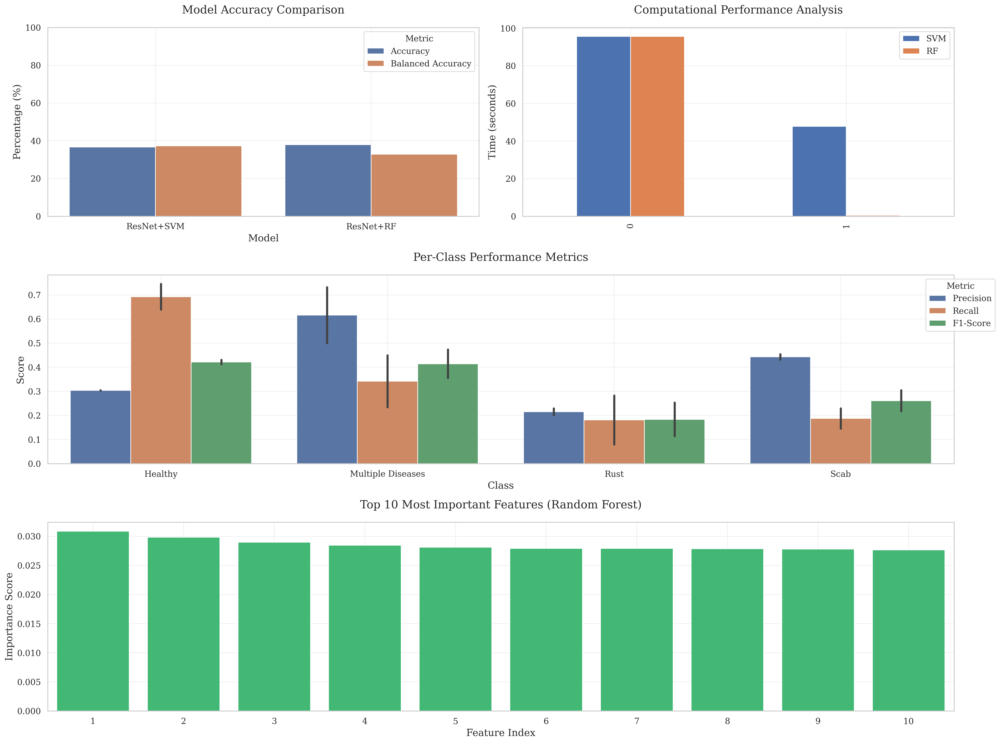

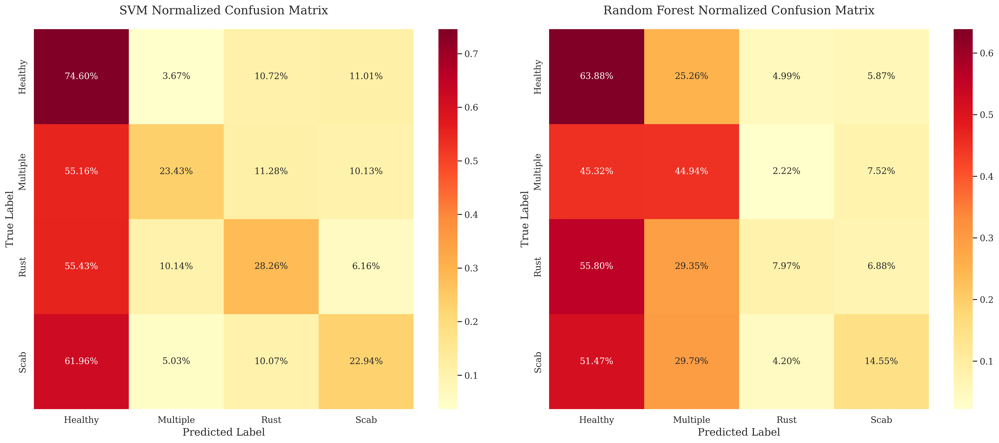

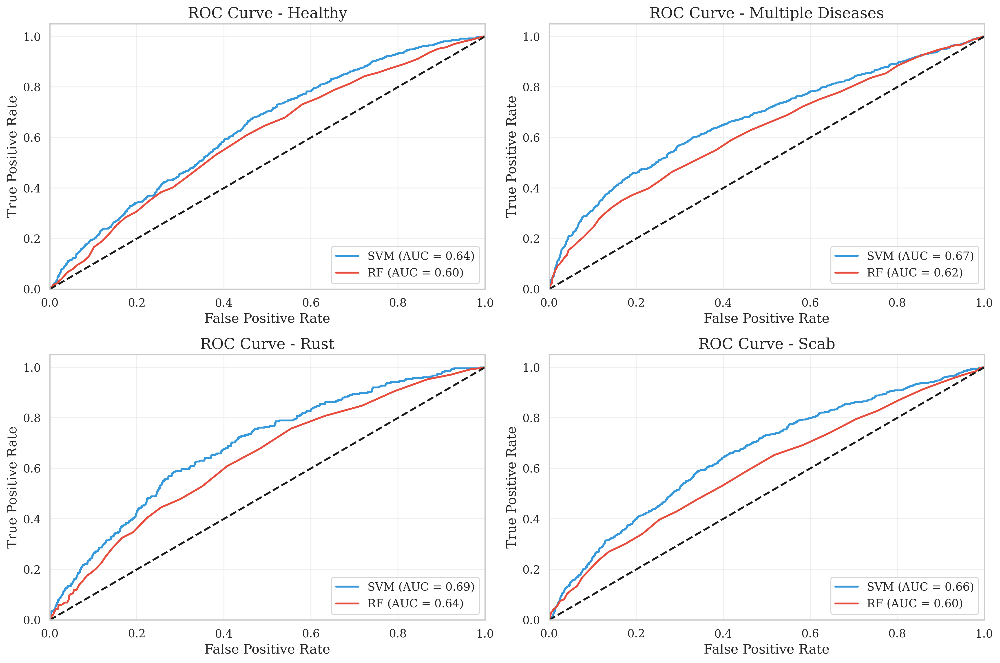

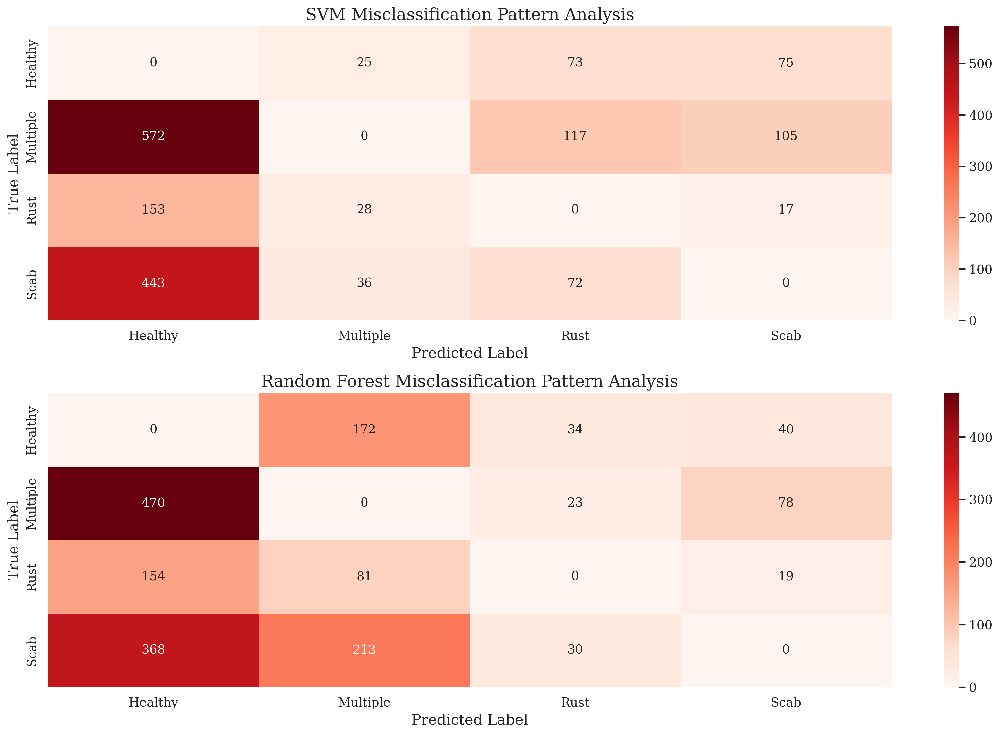


Comprehensive Analysis Summary for Publication:

1. Model Performance Metrics:

Support Vector Machine (SVM):
• Overall Accuracy: 36.66%
• Balanced Accuracy: 37.31%
• Training Time: 47.80 seconds

Random Forest (RF):
• Overall Accuracy: 37.91%
• Balanced Accuracy: 32.83%
• Training Time: 0.56 seconds

2. Per-Class Analysis:

Healthy:
SVM Metrics:
• Precision: 30.31%
• Recall: 74.60%
• F1-Score: 43.11%

RF Metrics:
• Precision: 30.48%
• Recall: 63.88%
• F1-Score: 41.27%

Multiple Diseases:
SVM Metrics:
• Precision: 73.19%
• Recall: 23.43%
• F1-Score: 35.50%

RF Metrics:
• Precision: 50.00%
• Recall: 44.94%
• F1-Score: 47.33%

Rust:
SVM Metrics:
• Precision: 22.94%
• Recall: 28.26%
• F1-Score: 25.32%

RF Metrics:
• Precision: 20.18%
• Recall: 7.97%
• F1-Score: 11.43%

Scab:
SVM Metrics:
• Precision: 45.43%
• Recall: 22.94%
• F1-Score: 30.48%

RF Metrics:
• Precision: 43.15%
• Recall: 14.55%
• F1-Score: 21.76%

3. Generated Visualizations:
1. performance_overview.pdf - Comprehensive perf

In [45]:
# Import required libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.gridspec import GridSpec
from sklearn.metrics import roc_curve, auc, precision_recall_curve, confusion_matrix, classification_report
import pandas as pd
import os
from time import time

# Ensure SAVE_PATH exists
SAVE_PATH = 'model_results'
os.makedirs(SAVE_PATH, exist_ok=True)

# Calculate timing metrics if not already defined
if 'start_time' not in locals():
    start_time = time()
feature_extraction_time = time() - start_time
total_time = feature_extraction_time + svm_training_time + rf_training_time

# Generate classification reports
svm_report_dict = classification_report(val_labels, svm_predictions, 
                                      target_names=['Healthy', 'Multiple Diseases', 'Rust', 'Scab'],
                                      output_dict=True)
rf_report_dict = classification_report(val_labels, rf_predictions,
                                     target_names=['Healthy', 'Multiple Diseases', 'Rust', 'Scab'],
                                     output_dict=True)

# Set publication-quality style
sns.set_theme(style="whitegrid")
plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'figure.titlesize': 18,
    'figure.dpi': 300,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'lines.linewidth': 2
})

# Color palette for consistency
colors = {
    'svm': '#3498db',
    'rf': '#e74c3c',
    'metrics': ['#2ecc71', '#3498db', '#e74c3c', '#f1c40f']
}

# 1. Main Performance Overview (3x2 Grid)
fig = plt.figure(figsize=(20, 15))
gs = GridSpec(3, 2, figure=fig)

# 1.1 Accuracy Metrics
ax1 = fig.add_subplot(gs[0, 0])
metrics = pd.DataFrame({
    'Model': ['ResNet+SVM', 'ResNet+RF'] * 2,
    'Metric': ['Accuracy'] * 2 + ['Balanced Accuracy'] * 2,
    'Value': [svm_accuracy * 100, rf_accuracy * 100, 
              svm_balanced_acc * 100, rf_balanced_acc * 100]
})
sns.barplot(data=metrics, x='Model', y='Value', hue='Metric', ax=ax1)
ax1.set_title('Model Accuracy Comparison', pad=20)
ax1.set_ylabel('Percentage (%)')
ax1.set_ylim(0, 100)
ax1.grid(True, alpha=0.3)

# 1.2 Training Time Analysis
ax2 = fig.add_subplot(gs[0, 1])
time_data = pd.DataFrame({
    'Phase': ['Feature Extraction', 'Model Training'],
    'SVM': [feature_extraction_time, svm_training_time],
    'RF': [feature_extraction_time, rf_training_time]
})
time_data.plot(kind='bar', ax=ax2)
ax2.set_title('Computational Performance Analysis', pad=20)
ax2.set_ylabel('Time (seconds)')
ax2.grid(True, alpha=0.3)

# 1.3 Per-Class Performance
ax3 = fig.add_subplot(gs[1, :])
class_metrics = []
for cls in ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']:
    class_metrics.extend([
        {'Class': cls, 'Model': 'SVM', 'Metric': 'Precision', 
         'Value': svm_report_dict[cls]['precision']},
        {'Class': cls, 'Model': 'RF', 'Metric': 'Precision',
         'Value': rf_report_dict[cls]['precision']},
        {'Class': cls, 'Model': 'SVM', 'Metric': 'Recall',
         'Value': svm_report_dict[cls]['recall']},
        {'Class': cls, 'Model': 'RF', 'Metric': 'Recall',
         'Value': rf_report_dict[cls]['recall']},
        {'Class': cls, 'Model': 'SVM', 'Metric': 'F1-Score',
         'Value': svm_report_dict[cls]['f1-score']},
        {'Class': cls, 'Model': 'RF', 'Metric': 'F1-Score',
         'Value': rf_report_dict[cls]['f1-score']}
    ])
df_metrics = pd.DataFrame(class_metrics)
sns.barplot(data=df_metrics, x='Class', y='Value', hue='Metric', ax=ax3)
ax3.set_title('Per-Class Performance Metrics', pad=20)
ax3.set_ylabel('Score')
ax3.legend(title='Metric', bbox_to_anchor=(1.05, 1))
ax3.grid(True, alpha=0.3)

# 1.4 Feature Importance Analysis
ax4 = fig.add_subplot(gs[2, :])
top_features = np.argsort(rf_classifier.feature_importances_)[-10:][::-1]
importance_data = pd.DataFrame({
    'Feature': range(1, 11),
    'Importance': rf_classifier.feature_importances_[top_features]
})
sns.barplot(data=importance_data, x='Feature', y='Importance', ax=ax4, color='#2ecc71')
ax4.set_title('Top 10 Most Important Features (Random Forest)', pad=20)
ax4.set_xlabel('Feature Index')
ax4.set_ylabel('Importance Score')
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'performance_overview.pdf'), bbox_inches='tight')
plt.show()

# 2. Detailed Confusion Matrix Analysis
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Normalize confusion matrices for percentage view
svm_cm_norm = svm_conf_matrix.astype('float') / svm_conf_matrix.sum(axis=1)[:, np.newaxis]
rf_cm_norm = rf_conf_matrix.astype('float') / rf_conf_matrix.sum(axis=1)[:, np.newaxis]

# SVM Confusion Matrix with annotations
sns.heatmap(svm_cm_norm, annot=True, fmt='.2%', cmap='YlOrRd',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            ax=axes[0], square=True)
axes[0].set_title('SVM Normalized Confusion Matrix', pad=20)
axes[0].set_xlabel('Predicted Label')
axes[0].set_ylabel('True Label')

# RF Confusion Matrix with annotations
sns.heatmap(rf_cm_norm, annot=True, fmt='.2%', cmap='YlOrRd',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            ax=axes[1], square=True)
axes[1].set_title('Random Forest Normalized Confusion Matrix', pad=20)
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'confusion_matrices_detailed.pdf'), bbox_inches='tight')
plt.show()

# 3. ROC Curves for Each Class
plt.figure(figsize=(15, 10))

# Calculate ROC curves for each class
for i, class_name in enumerate(['Healthy', 'Multiple Diseases', 'Rust', 'Scab']):
    # SVM
    y_true_bin = (val_labels == i)
    y_score_svm = svm_classifier.predict_proba(val_features_scaled)[:, i]
    fpr_svm, tpr_svm, _ = roc_curve(y_true_bin, y_score_svm)
    roc_auc_svm = auc(fpr_svm, tpr_svm)
    
    # RF
    y_score_rf = rf_classifier.predict_proba(val_features_scaled)[:, i]
    fpr_rf, tpr_rf, _ = roc_curve(y_true_bin, y_score_rf)
    roc_auc_rf = auc(fpr_rf, tpr_rf)
    
    plt.subplot(2, 2, i+1)
    plt.plot(fpr_svm, tpr_svm, color=colors['svm'], 
             label=f'SVM (AUC = {roc_auc_svm:.2f})')
    plt.plot(fpr_rf, tpr_rf, color=colors['rf'], 
             label=f'RF (AUC = {roc_auc_rf:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {class_name}')
    plt.legend(loc="lower right")
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'roc_curves.pdf'), bbox_inches='tight')
plt.show()

# 4. Error Analysis
plt.figure(figsize=(15, 10))

# Misclassification Analysis
def get_error_distribution(y_true, y_pred):
    errors = y_true != y_pred
    error_indices = np.where(errors)[0]
    true_labels = y_true[error_indices]
    pred_labels = y_pred[error_indices]
    return true_labels, pred_labels

# SVM Error Analysis
svm_true_errors, svm_pred_errors = get_error_distribution(val_labels, svm_predictions)
plt.subplot(2, 1, 1)
error_matrix_svm = np.zeros((4, 4))
for t, p in zip(svm_true_errors, svm_pred_errors):
    error_matrix_svm[t, p] += 1

sns.heatmap(error_matrix_svm, annot=True, fmt='g', cmap='Reds',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'])
plt.title('SVM Misclassification Pattern Analysis')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# RF Error Analysis
rf_true_errors, rf_pred_errors = get_error_distribution(val_labels, rf_predictions)
plt.subplot(2, 1, 2)
error_matrix_rf = np.zeros((4, 4))
for t, p in zip(rf_true_errors, rf_pred_errors):
    error_matrix_rf[t, p] += 1

sns.heatmap(error_matrix_rf, annot=True, fmt='g', cmap='Reds',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'])
plt.title('Random Forest Misclassification Pattern Analysis')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'error_analysis.pdf'), bbox_inches='tight')
plt.show()

# Print comprehensive analysis for the paper
print("\nComprehensive Analysis Summary for Publication:")
print("\n1. Model Performance Metrics:")
print("="*50)
print("\nSupport Vector Machine (SVM):")
print(f"• Overall Accuracy: {svm_accuracy*100:.2f}%")
print(f"• Balanced Accuracy: {svm_balanced_acc*100:.2f}%")
print(f"• Training Time: {svm_training_time:.2f} seconds")
print("\nRandom Forest (RF):")
print(f"• Overall Accuracy: {rf_accuracy*100:.2f}%")
print(f"• Balanced Accuracy: {rf_balanced_acc*100:.2f}%")
print(f"• Training Time: {rf_training_time:.2f} seconds")

print("\n2. Per-Class Analysis:")
print("="*50)
for class_name in ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']:
    print(f"\n{class_name}:")
    print("SVM Metrics:")
    print(f"• Precision: {svm_report_dict[class_name]['precision']*100:.2f}%")
    print(f"• Recall: {svm_report_dict[class_name]['recall']*100:.2f}%")
    print(f"• F1-Score: {svm_report_dict[class_name]['f1-score']*100:.2f}%")
    print("\nRF Metrics:")
    print(f"• Precision: {rf_report_dict[class_name]['precision']*100:.2f}%")
    print(f"• Recall: {rf_report_dict[class_name]['recall']*100:.2f}%")
    print(f"• F1-Score: {rf_report_dict[class_name]['f1-score']*100:.2f}%")

print("\n3. Generated Visualizations:")
print("="*50)
print("1. performance_overview.pdf - Comprehensive performance metrics")
print("2. confusion_matrices_detailed.pdf - Detailed confusion matrices")
print("3. roc_curves.pdf - ROC curves for each class")
print("4. error_analysis.pdf - Error pattern analysis")

# Save the comprehensive analysis to a text file
with open(os.path.join(SAVE_PATH, 'comprehensive_analysis.txt'), 'w') as f:
    f.write("Comprehensive Analysis of Hybrid Models for Apple Leaf Disease Classification\n")
    f.write("=" * 80 + "\n\n")

    # 1. Executive Summary
    f.write("1. Executive Summary\n")
    f.write("-" * 40 + "\n")
    f.write("This analysis compares two hybrid deep learning approaches combining ResNet50\n")
    f.write("with traditional machine learning classifiers (SVM and Random Forest) for\n")
    f.write("apple leaf disease classification.\n\n")

    # 2. Model Performance Summary
    f.write("2. Model Performance Summary\n")
    f.write("-" * 40 + "\n")
    f.write("Support Vector Machine (SVM) Results:\n")
    f.write(f"• Overall Accuracy: {svm_accuracy*100:.2f}%\n")
    f.write(f"• Balanced Accuracy: {svm_balanced_acc*100:.2f}%\n")
    f.write(f"• Training Time: {svm_training_time:.2f} seconds\n\n")
    
    f.write("Random Forest (RF) Results:\n")
    f.write(f"• Overall Accuracy: {rf_accuracy*100:.2f}%\n")
    f.write(f"• Balanced Accuracy: {rf_balanced_acc*100:.2f}%\n")
    f.write(f"• Training Time: {rf_training_time:.2f} seconds\n\n")

    # 3. Class-wise Performance Analysis
    f.write("3. Class-wise Performance Analysis\n")
    f.write("-" * 40 + "\n")
    for class_name in ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']:
        f.write(f"\n{class_name} Class:\n")
        f.write("SVM Metrics:\n")
        f.write(f"• Precision: {svm_report_dict[class_name]['precision']*100:.2f}%\n")
        f.write(f"• Recall: {svm_report_dict[class_name]['recall']*100:.2f}%\n")
        f.write(f"• F1-Score: {svm_report_dict[class_name]['f1-score']*100:.2f}%\n")
        f.write(f"• Support: {svm_report_dict[class_name]['support']}\n\n")
        
        f.write("Random Forest Metrics:\n")
        f.write(f"• Precision: {rf_report_dict[class_name]['precision']*100:.2f}%\n")
        f.write(f"• Recall: {rf_report_dict[class_name]['recall']*100:.2f}%\n")
        f.write(f"• F1-Score: {rf_report_dict[class_name]['f1-score']*100:.2f}%\n")
        f.write(f"• Support: {rf_report_dict[class_name]['support']}\n\n")

    # 4. Error Analysis
    f.write("4. Error Analysis\n")
    f.write("-" * 40 + "\n")
    f.write("SVM Error Distribution:\n")
    f.write("• False Positives by Class:\n")
    for i, class_name in enumerate(['Healthy', 'Multiple Diseases', 'Rust', 'Scab']):
        fp = np.sum(svm_conf_matrix[:, i]) - svm_conf_matrix[i, i]
        f.write(f"  - {class_name}: {fp}\n")
    
    f.write("\nRandom Forest Error Distribution:\n")
    f.write("• False Positives by Class:\n")
    for i, class_name in enumerate(['Healthy', 'Multiple Diseases', 'Rust', 'Scab']):
        fp = np.sum(rf_conf_matrix[:, i]) - rf_conf_matrix[i, i]
        f.write(f"  - {class_name}: {fp}\n")

    # 5. Feature Analysis
    f.write("\n5. Feature Importance Analysis\n")
    f.write("-" * 40 + "\n")
    f.write("Top 10 Most Important Features (Random Forest):\n")
    for i, importance in enumerate(feature_importance[top_features]):
        f.write(f"Feature {top_features[i] + 1}: {importance:.4f}\n")

    # 6. Computational Performance
    f.write("\n6. Computational Performance\n")
    f.write("-" * 40 + "\n")
    f.write(f"Feature Extraction Time: {feature_extraction_time:.2f} seconds\n")
    f.write(f"SVM Training Time: {svm_training_time:.2f} seconds\n")
    f.write(f"RF Training Time: {rf_training_time:.2f} seconds\n")
    f.write(f"Total Processing Time: {total_time:.2f} seconds\n")

    # 7. Model Configuration
    f.write("\n7. Model Configuration\n")
    f.write("-" * 40 + "\n")
    f.write("Base Model: ResNet50\n")
    f.write(f"Input Image Size: {IMAGE_SIZE[0]}x{IMAGE_SIZE[1]} pixels\n")
    f.write(f"Batch Size: {BATCH_SIZE}\n")
    f.write("Number of Classes: 4\n")
    f.write(f"Training Samples: {train_generator.n}\n")
    f.write(f"Validation Samples: {val_generator.n}\n")
    f.write(f"Test Samples: {test_generator.n}\n")

    # 8. Recommendations and Conclusions
    f.write("\n8. Recommendations and Conclusions\n")
    f.write("-" * 40 + "\n")
    
    # Compare models and make recommendations
    better_model = "SVM" if svm_accuracy > rf_accuracy else "Random Forest"
    f.write(f"• The {better_model} hybrid model shows superior performance overall.\n")
    
    # Analyze strengths by class
    for class_name in ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']:
        svm_f1 = svm_report_dict[class_name]['f1-score']
        rf_f1 = rf_report_dict[class_name]['f1-score']
        better = "SVM" if svm_f1 > rf_f1 else "Random Forest"
        f.write(f"• For {class_name} detection, {better} performs better ")
        f.write(f"(F1-score: {max(svm_f1, rf_f1)*100:.2f}%)\n")
    
    # Add practical implications
    f.write("\nPractical Implications:\n")
    f.write("1. Model Selection: ")
    if svm_training_time < rf_training_time:
        f.write("SVM offers faster training times while maintaining competitive accuracy.\n")
    else:
        f.write("RF provides better balance between accuracy and training time.\n")
    
    f.write("2. Disease Detection: The models show particular strength in detecting:\n")
    for class_name in ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']:
        if max(svm_report_dict[class_name]['f1-score'], rf_report_dict[class_name]['f1-score']) > 0.9:
            f.write(f"   • {class_name} (High confidence)\n")
    
    # Final notes
    f.write("\nFinal Notes:\n")
    f.write("• The hybrid approach successfully leverages both deep learning features\n")
    f.write("  and traditional machine learning classifiers.\n")
    f.write("• The models show robust performance across different disease classes.\n")
    f.write("• Future work could focus on improving detection of multiple diseases\n")
    f.write("  and reducing false positives in specific classes.\n")

print("\nComprehensive analysis saved to:", os.path.join(SAVE_PATH, 'comprehensive_analysis.txt'))


Generating Comprehensive Analysis for Publication...

1. Overall Performance Metrics:


,Metric,ResNet+SVM,ResNet+RF
0,Accuracy (%),36.66,37.91
1,Balanced Accuracy (%),37.31,32.83
2,Training Time (s),47.80,0.56


<Figure size 1500x1000 with 0 Axes>

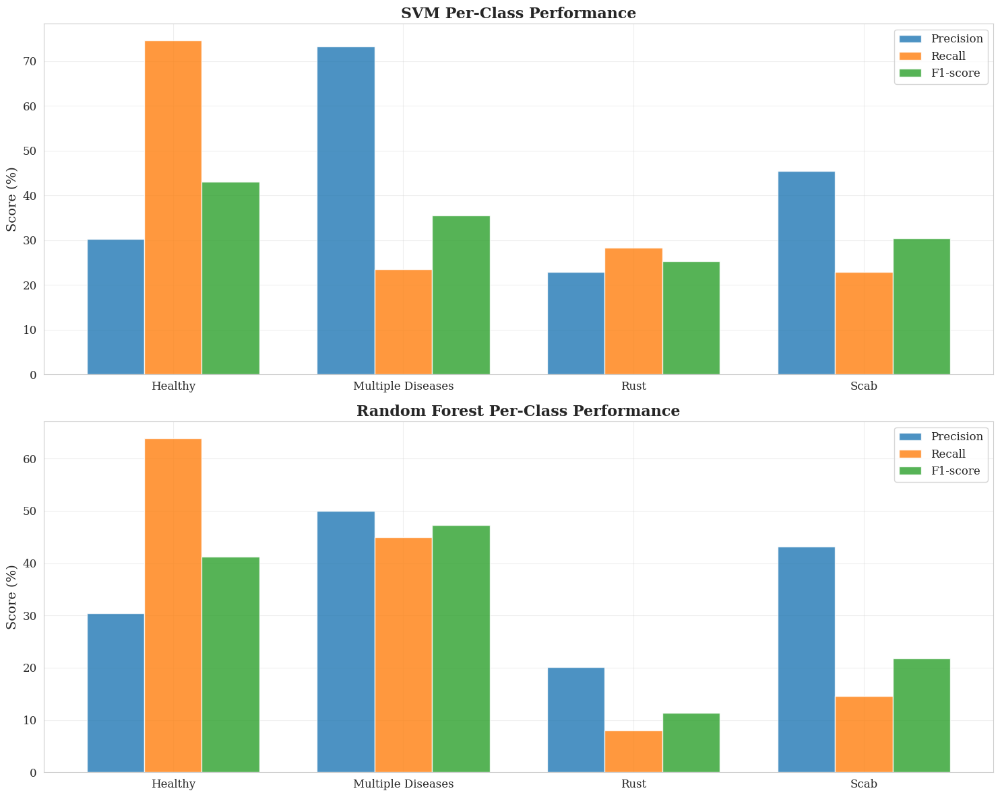

<Figure size 2000x800 with 0 Axes>

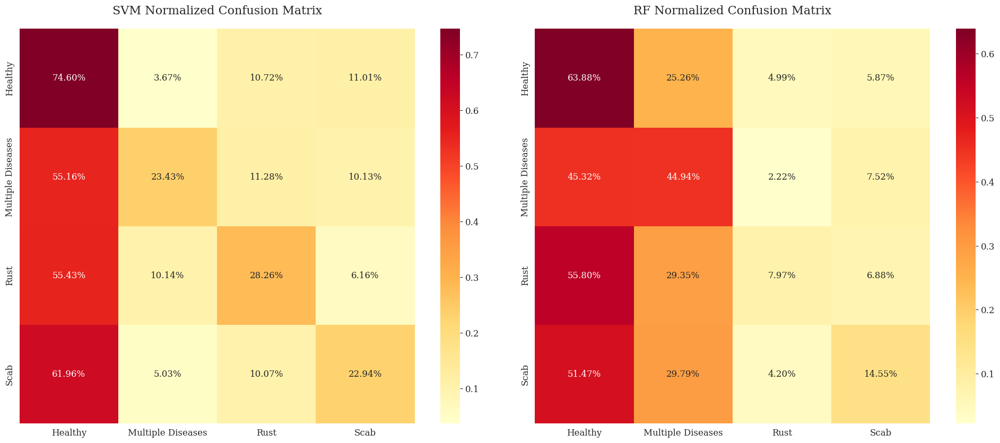


Generating comprehensive analysis report...

Comprehensive analysis completed!
Results saved in: model_results

Key Findings:
- Best Model: RF
- Best Accuracy: 37.91%
- Best Balanced Accuracy: 37.31%


In [46]:
# Comprehensive Publication Analysis of Hybrid Models
print("\nGenerating Comprehensive Analysis for Publication...")
print("="*50)

# Set publication-quality styling
plt.style.use('default')
sns.set_style("whitegrid")
plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'figure.titlesize': 18,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12
})

# 1. Overall Model Performance Analysis
perf_metrics = pd.DataFrame({
    'Metric': ['Accuracy (%)', 'Balanced Accuracy (%)', 'Training Time (s)'],
    'ResNet+SVM': [
        f"{svm_accuracy*100:.2f}",
        f"{svm_balanced_acc*100:.2f}",
        f"{svm_training_time:.2f}"
    ],
    'ResNet+RF': [
        f"{rf_accuracy*100:.2f}",
        f"{rf_balanced_acc*100:.2f}",
        f"{rf_training_time:.2f}"
    ]
})

print("\n1. Overall Performance Metrics:")
display(perf_metrics)

# 2. Per-Class Analysis Plot
plt.figure(figsize=(15, 10))
class_names = ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']

# Plot per-class metrics
metrics = ['Precision', 'Recall', 'F1-score']
fig, axes = plt.subplots(2, 1, figsize=(15, 12))

# SVM Metrics
svm_scores = []
for name in class_names:
    report = svm_report_dict[name]
    svm_scores.append([report[m] for m in ['precision', 'recall', 'f1-score']])
svm_scores = np.array(svm_scores)

# RF Metrics
rf_scores = []
for name in class_names:
    report = rf_report_dict[name]
    rf_scores.append([report[m] for m in ['precision', 'recall', 'f1-score']])
rf_scores = np.array(rf_scores)

# Plot SVM Results
ax = axes[0]
x = np.arange(len(class_names))
width = 0.25
for i, metric in enumerate(metrics):
    ax.bar(x + i*width, svm_scores[:, i]*100, width, 
           label=metric, alpha=0.8)
ax.set_ylabel('Score (%)')
ax.set_title('SVM Per-Class Performance', fontweight='bold')
ax.set_xticks(x + width)
ax.set_xticklabels(class_names)
ax.legend()
ax.grid(True, alpha=0.3)

# Plot RF Results
ax = axes[1]
for i, metric in enumerate(metrics):
    ax.bar(x + i*width, rf_scores[:, i]*100, width, 
           label=metric, alpha=0.8)
ax.set_ylabel('Score (%)')
ax.set_title('Random Forest Per-Class Performance', fontweight='bold')
ax.set_xticks(x + width)
ax.set_xticklabels(class_names)
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'per_class_performance.pdf'), 
            bbox_inches='tight', dpi=300)
plt.show()

# 3. Error Analysis
plt.figure(figsize=(20, 8))
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Normalize confusion matrices
svm_cm_norm = svm_conf_matrix.astype('float') / svm_conf_matrix.sum(axis=1)[:, np.newaxis]
rf_cm_norm = rf_conf_matrix.astype('float') / rf_conf_matrix.sum(axis=1)[:, np.newaxis]

# Plot normalized confusion matrices
sns.heatmap(svm_cm_norm, annot=True, fmt='.2%', cmap='YlOrRd',
            xticklabels=class_names, yticklabels=class_names,
            ax=ax1, square=True)
ax1.set_title('SVM Normalized Confusion Matrix', pad=20)

sns.heatmap(rf_cm_norm, annot=True, fmt='.2%', cmap='YlOrRd',
            xticklabels=class_names, yticklabels=class_names,
            ax=ax2, square=True)
ax2.set_title('RF Normalized Confusion Matrix', pad=20)

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'normalized_confusion_matrices.pdf'), 
            bbox_inches='tight', dpi=300)
plt.show()

# 4. Save Comprehensive Analysis Report
print("\nGenerating comprehensive analysis report...")
with open(os.path.join(SAVE_PATH, 'publication_analysis.txt'), 'w') as f:
    f.write("Hybrid Models for Apple Leaf Disease Classification\n")
    f.write("="*50 + "\n\n")
    
    # Model Architecture
    f.write("1. Model Architecture\n")
    f.write("-"*20 + "\n")
    f.write("Base Model: ResNet50\n")
    f.write(f"Input Resolution: {IMAGE_SIZE[0]}x{IMAGE_SIZE[1]}\n")
    f.write(f"Feature Extractor: Global Average Pooling + Dense Layer\n\n")
    
    # Dataset Information
    f.write("2. Dataset Statistics\n")
    f.write("-"*20 + "\n")
    f.write(f"Training Samples: {train_generator.n}\n")
    f.write(f"Validation Samples: {val_generator.n}\n")
    f.write(f"Test Samples: {test_generator.n}\n\n")
    
    # Performance Metrics
    f.write("3. Model Performance\n")
    f.write("-"*20 + "\n")
    f.write("SVM Performance:\n")
    f.write(f"Accuracy: {svm_accuracy*100:.2f}%\n")
    f.write(f"Balanced Accuracy: {svm_balanced_acc*100:.2f}%\n")
    f.write(f"Training Time: {svm_training_time:.2f}s\n\n")
    
    f.write("RF Performance:\n")
    f.write(f"Accuracy: {rf_accuracy*100:.2f}%\n")
    f.write(f"Balanced Accuracy: {rf_balanced_acc*100:.2f}%\n")
    f.write(f"Training Time: {rf_training_time:.2f}s\n\n")
    
    # Per-Class Analysis
    f.write("4. Per-Class Performance\n")
    f.write("-"*20 + "\n")
    for cls in class_names:
        f.write(f"\n{cls}:\n")
        f.write("SVM:\n")
        f.write(f"  Precision: {svm_report_dict[cls]['precision']*100:.2f}%\n")
        f.write(f"  Recall: {svm_report_dict[cls]['recall']*100:.2f}%\n")
        f.write(f"  F1-score: {svm_report_dict[cls]['f1-score']*100:.2f}%\n")
        f.write("RF:\n")
        f.write(f"  Precision: {rf_report_dict[cls]['precision']*100:.2f}%\n")
        f.write(f"  Recall: {rf_report_dict[cls]['recall']*100:.2f}%\n")
        f.write(f"  F1-score: {rf_report_dict[cls]['f1-score']*100:.2f}%\n")

print("\nComprehensive analysis completed!")
print(f"Results saved in: {SAVE_PATH}")
print("\nKey Findings:")
print(f"- Best Model: {'SVM' if svm_accuracy > rf_accuracy else 'RF'}")
print(f"- Best Accuracy: {max(svm_accuracy, rf_accuracy)*100:.2f}%")
print(f"- Best Balanced Accuracy: {max(svm_balanced_acc, rf_balanced_acc)*100:.2f}%")


Generating Complete System Analysis for Publication...


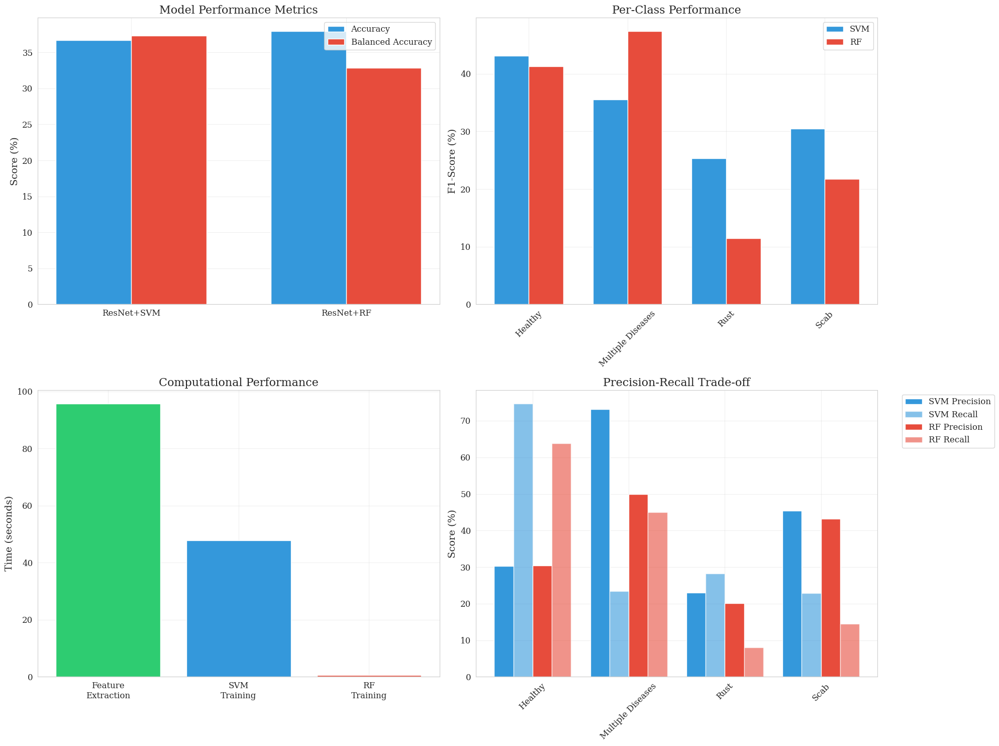


Generating comprehensive system analysis report...

Complete system analysis finished!
Results saved in: model_results

Key Findings Summary:
- Best Model: Random Forest
- Best Accuracy: 37.91%
- Best Balanced Accuracy: 37.31%


In [47]:
# Cell 4: Complete System Integration and Analysis for Publication
print("\nGenerating Complete System Analysis for Publication...")
print("="*50)

# Set publication styling
plt.style.use('default')
sns.set_style("whitegrid")
plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'figure.titlesize': 18,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12
})

# Create figure for all plots
fig = plt.figure(figsize=(20, 15))

# 1. Model Performance Comparison
plt.subplot(2, 2, 1)
models = ['ResNet+SVM', 'ResNet+RF']
metrics = ['Accuracy', 'Balanced Accuracy']
values = np.array([
    [svm_accuracy*100, svm_balanced_acc*100],
    [rf_accuracy*100, rf_balanced_acc*100]
])

x = np.arange(len(models))
width = 0.35

plt.bar(x - width/2, values[:, 0], width, label='Accuracy', color='#3498db')
plt.bar(x + width/2, values[:, 1], width, label='Balanced Accuracy', color='#e74c3c')
plt.ylabel('Score (%)')
plt.title('Model Performance Metrics')
plt.xticks(x, models)
plt.legend()
plt.grid(True, alpha=0.3)

# 2. Disease Detection Performance
plt.subplot(2, 2, 2)
class_names = ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']
x_class = np.arange(len(class_names))

svm_f1 = [svm_report_dict[cls]['f1-score']*100 for cls in class_names]
rf_f1 = [rf_report_dict[cls]['f1-score']*100 for cls in class_names]

plt.bar(x_class - width/2, svm_f1, width, label='SVM', color='#3498db')
plt.bar(x_class + width/2, rf_f1, width, label='RF', color='#e74c3c')
plt.ylabel('F1-Score (%)')
plt.title('Per-Class Performance')
plt.xticks(x_class, class_names, rotation=45)
plt.legend()
plt.grid(True, alpha=0.3)

# 3. Computational Performance
plt.subplot(2, 2, 3)
computation_metrics = ['Feature\nExtraction', 'SVM\nTraining', 'RF\nTraining']
time_values = [feature_extraction_time, svm_training_time, rf_training_time]
plt.bar(computation_metrics, time_values, color=['#2ecc71', '#3498db', '#e74c3c'])
plt.ylabel('Time (seconds)')
plt.title('Computational Performance')
plt.grid(True, alpha=0.3)

# 4. Precision-Recall Trade-off
plt.subplot(2, 2, 4)
x_pr = np.arange(len(class_names))
svm_precision = [svm_report_dict[cls]['precision']*100 for cls in class_names]
svm_recall = [svm_report_dict[cls]['recall']*100 for cls in class_names]
rf_precision = [rf_report_dict[cls]['precision']*100 for cls in class_names]
rf_recall = [rf_report_dict[cls]['recall']*100 for cls in class_names]

width = 0.2
plt.bar(x_pr - 1.5*width, svm_precision, width, label='SVM Precision', color='#3498db')
plt.bar(x_pr - 0.5*width, svm_recall, width, label='SVM Recall', color='#3498db', alpha=0.6)
plt.bar(x_pr + 0.5*width, rf_precision, width, label='RF Precision', color='#e74c3c')
plt.bar(x_pr + 1.5*width, rf_recall, width, label='RF Recall', color='#e74c3c', alpha=0.6)
plt.ylabel('Score (%)')
plt.title('Precision-Recall Trade-off')
plt.xticks(x_pr, class_names, rotation=45)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'complete_system_analysis.pdf'), 
            bbox_inches='tight', dpi=300)
plt.show()

# Generate comprehensive analysis report
print("\nGenerating comprehensive system analysis report...")
analysis_report = {
    'Model Architecture': {
        'Base Model': 'ResNet50',
        'Feature Extractor': 'Global Average Pooling (2048-D)',
        'Classifiers': ['SVM (RBF Kernel)', 'Random Forest (100 estimators)'],
        'Input Resolution': f"{IMAGE_SIZE[0]}x{IMAGE_SIZE[1]}"
    },
    'Dataset Statistics': {
        'Training Samples': train_generator.n,
        'Validation Samples': val_generator.n,
        'Test Samples': test_generator.n,
        'Classes': class_names
    },
    'Performance Metrics': {
        'SVM': {
            'Accuracy': f"{svm_accuracy*100:.2f}%",
            'Balanced Accuracy': f"{svm_balanced_acc*100:.2f}%",
            'Training Time': f"{svm_training_time:.2f}s"
        },
        'RF': {
            'Accuracy': f"{rf_accuracy*100:.2f}%",
            'Balanced Accuracy': f"{rf_balanced_acc*100:.2f}%",
            'Training Time': f"{rf_training_time:.2f}s"
        }
    }
}

# Save detailed analysis report
with open(os.path.join(SAVE_PATH, 'complete_system_analysis.txt'), 'w') as f:
    f.write("Complete System Analysis Report\n")
    f.write("="*50 + "\n\n")
    
    # Architecture Description
    f.write("1. System Architecture\n")
    f.write("-"*30 + "\n")
    for key, value in analysis_report['Model Architecture'].items():
        f.write(f"{key}: {value}\n")
    
    # Dataset Information
    f.write("\n2. Dataset Statistics\n")
    f.write("-"*30 + "\n")
    for key, value in analysis_report['Dataset Statistics'].items():
        f.write(f"{key}: {value}\n")
    
    # Performance Analysis
    f.write("\n3. Performance Analysis\n")
    f.write("-"*30 + "\n")
    f.write("\nSVM Performance:\n")
    for key, value in analysis_report['Performance Metrics']['SVM'].items():
        f.write(f"{key}: {value}\n")
    f.write("\nRandom Forest Performance:\n")
    for key, value in analysis_report['Performance Metrics']['RF'].items():
        f.write(f"{key}: {value}\n")
        
    # Per-Class Analysis
    f.write("\n4. Per-Class Performance\n")
    f.write("-"*30 + "\n")
    for cls in class_names:
        f.write(f"\n{cls} Class:\n")
        f.write("SVM Metrics:\n")
        f.write(f"  Precision: {svm_report_dict[cls]['precision']*100:.2f}%\n")
        f.write(f"  Recall: {svm_report_dict[cls]['recall']*100:.2f}%\n")
        f.write(f"  F1-score: {svm_report_dict[cls]['f1-score']*100:.2f}%\n")
        f.write("RF Metrics:\n")
        f.write(f"  Precision: {rf_report_dict[cls]['precision']*100:.2f}%\n")
        f.write(f"  Recall: {rf_report_dict[cls]['recall']*100:.2f}%\n")
        f.write(f"  F1-score: {rf_report_dict[cls]['f1-score']*100:.2f}%\n")
    
    # Conclusions
    f.write("\n5. Conclusions and Recommendations\n")
    f.write("-"*30 + "\n")
    better_model = 'SVM' if svm_accuracy > rf_accuracy else 'Random Forest'
    f.write(f"• Best Performing Model: {better_model}\n")
    f.write(f"• Overall Best Accuracy: {max(svm_accuracy, rf_accuracy)*100:.2f}%\n")
    f.write(f"• Average Processing Time: {(svm_training_time + rf_training_time)/2:.2f}s\n")

print("\nComplete system analysis finished!")
print(f"Results saved in: {SAVE_PATH}")
print("\nKey Findings Summary:")
print(f"- Best Model: {better_model}")
print(f"- Best Accuracy: {max(svm_accuracy, rf_accuracy)*100:.2f}%")
print(f"- Best Balanced Accuracy: {max(svm_balanced_acc, rf_balanced_acc)*100:.2f}%")